In [ ]:
pip install yahoo_fin

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.1/81.1 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.4/83.4 kB 9.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 11.6 MB/s eta 0:00:00
  Created wheel for bs4: filename=bs4-0.0.1-py3-none-any.whl size=1270 sha256=e301a97d91f94335cd7fe5df01af5d27306f408c4d8cd3cf628d5bccdefa3611
  Stored in directory: /root/.cache/pip/wheels/25/42/45/b773edc52acb16cd2db4cf1a0b47117e2f69bb4eb300ed0e70
  Created wheel for parse: filename=parse-1.19.0-py3-none-any.whl size=24589 sha256=4c577463acb21d6594dc1bf3449e4760db0de6eb8d5660e4f4ff5eadf16a46f3
  Stored in directory: /root/.cache/pip/wheels/70/4b/f0/ea

In [ ]:
import requests
import pandas as pd
import yfinance as yf
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.svm import SVR
from sklearn.metrics import accuracy_score, mean_squared_error
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
from datetime import datetime
import yahoo_fin.stock_info as si
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import TimeSeriesSplit, cross_val_score

from yahoo_fin import stock_info as si
import pandas as pd
from datetime import datetime
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

#from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima.model import ARIMA
#from statsmodels.tsa.arima.model import ARIMA

import pandas as pd
import numpy as np
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.svm import SVR, SVC
from sklearn.neural_network import MLPRegressor, MLPClassifier
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, precision_score, recall_score, f1_score

from keras.models import Sequential
from keras.layers import LSTM, Dense
from statsmodels.tsa.arima_model import ARIMA
#from fbprophet import Prophet

# Import necessary libraries
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
import statsmodels.api as sm

In [ ]:
data = pd.read_excel(r"Final_Dataset.xlsx")

In [ ]:
Dat_tab = data["Ticker"]

In [ ]:
tickers = Dat_tab.tolist()
tickers

['20MICRONS.NS',
 '21STCENMGM.NS',
 '3PLAND.NS',
 '3RDROCK.NS',
 '5PAISA.NS',
 'A2ZINFRA.NS',
 'AAKASH.NS',
 'AARON.NS',
 'AARTIDRUGS.NS',
 'AARTIIND.NS',
 'AARVEEDEN.NS',
 'AARVI.NS',
 'AAVAS.NS',
 'ABAN.NS',
 'ABB.NS',
 'POWERINDIA.NS',
 'ACC.NS',
 'ACCELYA.NS',
 'ACCURACY.NS',
 'ACEINTEG.NS',
 'ACE.NS',
 'ADANIENT.NS',
 'ADANIGREEN.NS',
 'ADANIPORTS.NS',
 'ADANIPOWER.NS',
 'ADANITRANS.NS',
 'ADFFOODS.NS',
 'ABCAPITAL.NS',
 'ABFRL.NS',
 'BIRLAMONEY.NS',
 'ADORWELD.NS',
 'ADROITINFO.NS',
 'ADVENZYMES.NS',
 'ADVANIHOTR.NS',
 'AEGISCHEM.NS',
 'AFFLE.NS',
 'AGARIND.NS',
 'AGRITECH.NS',
 'AGROPHOS.NS',
 'ATFL.NS',
 'AHLADA.NS',
 'AHLUCONT.NS',
 'AIAENG.NS',
 'AIRAN.NS',
 'AIROLAM.NS',
 'AJANTPHARM.NS',
 'AJMERA.NS',
 'AJOONI.NS',
 'AKG.NS',
 'AKSHOPTFBR.NS',
 'AKSHARCHEM.NS',
 'AKZOINDIA.NS',
 'ALANKIT.NS',
 'ALBERTDAVD.NS',
 'ALCHEM.NS',
 'APLLTD.NS',
 'ALICON.NS',
 'ALKALI.NS',
 'ALKEM.NS',
 'ALKYLAMINE.NS',
 'ALLCARGO.NS',
 'ADSL.NS',
 'ALLSEC.NS',
 'ALMONDZ.NS',
 'ALOKINDS.NS',
 'ALPA

Weightage Selection

In [ ]:
import re

def convert_to_number(value):
    if isinstance(value, str):
        value = value.upper().replace(',', '').strip()
        if value.endswith('T'):
            return float(re.sub('T$', '', value)) * 10**12
        elif value.endswith('B'):
            return float(re.sub('B$', '', value)) * 10**9
        elif value.endswith('M'):
            return float(re.sub('M$', '', value)) * 10**6
        elif value.endswith('k'):
            return float(re.sub('k$', '', value)) * 10**3
        else:
            try:
                return float(value)
            except ValueError:
                return None
    else:
        return value

In [ ]:
# Apply the function to all relevant columns
suffix_cols = ['Market Cap (intraday)', 'Enterprise Value','Trailing P/E','Price/Sales (ttm)', 'Enterprise Value/Revenue', 'Enterprise Value/EBITDA', 'EPS (TTM)', 'Avg. Volume', '200-Day Moving Average 3', 'Revenue (ttm)', 'Revenue Per Share (ttm)', 'Gross Profit (ttm)', 'Book Value Per Share (mrq)']
data[suffix_cols] = data[suffix_cols].applymap(convert_to_number)

In [ ]:
data

,Ticker,Price,Market Cap (intraday),Enterprise Value,Trailing P/E,Price/Sales (ttm),Price/Book (mrq),Enterprise Value/Revenue,Enterprise Value/EBITDA,EPS (TTM),...,Profit Margin,Operating Margin (ttm),Revenue (ttm),Revenue Per Share (ttm),Quarterly Revenue Growth (yoy),Gross Profit (ttm),Book Value Per Share (mrq),Dividend Yield,Dividend,Sector
0,20MICRONS.NS,77.35,2.700000e+09,3.580000e+09,6.26,0.39,1.06,0.51,5.15,12.100,...,6.16%,10.70%,7.010000e+09,198.67,-3.90%,2.940000e+09,71.27,0.00,0.0,Chemicals
1,21STCENMGM.NS,20.35,2.058000e+08,3.403000e+08,13.40,4.17,0.69,-0.13,-1.72,15.050,...,0.00%,112.80%,-1.759800e+08,-16.76,NaN,-1.766800e+08,28.40,0.00,0.0,Investment Banking & Investment Services
2,3PLAND.NS,20.10,3.636000e+08,-1.698600e+08,24.22,20.07,0.53,-9.39,-12.03,NaN,...,NaN,NaN,NaN,NaN,NaN,1.690000e+07,NaN,0.00,0.0,Real Estate Operations
3,3RDROCK.NS,64.60,1.460000e+09,1.450000e+09,NaN,9.69,5.98,9.66,336.76,0.040,...,2.29%,3.94%,3.911500e+08,54.93,NaN,2.015000e+07,10.47,0.00,0.0,Media & Publishing
4,5PAISA.NS,296.00,8.910000e+09,-1.260000e+09,26.55,3.48,2.03,-0.49,-1.69,11.280,...,10.61%,14.09%,3.160000e+09,104.50,5.60%,2.780000e+09,142.70,0.00,0.0,Investment Banking & Investment Services
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1582,ZICOM.NS,1.60,7.297000e+07,9.040000e+09,NaN,0.11,NaN,14.60,-24.68,-27.542,...,-15.84%,-59.00%,1.382000e+07,0.32,-68.40%,2.650000e+06,-203.49,0.00,0.0,Professional & Commercial Services
1583,ZODIACLOTH.NS,96.75,2.290000e+09,3.020000e+09,NaN,1.43,0.94,1.81,631.18,-13.740,...,-6.64%,-14.17%,1.640000e+09,66.28,54.10%,7.116900e+08,108.02,0.00,0.0,Textiles & Apparel
1584,ZOTA.NS,315.90,7.910000e+09,8.040000e+09,167.35,6.18,8.83,6.33,62.59,0.500,...,1.85%,3.27%,1.310000e+09,48.13,10.10%,4.453900e+08,28.40,0.48,1.5,Pharmaceuticals
1585,ZUARI.NS,150.40,6.330000e+09,2.482000e+10,0.66,0.15,0.51,0.60,1.64,-110.470,...,25.37%,4.76%,4.073000e+10,971.96,59.60%,1.198000e+10,58.07,0.00,0.0,Chemicals


In [ ]:
# Check data types of the columns
print(data.dtypes)

Ticker                             object
Price                             float64
Market Cap (intraday)             float64
Enterprise Value                  float64
Trailing P/E                      float64
Price/Sales (ttm)                 float64
Price/Book (mrq)                  float64
Enterprise Value/Revenue          float64
Enterprise Value/EBITDA           float64
EPS (TTM)                         float64
Beta (5Y Monthly)                 float64
Avg. Volume                       float64
200-Day Moving Average 3          float64
Profit Margin                      object
Operating Margin (ttm)             object
Revenue (ttm)                     float64
Revenue Per Share (ttm)           float64
Quarterly Revenue Growth (yoy)     object
Gross Profit (ttm)                float64
Book Value Per Share (mrq)        float64
Dividend Yield                    float64
Dividend                          float64
Sector                             object
dtype: object


In [ ]:
# Convert data type to string
data['Profit Margin'] = data['Profit Margin'].astype(str)

# Convert 'Profit_Margin' data type from object to float64
data['Profit Margin'] = data['Profit Margin'].str.replace('%', '').astype(float) / 100

# Show the updated data type and values of the 'Profit_Margin' column
print(data['Profit Margin'].dtype)
print(data['Profit Margin'])

float64
0       0.0616
1       0.0000
2          NaN
3       0.0229
4       0.1061
         ...  
1582   -0.1584
1583   -0.0664
1584    0.0185
1585    0.2537
1586    0.1370
Name: Profit Margin, Length: 1587, dtype: float64


In [ ]:
# Convert data type to string
data['Quarterly Revenue Growth (yoy)'] = data['Quarterly Revenue Growth (yoy)'].astype(str)

# Convert 'Profit_Margin' data type from object to float64
data['Quarterly Revenue Growth (yoy)'] = data['Quarterly Revenue Growth (yoy)'].str.replace('%', '').astype(float) / 100

# Show the updated data type and values of the 'Profit_Margin' column
print(data['Quarterly Revenue Growth (yoy)'].dtype)
print(data['Quarterly Revenue Growth (yoy)'])

float64
0      -0.039
1         NaN
2         NaN
3         NaN
4       0.056
        ...  
1582   -0.684
1583    0.541
1584    0.101
1585    0.596
1586    0.073
Name: Quarterly Revenue Growth (yoy), Length: 1587, dtype: float64


In [ ]:
# Convert data type to string
data['Operating Margin (ttm)'] = data['Operating Margin (ttm)'].astype(str)

# Convert 'Profit_Margin' data type from object to float64
data['Operating Margin (ttm)'] = data['Operating Margin (ttm)'].str.replace('%', '').astype(float) / 100

# Show the updated data type and values of the 'Profit_Margin' column
print(data['Operating Margin (ttm)'].dtype)
print(data['Operating Margin (ttm)'])

float64
0       0.1070
1       1.1280
2          NaN
3       0.0394
4       0.1409
         ...  
1582   -0.5900
1583   -0.1417
1584    0.0327
1585    0.0476
1586    0.1406
Name: Operating Margin (ttm), Length: 1587, dtype: float64


In [ ]:
print(data.dtypes)

Ticker                             object
Price                             float64
Market Cap (intraday)             float64
Enterprise Value                  float64
Trailing P/E                      float64
Price/Sales (ttm)                 float64
Price/Book (mrq)                  float64
Enterprise Value/Revenue          float64
Enterprise Value/EBITDA           float64
EPS (TTM)                         float64
Beta (5Y Monthly)                 float64
Avg. Volume                       float64
200-Day Moving Average 3          float64
Profit Margin                     float64
Operating Margin (ttm)            float64
Revenue (ttm)                     float64
Revenue Per Share (ttm)           float64
Quarterly Revenue Growth (yoy)    float64
Gross Profit (ttm)                float64
Book Value Per Share (mrq)        float64
Dividend Yield                    float64
Dividend                          float64
Sector                             object
dtype: object


In [ ]:
data.columns

Index(['Ticker', 'Price', 'Market Cap (intraday)', 'Enterprise Value',
       'Trailing P/E', 'Price/Sales (ttm)', 'Price/Book (mrq)',
       'Enterprise Value/Revenue', 'Enterprise Value/EBITDA', 'EPS (TTM)',
       'Beta (5Y Monthly)', 'Avg. Volume', '200-Day Moving Average 3',
       'Profit Margin', 'Operating Margin (ttm)', 'Revenue (ttm)',
       'Revenue Per Share (ttm)', 'Quarterly Revenue Growth (yoy)',
       'Gross Profit (ttm)', 'Book Value Per Share (mrq)', 'Dividend Yield',
       'Dividend', 'Sector'],
      dtype='object')

Selecting Weights for Algorithm to be used

In [ ]:
from sklearn.linear_model import LinearRegression
from scipy import stats

# Drop irrelevant features
df = data.drop(['Ticker','Sector',"Beta (5Y Monthly)","Revenue (ttm)",'Avg. Volume','200-Day Moving Average 3', 'Operating Margin (ttm)','Revenue Per Share (ttm)','Quarterly Revenue Growth (yoy)','Book Value Per Share (mrq)'], axis=1)
df

,Price,Market Cap (intraday),Enterprise Value,Trailing P/E,Price/Sales (ttm),Price/Book (mrq),Enterprise Value/Revenue,Enterprise Value/EBITDA,EPS (TTM),Profit Margin,Gross Profit (ttm),Dividend Yield,Dividend
0,77.35,2.700000e+09,3.580000e+09,6.26,0.39,1.06,0.51,5.15,12.100,0.0616,2.940000e+09,0.00,0.0
1,20.35,2.058000e+08,3.403000e+08,13.40,4.17,0.69,-0.13,-1.72,15.050,0.0000,-1.766800e+08,0.00,0.0
2,20.10,3.636000e+08,-1.698600e+08,24.22,20.07,0.53,-9.39,-12.03,NaN,NaN,1.690000e+07,0.00,0.0
3,64.60,1.460000e+09,1.450000e+09,NaN,9.69,5.98,9.66,336.76,0.040,0.0229,2.015000e+07,0.00,0.0
4,296.00,8.910000e+09,-1.260000e+09,26.55,3.48,2.03,-0.49,-1.69,11.280,0.1061,2.780000e+09,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1582,1.60,7.297000e+07,9.040000e+09,NaN,0.11,NaN,14.60,-24.68,-27.542,-0.1584,2.650000e+06,0.00,0.0
1583,96.75,2.290000e+09,3.020000e+09,NaN,1.43,0.94,1.81,631.18,-13.740,-0.0664,7.116900e+08,0.00,0.0
1584,315.90,7.910000e+09,8.040000e+09,167.35,6.18,8.83,6.33,62.59,0.500,0.0185,4.453900e+08,0.48,1.5
1585,150.40,6.330000e+09,2.482000e+10,0.66,0.15,0.51,0.60,1.64,-110.470,0.2537,1.198000e+10,0.00,0.0


In [ ]:
print(df.dtypes)

Price                       float64
Market Cap (intraday)       float64
Enterprise Value            float64
Trailing P/E                float64
Price/Sales (ttm)           float64
Price/Book (mrq)            float64
Enterprise Value/Revenue    float64
Enterprise Value/EBITDA     float64
EPS (TTM)                   float64
Profit Margin               float64
Gross Profit (ttm)          float64
Dividend Yield              float64
Dividend                    float64
dtype: object


In [ ]:
# Preprocess data
df = df.dropna()
df = df[(np.abs(stats.zscore(df)) < 3).all(axis=1)] # remove outliers
X = df.drop(['Profit Margin'], axis=1)
y = df['Profit Margin']

# Add 'Price' column to features
X['Price'] = df['Price']

# Normalize the data
X = (X - X.mean()) / X.std()

# Train linear regression model
model = LinearRegression().fit(X, y)

# Get the coefficients for each feature
coefficients = model.coef_

weights = coefficients / np.sum(np.abs(coefficients))

for i, column in enumerate(X.columns):
    print(f"{column}: {weights[i]}")

total_weightage = np.sum(weights)
print(f"Total weightage: {total_weightage}")

# Normalize weights to sum up to 1
weights = weights / np.sum(weights)

print("Normalized weights:")
for i, column in enumerate(X.columns):
    print(f"{column}: {weights[i]}")
    
if np.isclose(np.sum(weights), 1.0):
    print("Total weightage equals 1.")
else:
    print("Total weightage does not equal 1. Please check the coefficients.")

Price: 0.0003489051448460432
Market Cap (intraday): -0.013120844241409982
Enterprise Value: 0.04049895460501899
Trailing P/E: -0.16421042107555855
Price/Sales (ttm): 0.3609571586700263
Price/Book (mrq): -0.027657032469705876
Enterprise Value/Revenue: 0.09886826339393393
Enterprise Value/EBITDA: -0.10243253061596226
EPS (TTM): 0.06466830026335812
Gross Profit (ttm): -0.03209329915305351
Dividend Yield: 0.08994457432273426
Dividend: 0.0051997160443919554
Total weightage: 0.3209717448886194
Normalized weights:
Price: 0.0010870275979186796
Market Cap (intraday): -0.04087850239267339
Enterprise Value: 0.12617607390666913
Trailing P/E: -0.5116039766445527
Price/Sales (ttm): 1.1245761174251716
Price/Book (mrq): -0.08616656422297594
Enterprise Value/Revenue: 0.3080279338240263
Enterprise Value/EBITDA: -0.31913254748173375
EPS (TTM): 0.20147661373059086
Gross Profit (ttm): -0.09998792624001912
Dividend Yield: 0.28022583219574665
Dividend: 0.016199918301831557
Total weightage equals 1.


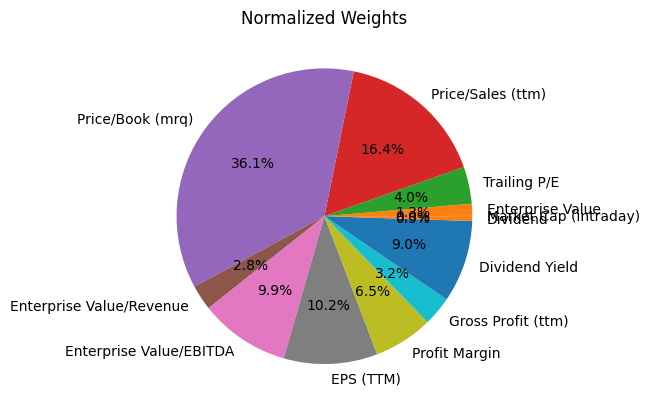

In [ ]:
# Normalize weights to sum up to 1
weights = weights / np.sum(weights)

# Convert any negative values to positive values
weights = np.abs(weights)

# Create a pie chart of normalized weights
plt.pie(weights, labels=df.columns[1:], autopct='%1.1f%%')
plt.title('Normalized Weights')
plt.show()

Use Multi Linear Regression

In [ ]:
factors = ["Market Cap (intraday)", "Enterprise Value", "Trailing P/E", "Price/Sales (ttm)", "Price/Book (mrq)", "Enterprise Value/Revenue", "Enterprise Value/EBITDA",'EPS (TTM)',"Profit Margin",  "Gross Profit (ttm)","Dividend Yield", "Dividend"]

In [ ]:
sectors = data["Sector"].unique()

In [ ]:
sectors

array(['Chemicals', 'Investment Banking & Investment Services',
       'Real Estate Operations', 'Media & Publishing',
       'Construction & Engineering',
       'Oil & Gas Related Equipment and Services',
       'Machinery, Equipment & Components', 'Pharmaceuticals',
       'Textiles & Apparel', 'Professional & Commercial Services',
       'Banking Services', 'Diversified Industrial Goods Wholesale',
       'Construction Materials', 'Software & IT Services',
       'Freight & Logistics Services', 'Electrical Utilities & IPPs',
       'Transport Infrastructure', 'Food & Tobacco', 'Insurance',
       'Specialty Retailers', 'Hotels & Entertainment Services',
       'Homebuilding & Construction Supplies', 'Paper & Forest Products',
       'Food & Drug Retailing', 'Communications & Networking',
       'Automobiles & Auto Parts',
       'Computers, Phones & Household Electronics',
       'Containers & Packaging', 'Coal', 'Metals & Mining',
       'Healthcare Providers & Services', 'Aerospa

In [ ]:
factors1 = {
    'Market Cap (intraday)': 0.0011760115832118486,
    'Enterprise Value': -0.04074949514972337,
    'Trailing P/E': 0.12583953287493094,
    'Price/Sales (ttm)': -0.5112851350345458,
    'Price/Book (mrq)': 1.1236542788901878,
    'Enterprise Value/Revenue': -0.08596840219977696,
    'Enterprise Value/EBITDA': 0.30838491934242973,
    'EPS (TTM)': -0.31911894287010617,
    'Profit Margin': 0.20137724856818778,
    'Gross Profit (ttm)': -0.09967515393906008,
    'Dividend Yield': 0.2801464470949708,
    'Dividend': 0.016218690839293205
    }

In [ ]:
selected_stocks = {}

# Define columns to select in the dataframe
cols_to_select = ["Market Cap (intraday)", "Enterprise Value", "Trailing P/E", "Price/Sales (ttm)",
                  "Price/Book (mrq)", "Enterprise Value/Revenue", "Enterprise Value/EBITDA", 
                  "Gross Profit (ttm)", "Book Value Per Share (mrq)", 
                  "Price", "Dividend Yield", "Dividend", "Sector", "Score"]

# Create an empty dataframe to store the selected stocks
selected_stocks_df = pd.DataFrame(columns=cols_to_select)

for sector in sectors:
    sector_data = data[data["Sector"] == sector]
    sector_data = sector_data.set_index("Ticker")

    # Create a dataframe for all stocks in sector_data
    all_stocks_data = pd.DataFrame(sector_data)

    # Compute the score for each stock based on the factors and their weights
    all_stocks_data["Score"] = sum(
        all_stocks_data[factor1] * weight for factor1, weight in factors1.items()
        if pd.api.types.is_numeric_dtype(all_stocks_data[factor1])
    )

    # Select the top 10 stocks with the highest scores
    selected_tickers = all_stocks_data["Score"].nlargest(5).index.tolist()
    selected_stocks[sector] = selected_tickers
    
    # Print the top 10 stocks for the current sector
    print(f"Top 15 stocks in {sector}:")
    print(", ".join(selected_stocks[sector]))
    print()

    # Add the selected stocks to the dataframe
    selected_stocks_df = selected_stocks_df.append(all_stocks_data.loc[selected_tickers, cols_to_select])

Top 15 stocks in Chemicals:
TAINWALCHM.NS, ARVEE.NS, AGROPHOS.NS, SIKKO.NS, ALKALI.NS

Top 15 stocks in Investment Banking & Investment Services:
IITL.NS, 21STCENMGM.NS, DBSTOCKBRO.NS, HBSL.NS, INDBANK.NS

Top 15 stocks in Real Estate Operations:
AMJLAND.NS, PANSARI.NS, GEECEE.NS, SUMIT.NS, SHRADHA.NS

Top 15 stocks in Media & Publishing:
SILLYMONKS.NS, PNC.NS, PRESSMN.NS, DEN.NS, VERTOZ.NS

Top 15 stocks in Construction & Engineering:
COUNCODOS.NS, SETUINFRA.NS, HECPROJECT.NS, CORALFINAC.NS, UNIVASTU.NS

Top 15 stocks in Oil & Gas Related Equipment and Services:
AAKASH.NS, GLOBALVECT.NS, JINDRILL.NS, MANINDS.NS, SEAMECLTD.NS

Top 15 stocks in Machinery, Equipment & Components:
GODHA.NS, INDIANCARD.NS, AARON.NS, BEARDSELL.NS, GEEKAYWIRE.NS

Top 15 stocks in Pharmaceuticals:
BIOFILCHEM.NS, VAISHALI.NS, ALPA.NS, KILITCH.NS, SMSLIFE.NS

Top 15 stocks in Textiles & Apparel:
MITTAL.NS, LYPSAGEMS.NS, VCL.NS, SILGO.NS, BANARBEADS.NS

Top 15 stocks in Professional & Commercial Services:
ARENTE

<ipython-input-24-70c442db579f>:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selected_stocks_df = selected_stocks_df.append(all_stocks_data.loc[selected_tickers, cols_to_select])
<ipython-input-24-70c442db579f>:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selected_stocks_df = selected_stocks_df.append(all_stocks_data.loc[selected_tickers, cols_to_select])
<ipython-input-24-70c442db579f>:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selected_stocks_df = selected_stocks_df.append(all_stocks_data.loc[selected_tickers, cols_to_select])
<ipython-input-24-70c442db579f>:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selected_s

Top 15 stocks in Automobiles & Auto Parts:
MODIRUBBER.NS, SOMICONVEY.NS, JMA.NS, SINTERCOM.NS, OMAXAUTO.NS

Top 15 stocks in Computers, Phones & Household Electronics:
UNIVPHOTO.NS, PANACHE.NS, CEREBRAINT.NS, BPL.NS, TVSELECT.NS

Top 15 stocks in Containers & Packaging:
TOKYOPLAST.NS, ARROWGREEN.NS, WORTH.NS, AMDIND.NS, TPLPLASTEH.NS

Top 15 stocks in Coal:
ANIKINDS.NS, GMDCLTD.NS, COALINDIA.NS, MERCATOR.NS

Top 15 stocks in Metals & Mining:
NSIL.NS, CUBEXTUB.NS, SUPREMEENG.NS, KRITIKA.NS, GAL.NS

Top 15 stocks in Healthcare Providers & Services:
LOTUSEYE.NS, PAR.NS, SHALBY.NS, THYROCARE.NS, HCG.NS

Top 15 stocks in Aerospace & Defense:
APOLLO.NS, ZENTEC.NS, MAZDOCK.NS, BDL.NS, BEL.NS

Top 15 stocks in Professional & Business Education:
UMESLTD.NS, APTECHT.NS

Top 15 stocks in Beverages:
RKDL.NS, ASALCBR.NS, IFBAGRO.NS, GMBREW.NS, SDBL.NS

Top 15 stocks in Electronic Equipment & Parts:
MARINE.NS, KANORICHEM.NS, ASTRAMICRO.NS, PGEL.NS, HONAUT.NS

Top 15 stocks in Leisure Products:
ATLAS

<ipython-input-24-70c442db579f>:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selected_stocks_df = selected_stocks_df.append(all_stocks_data.loc[selected_tickers, cols_to_select])
<ipython-input-24-70c442db579f>:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selected_stocks_df = selected_stocks_df.append(all_stocks_data.loc[selected_tickers, cols_to_select])
<ipython-input-24-70c442db579f>:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selected_stocks_df = selected_stocks_df.append(all_stocks_data.loc[selected_tickers, cols_to_select])
<ipython-input-24-70c442db579f>:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selected_s

Top 15 stocks in Diversified Retail:
VMART.NS, SHOPERSTOP.NS, TRENT.NS

Top 15 stocks in Water Utilities:
WABAG.NS

Top 15 stocks in School, College & University:
ZEELEARN.NS



<ipython-input-24-70c442db579f>:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selected_stocks_df = selected_stocks_df.append(all_stocks_data.loc[selected_tickers, cols_to_select])
<ipython-input-24-70c442db579f>:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selected_stocks_df = selected_stocks_df.append(all_stocks_data.loc[selected_tickers, cols_to_select])
<ipython-input-24-70c442db579f>:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selected_stocks_df = selected_stocks_df.append(all_stocks_data.loc[selected_tickers, cols_to_select])


In [ ]:
selected_stocks_df

,Market Cap (intraday),Enterprise Value,Trailing P/E,Price/Sales (ttm),Price/Book (mrq),Enterprise Value/Revenue,Enterprise Value/EBITDA,Gross Profit (ttm),Book Value Per Share (mrq),Price,Dividend Yield,Dividend,Sector,Score
TAINWALCHM.NS,9.476200e+08,9.414100e+08,18.54,16.63,1.02,16.54,16.88,1.244000e+07,93.35,103.90,0.00,0.00,Chemicals,-3.848753e+07
ARVEE.NS,1.130000e+09,1.120000e+09,23.03,1.63,4.16,1.62,12.30,1.788800e+08,16.96,105.00,0.00,0.00,Chemicals,-6.214042e+07
AGROPHOS.NS,7.896800e+08,9.062800e+08,13.52,1.29,1.68,1.49,9.30,3.374000e+08,24.98,41.00,0.67,0.25,Chemicals,-6.963217e+07
SIKKO.NS,1.530000e+09,1.530000e+09,71.72,2.53,6.55,2.55,42.75,1.239900e+08,16.74,93.45,0.32,0.30,Chemicals,-7.290612e+07
ALKALI.NS,1.260000e+09,1.430000e+09,45.29,1.34,2.40,1.59,13.22,5.075500e+08,43.46,123.15,1.74,2.00,Chemicals,-1.073801e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VMART.NS,5.051000e+10,6.199000e+10,191.29,2.18,5.88,2.66,20.25,5.540000e+09,224.34,2542.00,0.03,0.75,Diversified Retail,-3.018861e+09
SHOPERSTOP.NS,7.378000e+10,9.289000e+10,84.88,1.96,61.21,2.45,13.88,9.000000e+09,-14.56,660.65,0.00,0.00,Diversified Retail,-4.595531e+09
TRENT.NS,4.720900e+11,5.126900e+11,120.80,6.43,19.82,6.98,39.68,2.016000e+10,65.07,1341.90,0.17,2.30,Diversified Retail,-2.234613e+10
WABAG.NS,2.066000e+10,2.078000e+10,12.38,0.69,1.29,0.72,8.44,4.550000e+09,241.75,323.80,0.00,0.00,Water Utilities,-1.276000e+09


In [ ]:
selected_stocks_df.index.name = 'Ticker'
selected_stocks_df

,Market Cap (intraday),Enterprise Value,Trailing P/E,Price/Sales (ttm),Price/Book (mrq),Enterprise Value/Revenue,Enterprise Value/EBITDA,Gross Profit (ttm),Book Value Per Share (mrq),Price,Dividend Yield,Dividend,Sector,Score
Ticker,,,,,,,,,,,,,,
TAINWALCHM.NS,9.476200e+08,9.414100e+08,18.54,16.63,1.02,16.54,16.88,1.244000e+07,93.35,103.90,0.00,0.00,Chemicals,-3.848753e+07
ARVEE.NS,1.130000e+09,1.120000e+09,23.03,1.63,4.16,1.62,12.30,1.788800e+08,16.96,105.00,0.00,0.00,Chemicals,-6.214042e+07
AGROPHOS.NS,7.896800e+08,9.062800e+08,13.52,1.29,1.68,1.49,9.30,3.374000e+08,24.98,41.00,0.67,0.25,Chemicals,-6.963217e+07
SIKKO.NS,1.530000e+09,1.530000e+09,71.72,2.53,6.55,2.55,42.75,1.239900e+08,16.74,93.45,0.32,0.30,Chemicals,-7.290612e+07
ALKALI.NS,1.260000e+09,1.430000e+09,45.29,1.34,2.40,1.59,13.22,5.075500e+08,43.46,123.15,1.74,2.00,Chemicals,-1.073801e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VMART.NS,5.051000e+10,6.199000e+10,191.29,2.18,5.88,2.66,20.25,5.540000e+09,224.34,2542.00,0.03,0.75,Diversified Retail,-3.018861e+09
SHOPERSTOP.NS,7.378000e+10,9.289000e+10,84.88,1.96,61.21,2.45,13.88,9.000000e+09,-14.56,660.65,0.00,0.00,Diversified Retail,-4.595531e+09
TRENT.NS,4.720900e+11,5.126900e+11,120.80,6.43,19.82,6.98,39.68,2.016000e+10,65.07,1341.90,0.17,2.30,Diversified Retail,-2.234613e+10


In [ ]:
selected_stocks_df.rename(columns = {'Market Cap (intraday)':'Market Capitalization', 'Trailing P/E':'PE Ratio',
                              'Price/Book (mrq)':'PB Ratio','Price/Sales (ttm)':'Price to Sales Ratio','Enterprise Value/Revenue':'Revenue','Enterprise Value/EBITDA':'EBITDA','Gross Profit (ttm)':'Gross Profit','Book Value Per Share (mrq)':'Book Value' }, inplace = True)

In [ ]:
selected_stocks

{'Chemicals': ['TAINWALCHM.NS',
  'ARVEE.NS',
  'AGROPHOS.NS',
  'SIKKO.NS',
  'ALKALI.NS'],
 'Investment Banking & Investment Services': ['IITL.NS',
  '21STCENMGM.NS',
  'DBSTOCKBRO.NS',
  'HBSL.NS',
  'INDBANK.NS'],
 'Real Estate Operations': ['AMJLAND.NS',
  'PANSARI.NS',
  'GEECEE.NS',
  'SUMIT.NS',
  'SHRADHA.NS'],
 'Media & Publishing': ['SILLYMONKS.NS',
  'PNC.NS',
  'PRESSMN.NS',
  'DEN.NS',
  'VERTOZ.NS'],
 'Construction & Engineering': ['COUNCODOS.NS',
  'SETUINFRA.NS',
  'HECPROJECT.NS',
  'CORALFINAC.NS',
  'UNIVASTU.NS'],
 'Oil & Gas Related Equipment and Services': ['AAKASH.NS',
  'GLOBALVECT.NS',
  'JINDRILL.NS',
  'MANINDS.NS',
  'SEAMECLTD.NS'],
 'Machinery, Equipment & Components': ['GODHA.NS',
  'INDIANCARD.NS',
  'AARON.NS',
  'BEARDSELL.NS',
  'GEEKAYWIRE.NS'],
 'Pharmaceuticals': ['BIOFILCHEM.NS',
  'VAISHALI.NS',
  'ALPA.NS',
  'KILITCH.NS',
  'SMSLIFE.NS'],
 'Textiles & Apparel': ['MITTAL.NS',
  'LYPSAGEMS.NS',
  'VCL.NS',
  'SILGO.NS',
  'BANARBEADS.NS'],
 'Pro

Fetch Historical Data

In [ ]:
historical_data = pd.DataFrame()

for sector, stocks in selected_stocks.items():
    for stock in stocks:
        try:
            # Load stock data
            data = si.get_data(stock, start_date="2013-01-01", end_date=datetime.today())
            #data = si.get_data(stock, start_date="2015-01-01", end_date='2023-01-01')

            # Add a column with the ticker symbol
            data['Sector'] = sector

            # Add the stock data to the DataFrame
            historical_data = historical_data.append(data)
        except AssertionError as error:
            print(f"Error retrieving data for {stock}: {error}")

<ipython-input-30-29afa71a0322>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  historical_data = historical_data.append(data)
<ipython-input-30-29afa71a0322>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  historical_data = historical_data.append(data)
<ipython-input-30-29afa71a0322>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  historical_data = historical_data.append(data)
<ipython-input-30-29afa71a0322>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  historical_data = historical_data.append(data)
<ipython-input-30-29afa71a0322>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

In [ ]:
historical_data

,open,high,low,close,adjclose,volume,ticker,Sector
2013-01-01,21.000000,22.100000,21.000000,21.150000,21.150000,752.0,TAINWALCHM.NS,Chemicals
2013-01-02,21.950001,21.950001,20.500000,21.049999,21.049999,98.0,TAINWALCHM.NS,Chemicals
2013-01-03,21.950001,21.950001,21.000000,21.000000,21.000000,503.0,TAINWALCHM.NS,Chemicals
2013-01-04,21.950001,21.950001,20.700001,20.750000,20.750000,40.0,TAINWALCHM.NS,Chemicals
2013-01-07,21.750000,21.750000,20.500000,21.450001,21.450001,2152.0,TAINWALCHM.NS,Chemicals
...,...,...,...,...,...,...,...,...
2023-04-28,3.450000,3.650000,3.350000,3.550000,3.550000,1591523.0,ZEELEARN.NS,"School, College & University"
2023-05-02,3.650000,3.700000,3.550000,3.550000,3.550000,814705.0,ZEELEARN.NS,"School, College & University"
2023-05-03,3.600000,3.650000,3.500000,3.600000,3.600000,536640.0,ZEELEARN.NS,"School, College & University"
2023-05-04,3.600000,3.750000,3.550000,3.650000,3.650000,1162455.0,ZEELEARN.NS,"School, College & University"


Historical data Preprocessing

In [ ]:
historical_data.isnull().sum(axis = 0)

open        809
high        809
low         809
close       809
adjclose    809
volume      809
ticker        0
Sector        0
dtype: int64

In [ ]:
# Drop Null Values
df_historical_data = historical_data.dropna()
df_historical_data

,open,high,low,close,adjclose,volume,ticker,Sector
2013-01-01,21.000000,22.100000,21.000000,21.150000,21.150000,752.0,TAINWALCHM.NS,Chemicals
2013-01-02,21.950001,21.950001,20.500000,21.049999,21.049999,98.0,TAINWALCHM.NS,Chemicals
2013-01-03,21.950001,21.950001,21.000000,21.000000,21.000000,503.0,TAINWALCHM.NS,Chemicals
2013-01-04,21.950001,21.950001,20.700001,20.750000,20.750000,40.0,TAINWALCHM.NS,Chemicals
2013-01-07,21.750000,21.750000,20.500000,21.450001,21.450001,2152.0,TAINWALCHM.NS,Chemicals
...,...,...,...,...,...,...,...,...
2023-04-28,3.450000,3.650000,3.350000,3.550000,3.550000,1591523.0,ZEELEARN.NS,"School, College & University"
2023-05-02,3.650000,3.700000,3.550000,3.550000,3.550000,814705.0,ZEELEARN.NS,"School, College & University"
2023-05-03,3.600000,3.650000,3.500000,3.600000,3.600000,536640.0,ZEELEARN.NS,"School, College & University"
2023-05-04,3.600000,3.750000,3.550000,3.650000,3.650000,1162455.0,ZEELEARN.NS,"School, College & University"


In [ ]:
df_historical_data.index.name = 'Date'

In [ ]:
# Check for missing values in the columns
df_historical_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 474264 entries, 2013-01-01 to 2023-05-05
Data columns (total 8 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   open      474264 non-null  float64
 1   high      474264 non-null  float64
 2   low       474264 non-null  float64
 3   close     474264 non-null  float64
 4   adjclose  474264 non-null  float64
 5   volume    474264 non-null  float64
 6   ticker    474264 non-null  object 
 7   Sector    474264 non-null  object 
dtypes: float64(6), object(2)
memory usage: 32.6+ MB


In [ ]:
df_historical_data.columns

Index(['open', 'high', 'low', 'close', 'adjclose', 'volume', 'ticker',
       'Sector'],
      dtype='object')

In [ ]:
#Round of all float values

float_cols = df_historical_data.select_dtypes(include=['float64'])
# round all values in float columns to 2 decimal places
rounded_float_cols = float_cols.round(2)
# replace original float columns with the rounded versions
df_historical_data[float_cols.columns] = rounded_float_cols

<ipython-input-37-e4f6f81740f1>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_historical_data[float_cols.columns] = rounded_float_cols


Feature Selection

In [ ]:
# Calculate the correlation matrix
corr_matrix = df_historical_data.corr()

<ipython-input-38-1801498b0aaf>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_historical_data.corr()


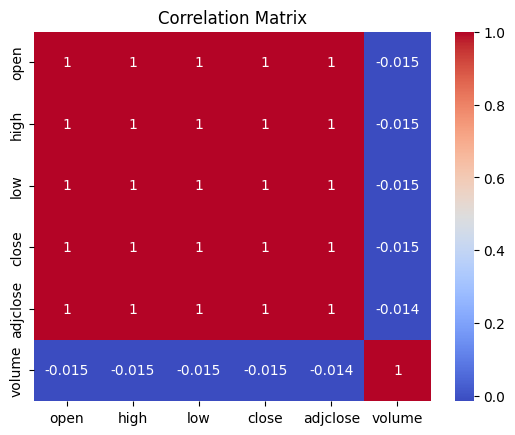

In [ ]:
# Plot the correlation matrix
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [ ]:
# Select the top 5 most correlated features
top_features = corr_matrix['close'].sort_values(ascending=False)[1:6]

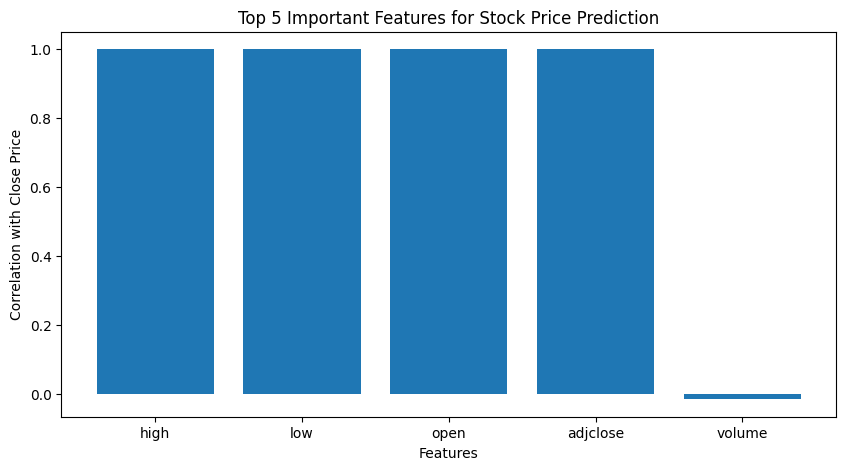

In [ ]:
# Plot the features in order of importance
plt.figure(figsize=(10, 5))
plt.bar(top_features.index, top_features.values)
plt.title('Top 5 Important Features for Stock Price Prediction')
plt.xlabel('Features')
plt.ylabel('Correlation with Close Price')
plt.show()

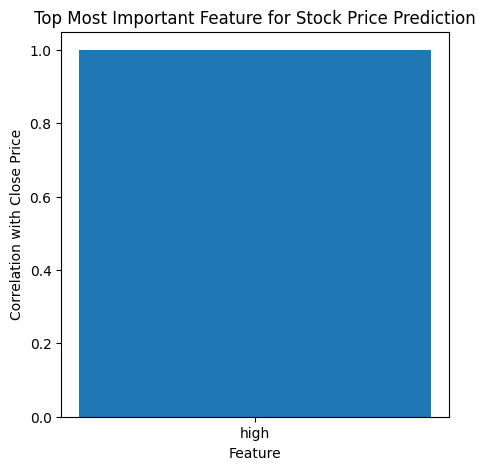

In [ ]:
# Select the top most correlated feature
top_feature = corr_matrix.loc['close'].drop('close').idxmax()

# Plot the feature
plt.figure(figsize=(5, 5))
plt.bar(top_feature, corr_matrix.loc['close', top_feature])
plt.title('Top Most Important Feature for Stock Price Prediction')
plt.xlabel('Feature')
plt.ylabel('Correlation with Close Price')
plt.show()


Train Test Split

In [ ]:
train_data, test_data = train_test_split(df_historical_data, test_size=0.2, random_state=42)

In [ ]:
train_data

,open,high,low,close,adjclose,volume,ticker,Sector
Date,,,,,,,,
2015-03-17,72.96,72.96,68.86,69.92,65.50,9675.0,GMBREW.NS,Beverages
2013-02-08,101.10,101.25,101.05,101.20,97.57,222882.0,BYKE.NS,Hotels & Entertainment Services
2017-10-11,168.00,193.70,168.00,171.85,167.92,799259.0,GEECEE.NS,Real Estate Operations
2022-06-08,116.00,116.00,114.65,115.35,109.48,60080.0,BALMLAWRIE.NS,Consumer Goods Conglomerates
2015-08-05,100.25,103.75,99.80,100.30,96.63,100168.0,PATINTLOG.NS,Freight & Logistics Services
...,...,...,...,...,...,...,...,...
2018-05-18,53.00,53.00,53.00,53.00,52.20,0.0,PANACHE.NS,"Computers, Phones & Household Electronics"
2017-05-04,382.40,385.00,379.00,380.40,324.95,57081.0,BAJAJCON.NS,Personal & Household Products & Services
2018-11-09,0.29,0.29,0.27,0.28,0.28,405135.0,EXCEL.NS,Software & IT Services


Visualization of Historical data

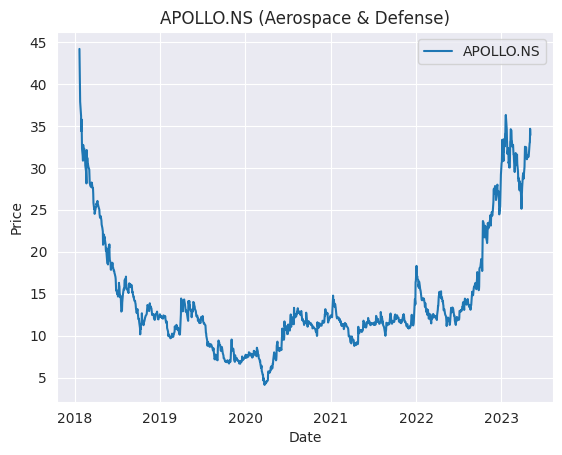

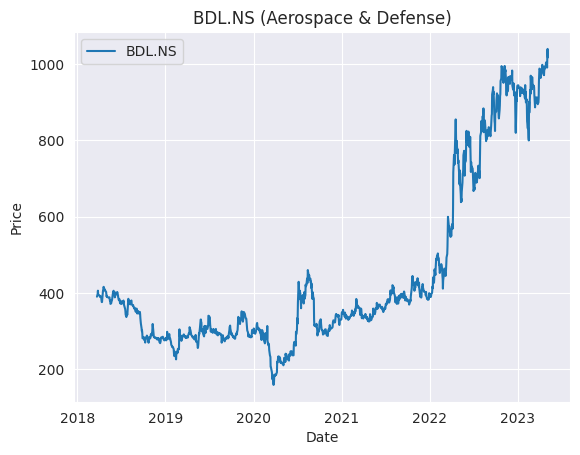

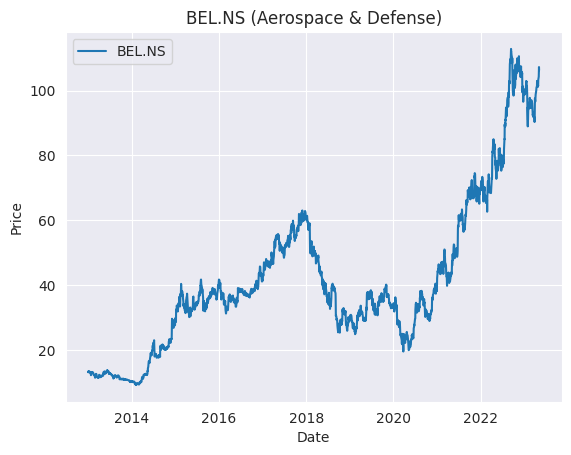

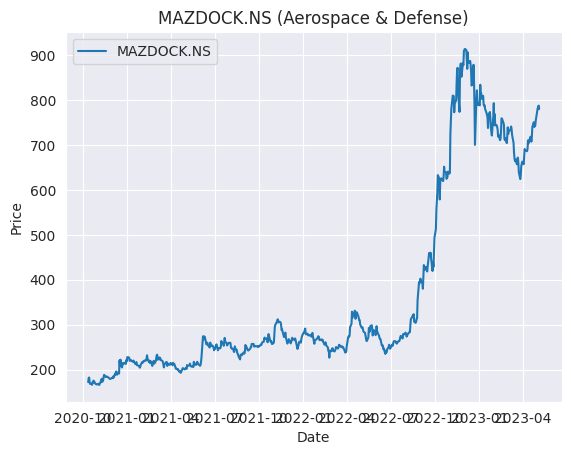

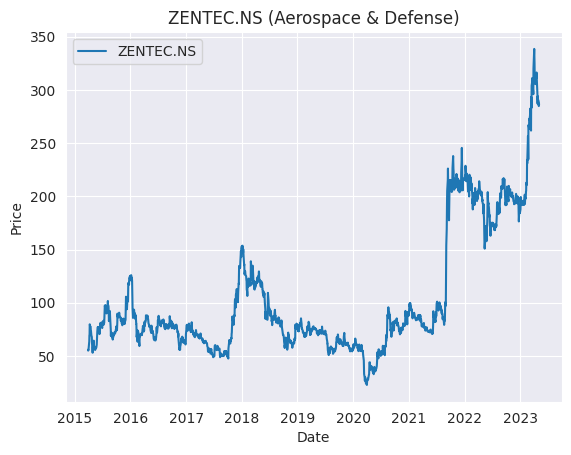

...

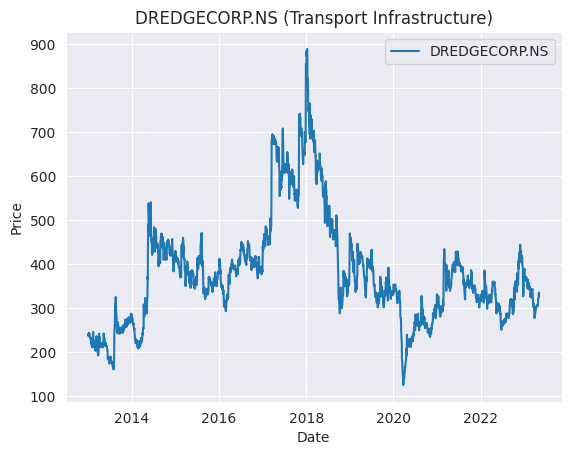

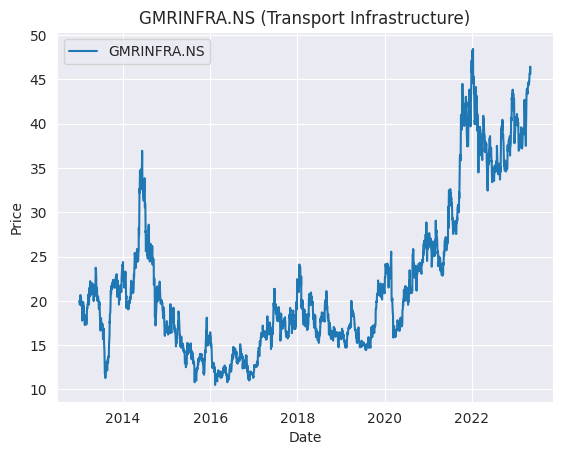

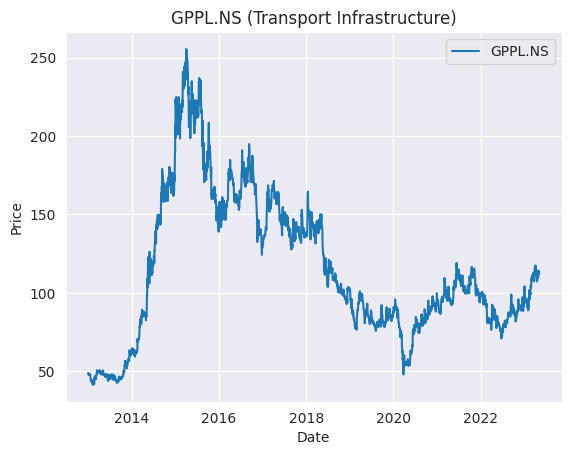

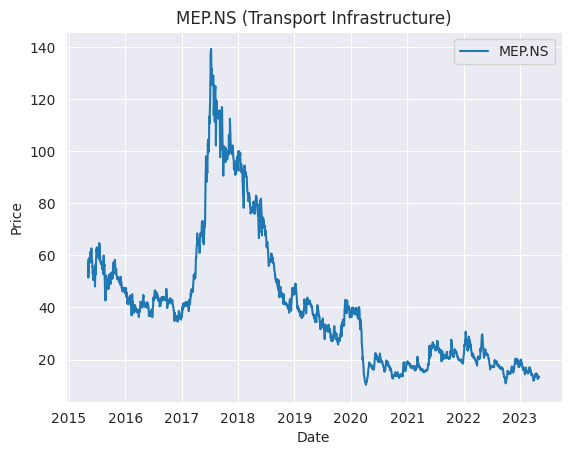

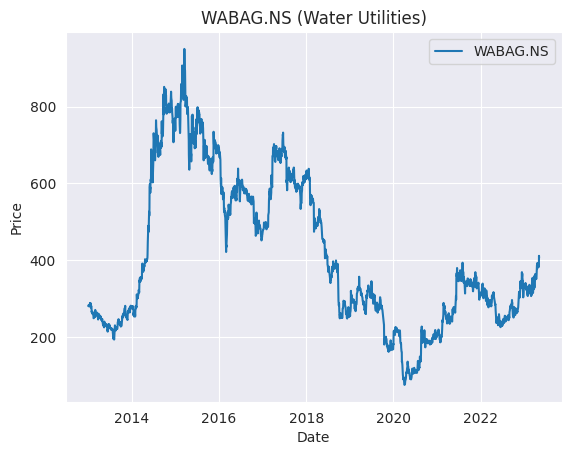

In [ ]:
# Set the style of the plots
sns.set_style("darkgrid")

# Group the historical data by sector and ticker
grouped_data = df_historical_data.groupby(['Sector', 'ticker'])

# Iterate over each group and create a line plot
for name, group in grouped_data:
    sector, ticker = name
    sns.lineplot(x=group.index, y=group['close'], label=ticker)
    plt.title(f"{ticker} ({sector})")
    plt.ylabel('Price')
    plt.xlabel('Date')
    plt.show()

In [ ]:
df_historical_data

,open,high,low,close,adjclose,volume,ticker,Sector
Date,,,,,,,,
2013-01-01,21.00,22.10,21.00,21.15,21.15,752.0,TAINWALCHM.NS,Chemicals
2013-01-02,21.95,21.95,20.50,21.05,21.05,98.0,TAINWALCHM.NS,Chemicals
2013-01-03,21.95,21.95,21.00,21.00,21.00,503.0,TAINWALCHM.NS,Chemicals
2013-01-04,21.95,21.95,20.70,20.75,20.75,40.0,TAINWALCHM.NS,Chemicals
2013-01-07,21.75,21.75,20.50,21.45,21.45,2152.0,TAINWALCHM.NS,Chemicals
...,...,...,...,...,...,...,...,...
2023-04-28,3.45,3.65,3.35,3.55,3.55,1591523.0,ZEELEARN.NS,"School, College & University"
2023-05-02,3.65,3.70,3.55,3.55,3.55,814705.0,ZEELEARN.NS,"School, College & University"
2023-05-03,3.60,3.65,3.50,3.60,3.60,536640.0,ZEELEARN.NS,"School, College & University"


In [ ]:
# Save DataFrame to excel file
#df_historical_data.to_excel(r'C:\Users\Admin\Desktop\Stock_Market\Financial Instrumental Analysis\Excel Sheets-Backups\hist_data.xlsx')

# ALGORITHMS

Ensemble Learning Algorithm

- LSTM + XG-Boost + SVM

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.ensemble import StackingRegressor
from keras.layers import Dropout
from xgboost import XGBRegressor
import matplotlib.dates as mdates
import xgboost as xgb
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import Callback



# Function to reshape data for LSTM
def reshape_data(data):
    return np.reshape(data, (data.shape[0], 1, data.shape[1]))

# Function to compute RSI
def compute_RSI(data, window=14):
    delta = data.diff()
    gain = delta.where(delta > 0, 0)
    loss = -delta.where(delta < 0, 0)
    avg_gain = gain.rolling(window=window).mean()
    avg_loss = loss.rolling(window=window).mean()
    RS = avg_gain / avg_loss
    RSI = 100.0 - (100.0 / (1.0 + RS))
    return RSI

# pre-process data and train models for each stock
for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')
        
        # get data for the stock
        stock_data = df_historical_data.loc[df_historical_data['ticker'] == stock]
        stock_data = stock_data.drop(['ticker', 'volume', 'adjclose'], axis=1)
        stock_data['MA50'] = stock_data['close'].rolling(window=50).mean()
        stock_data['MA200'] = stock_data['close'].rolling(window=200).mean()
        stock_data['RSI'] = compute_RSI(stock_data['close'])
        stock_data['Bollinger_upper'] = stock_data['MA50'] + 2 * stock_data['close'].rolling(window=50).std()
        stock_data['Bollinger_lower'] = stock_data['MA50'] - 2 * stock_data['close'].rolling(window=50).std()
        stock_data = stock_data.dropna()
        stock_data = stock_data.drop(['Sector'], axis=1) # drop sector column
        
        # split data into train and test sets
        X = stock_data.drop(['close'], axis=1)
        y = stock_data['close']
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
        
        # scale data using MinMaxScaler
        scaler = MinMaxScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        y_train_scaled = scaler.fit_transform(y_train.values.reshape(-1,1))
        y_test_scaled = scaler.transform(y_test.values.reshape(-1,1))
        
        # reshape data for LSTM
        X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
        X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

        model_lstm = Sequential()
        model_lstm.add(LSTM(50, return_sequences=True, input_shape= (1, X_train_scaled.shape[1])))
        model_lstm.add(Dropout(0.2))
        model_lstm.add(LSTM(50, return_sequences=False))
        model_lstm.add(Dropout(0.2))
        model_lstm.add(Dense(25))
        model_lstm.add(Dense(1))
        model_lstm.compile(loss="mean_squared_error", optimizer='adam')

        # Define the EarlyStopping callback
        # Create EarlyStopping callback with a patience of 10 epochs and a minimum improvement of 0.001
        early_stop = EarlyStopping(monitor='val_loss', min_delta=0.01, patience=10, verbose=1)

        # Custom callback to limit the validation loss to a minimum value
        class CustomCallback(Callback):
            def on_epoch_end(self, epoch, logs=None):
                if logs['val_loss'] < 0.0001:
                    self.model.stop_training = True

        # Train the model with the custom callback
        history_lstm = model_lstm.fit(X_train_reshaped, y_train_scaled, epochs=50, batch_size=32, validation_data=(X_test_reshaped, y_test_scaled), callbacks=[early_stop, CustomCallback()], verbose=1)

        
        # # train LSTM model
        # model_lstm = Sequential()
        # model_lstm.add(LSTM(units=50, activation='relu', input_shape=(1, X_train_scaled.shape[1])))
        # model_lstm.add(Dropout(0.2))
        # model_lstm.add(Dense(1))
        # model_lstm.compile(loss='mse', optimizer='adam')
        # history_lstm = model_lstm.fit(X_train_reshaped, y_train_scaled, epochs=20, batch_size=32, validation_data=(X_test_reshaped, y_test_scaled), verbose=1)
        
        # predict using LSTM model
        y_test_pred_lstm = scaler.inverse_transform(model_lstm.predict(X_test_reshaped))

        


        # plot actual and predicted prices for LSTM
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_lstm, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction using lstm')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()


        # evaluate model using RMSE
        rmse_lstm = np.sqrt(mean_squared_error(y_test, y_test_pred_lstm))
        print(f'LSTM RMSE: {np.sqrt(mean_squared_error(y_test, y_test_pred_lstm)):.4f}')

        # rmse_lstm = np.sqrt(mean_squared_error(y_test, y_test_pred_lstm))
        print(f'RMSE for {stock} using LSTM: {rmse_lstm}')
      
        # train XGBoost model
        param_grid = {
            'max_depth': [3, 5, 7],
            'n_estimators': [50, 100, 200],
            'learning_rate': [0.01, 0.1, 1],
        }

        model_xgb = xgb.XGBRegressor(objective='reg:squarederror')

        # Perform a grid search to find the best hyperparameters
        grid_search = GridSearchCV(model_xgb, param_grid, cv=5, n_jobs=-1, verbose=2)
        grid_result_xg = grid_search.fit(X_train, y_train)

        # Print the best hyperparameters and the corresponding score
        print("Best hyperparameters: ", grid_search.best_params_)
        print("Best score: ", grid_search.best_score_)

        # Extract the best hyperparameters and import them into the model
        best_params = grid_search.best_params_
        best_params['objective'] = 'reg:squarederror'

        model_xgb = xgb.XGBRegressor(**best_params)

        model_xgb.fit(X_train, y_train)

        # predict using XGBoost model
        y_test_pred_xgb = model_xgb.predict(X_test)

        # compute mean squared error for XGBoost
        mse_xgb = mean_squared_error(y_test, y_test_pred_xgb)
        print(f'Mean Squared Error for XGBoost: {mse_xgb:.4f}')

        # plot actual and predicted prices for XG-Boost
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_xgb, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction using XG-Boost')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        # rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb)):.4f
        rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
        print(f'XGB RMSE: {np.sqrt(mean_squared_error(y_test, y_test_pred_xgb)):.4f}')
        print(f'RMSE for {stock} using XGBoost: {rmse_xgb}')

        # train SVM model
        model_svm = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
        model_svm.fit(X_train_scaled, y_train_scaled.ravel())
        
        # predict using SVM model
        y_test_pred_svm = model_svm.predict(X_test_scaled)
        y_test_pred_svm = y_test_pred_svm.reshape(-1, 1)
        y_test_pred_svm = scaler.inverse_transform(y_test_pred_svm)

       # plot actual and predicted prices for SVM
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_svm, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction using SVM')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_svm = np.sqrt(mean_squared_error(y_test, y_test_pred_svm))
        print(f'SVM RMSE: {np.sqrt(mean_squared_error(y_test, y_test_pred_svm)):.4f}')
        print(f'RMSE for {stock} using SVM: {rmse_svm}')

        # stack predictions using linear regression
        stacked_predictions = np.column_stack((y_test_pred_lstm, y_test_pred_xgb, y_test_pred_svm))
        stacked_predictions_reshaped = stacked_predictions.reshape((stacked_predictions.shape[0], stacked_predictions.shape[1], 1))
        model_stacked = Sequential()
        model_stacked.add(LSTM(units=50, activation='relu', input_shape=(stacked_predictions.shape[1], 1)))
        model_stacked.add(Dense(1))
        model_stacked.compile(loss='mse', optimizer='adam')
        history_stacked = model_stacked.fit(stacked_predictions_reshaped, y_test.values, epochs=20, batch_size=32, verbose=0)
        y_test_pred_stacked = model_stacked.predict(stacked_predictions_reshaped)

        # plot actual and predicted prices for Stacked
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_stacked, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction using Stacked(LSTM+XG-Boost+SVM')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_stacked = np.sqrt(mean_squared_error(y_test, y_test_pred_stacked))
        print(f'Stacked RMSE: {np.sqrt(mean_squared_error(y_test, y_test_pred_stacked)):.4f}')
        print(f'RMSE for {stock} using Stacked Algorithm: {rmse_stacked}')

       # plot actual and predicted prices for all algorithms and stacked algorithm
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_lstm, 'r-', label='LSTM')
        ax.plot_date(X_test.index, y_test_pred_xgb, 'c-', label='XGBoost')
        ax.plot_date(X_test.index, y_test_pred_svm, 'm-', label='SVM')
        ax.plot_date(X_test.index, y_test_pred_stacked, 'y-', label='Stacked')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()


        print('Model evaluation:')
    
        # LSTM
        rmse_lstm = mean_squared_error(y_test, y_test_pred_lstm)
        print(f'LSTM RMSE: {rmse_lstm:.4f}')

        mae_lstm = mean_absolute_error(y_test, y_test_pred_lstm)
        print(f'LSTM MAE: {mae_lstm:.4f}')

        r2_lstm = r2_score(y_test, y_test_pred_lstm)
        print(f'LSTM R2 Score: {r2_lstm:.4f}')
        
        # XGBoost
        rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
        print(f'XGBoost RMSE: {rmse_xgb:.4f}')

        mae_xgb = mean_absolute_error(y_test, y_test_pred_xgb)
        print(f'XGBoost MAE: {mae_xgb:.4f}')

        r2_xgb = r2_score(y_test, y_test_pred_xgb)
        print(f'XGBoost R2 Score: {r2_xgb:.4f}')
        
        # SVM
        rmse_svm = np.sqrt(mean_squared_error(y_test, y_test_pred_svm))
        print(f'SVM RMSE: {rmse_svm:.4f}')

        mae_svm = mean_absolute_error(y_test, y_test_pred_svm)
        print(f'SVM MAE: {mae_svm:.4f}')
        
        r2_svm = r2_score(y_test, y_test_pred_svm)
        print(f'SVM R2 Score: {r2_svm:.4f}')


        # Stacked
        rmse_stacked = np.sqrt(mean_squared_error(y_test, y_test_pred_stacked))
        print(f'Stacked RMSE: {rmse_stacked:.4f}')

        mae_stacked = mean_absolute_error(y_test, y_test_pred_stacked)
        print(f'Stacked MAE: {mae_stacked:.4f}')

        r2_stacked = r2_score(y_test, y_test_pred_stacked)
        print(f'Stacked R2 Score: {r2_stacked:.4f}')

        
        # plot predictions vs actuals
        plt.plot(X_test.index, y_test.values, label='Actuals')
        plt.plot(X_test.index, y_test_pred_lstm, label='LSTM')
        plt.plot(X_test.index, y_test_pred_xgb, label='XGBoost')
        plt.plot(X_test.index, y_test_pred_svm, label='SVM')
        plt.plot(X_test.index, y_test_pred_stacked, label='Stacked')
        plt.title(f'{stock} Closing Price Predictions')
        plt.xlabel('Time')
        plt.ylabel('Price')
        plt.legend()
        plt.show()
        
        print('-------------------------------------------------------')


In [ ]:
#BEST CODE

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.ensemble import StackingRegressor
from keras.layers import Dropout
from xgboost import XGBRegressor
import matplotlib.dates as mdates
import xgboost as xgb
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.callbacks import EarlyStopping



# Function to reshape data for LSTM
def reshape_data(data):
    return np.reshape(data, (data.shape[0], 1, data.shape[1]))

# Function to compute RSI
def compute_RSI(data, window=14):
    delta = data.diff()
    gain = delta.where(delta > 0, 0)
    loss = -delta.where(delta < 0, 0)
    avg_gain = gain.rolling(window=window).mean()
    avg_loss = loss.rolling(window=window).mean()
    RS = avg_gain / avg_loss
    RSI = 100.0 - (100.0 / (1.0 + RS))
    return RSI

# pre-process data and train models for each stock
for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')
        
        # get data for the stock
        stock_data = df_historical_data.loc[df_historical_data['ticker'] == stock]
        stock_data = stock_data.drop(['ticker', 'volume', 'adjclose'], axis=1)
        stock_data['MA50'] = stock_data['close'].rolling(window=50).mean()
        stock_data['MA200'] = stock_data['close'].rolling(window=200).mean()
        stock_data['RSI'] = compute_RSI(stock_data['close'])
        stock_data['Bollinger_upper'] = stock_data['MA50'] + 2 * stock_data['close'].rolling(window=50).std()
        stock_data['Bollinger_lower'] = stock_data['MA50'] - 2 * stock_data['close'].rolling(window=50).std()
        stock_data = stock_data.dropna()
        stock_data = stock_data.drop(['Sector'], axis=1) # drop sector column
        
        # split data into train and test sets
        X = stock_data.drop(['close'], axis=1)
        y = stock_data['close']
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
        
        # scale data using MinMaxScaler
        scaler = MinMaxScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        y_train_scaled = scaler.fit_transform(y_train.values.reshape(-1,1))
        y_test_scaled = scaler.transform(y_test.values.reshape(-1,1))
        
        # reshape data for LSTM
        X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
        X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

        model_lstm = Sequential()
        model_lstm.add(LSTM(50, return_sequences=True, input_shape= (1, X_train_scaled.shape[1])))
        model_lstm.add(Dropout(0.2))  # Add a dropout layer
        model_lstm.add(LSTM(50, return_sequences=False))
        model_lstm.add(Dropout(0.2))  # Add a dropout layer
        model_lstm.add(Dense(25))
        model_lstm.add(Dense(1))
        model_lstm.compile(loss="mean_squared_error", optimizer='adam')
        #model.compile(loss='mean_squared_error',optimizer='adam')
        model_lstm.summary()

        # Create EarlyStopping callback with a patience of 10 epochs and a minimum improvement of 0.001
        early_stop = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=10, verbose=1)

        history_lstm = model_lstm.fit(X_train_reshaped, y_train_scaled, epochs=50, batch_size=32, validation_data=(X_test_reshaped, y_test_scaled), callbacks=[early_stop], verbose=1)

        
        # # train LSTM model
        # model_lstm = Sequential()
        # model_lstm.add(LSTM(units=50, activation='relu', input_shape=(1, X_train_scaled.shape[1])))
        # model_lstm.add(Dropout(0.2))
        # model_lstm.add(Dense(1))
        # model_lstm.compile(loss='mse', optimizer='adam')
        # history_lstm = model_lstm.fit(X_train_reshaped, y_train_scaled, epochs=20, batch_size=32, validation_data=(X_test_reshaped, y_test_scaled), verbose=1)
        
        # predict using LSTM model
        y_test_pred_lstm = scaler.inverse_transform(model_lstm.predict(X_test_reshaped))

        


        # plot actual and predicted prices for LSTM
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_lstm, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction using lstm')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()


        # evaluate model using RMSE
        rmse_lstm = np.sqrt(mean_squared_error(y_test, y_test_pred_lstm))
        print(f'RMSE for {stock} using LSTM: {rmse_lstm}')
      
        # train XGBoost model
        param_grid = {
            'max_depth': [3, 5, 7],
            'n_estimators': [50, 100, 200],
            'learning_rate': [0.01, 0.1, 1],
        }

        model_xgb = xgb.XGBRegressor(objective='reg:squarederror')

        # Perform a grid search to find the best hyperparameters
        grid_search = GridSearchCV(model_xgb, param_grid, cv=5, n_jobs=-1, verbose=2)
        grid_result_xg = grid_search.fit(X_train, y_train)

        # Print the best hyperparameters and the corresponding score
        print("Best hyperparameters: ", grid_search.best_params_)
        print("Best score: ", grid_search.best_score_)

        # Extract the best hyperparameters and import them into the model
        best_params = grid_search.best_params_
        best_params['objective'] = 'reg:squarederror'

        model_xgb = xgb.XGBRegressor(**best_params)

        model_xgb.fit(X_train, y_train)

        # predict using XGBoost model
        y_test_pred_xgb = model_xgb.predict(X_test)

        # compute mean squared error for XGBoost
        mse_xgb = mean_squared_error(y_test, y_test_pred_xgb)
        print(f'Mean Squared Error for XGBoost: {mse_xgb:.4f}')

        # plot actual and predicted prices for XG-Boost
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_xgb, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction using XG-Boost')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
        print(f'RMSE for {stock} using XGBoost: {rmse_xgb}')

        # train SVM model
        model_svm = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
        model_svm.fit(X_train_scaled, y_train_scaled.ravel())
        
        # predict using SVM model
        y_test_pred_svm = model_svm.predict(X_test_scaled)
        y_test_pred_svm = y_test_pred_svm.reshape(-1, 1)
        y_test_pred_svm = scaler.inverse_transform(y_test_pred_svm)

       # plot actual and predicted prices for SVM
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_svm, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction using SVM')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_svm = np.sqrt(mean_squared_error(y_test, y_test_pred_svm))
        print(f'RMSE for {stock} using SVM: {rmse_svm}')

        # stack predictions using linear regression
        stacked_predictions = np.column_stack((y_test_pred_lstm, y_test_pred_xgb, y_test_pred_svm))
        stacked_predictions_reshaped = stacked_predictions.reshape((stacked_predictions.shape[0], stacked_predictions.shape[1], 1))
        model_stacked = Sequential()
        model_stacked.add(LSTM(units=50, activation='relu', input_shape=(stacked_predictions.shape[1], 1)))
        model_stacked.add(Dense(1))
        model_stacked.compile(loss='mse', optimizer='adam')
        history_stacked = model_stacked.fit(stacked_predictions_reshaped, y_test.values, epochs=20, batch_size=32, verbose=0)
        y_test_pred_stacked = model_stacked.predict(stacked_predictions_reshaped)

        # plot actual and predicted prices for Stacked
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_stacked, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction using Stacked(LSTM+XG-Boost+SVM')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_stacked = np.sqrt(mean_squared_error(y_test, y_test_pred_stacked))
        print(f'RMSE for {stock} using Stacked Algorithm: {rmse_stacked}')

       # plot actual and predicted prices for all algorithms and stacked algorithm
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_lstm, 'r-', label='LSTM')
        ax.plot_date(X_test.index, y_test_pred_xgb, 'c-', label='XGBoost')
        ax.plot_date(X_test.index, y_test_pred_svm, 'm-', label='SVM')
        ax.plot_date(X_test.index, y_test_pred_stacked, 'y-', label='Stacked')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()


        print('Model evaluation:')
    
        # LSTM
        rmse_lstm = mean_squared_error(y_test, y_test_pred_lstm)
        print(f'LSTM RMSE: {rmse_lstm:.2f}')

        mae_lstm = mean_absolute_error(y_test, y_test_pred_lstm)
        print(f'LSTM MAE: {mae_lstm:.2f}')

        r2_lstm = r2_score(y_test, y_test_pred_lstm)
        print(f'LSTM R2 Score: {r2_lstm:.2f}')
        
        # XGBoost
        rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
        print(f'XGBoost RMSE: {rmse_xgb:.2f}')

        mae_xgb = mean_absolute_error(y_test, y_test_pred_xgb)
        print(f'XGBoost MAE: {mae_xgb:.2f}')

        r2_xgb = r2_score(y_test, y_test_pred_xgb)
        print(f'XGBoost R2 Score: {r2_xgb:.2f}')
        
        # SVM
        rmse_svm = np.sqrt(mean_squared_error(y_test, y_test_pred_svm))
        print(f'SVM RMSE: {rmse_svm:.2f}')

        mae_svm = mean_absolute_error(y_test, y_test_pred_svm)
        print(f'SVM MAE: {mae_svm:.2f}')
        
        r2_svm = r2_score(y_test, y_test_pred_svm)
        print(f'SVM R2 Score: {r2_svm:.2f}')


        # Stacked
        rmse_stacked = np.sqrt(mean_squared_error(y_test, y_test_pred_stacked))
        print(f'Stacked RMSE: {rmse_stacked:.2f}')

        mae_stacked = mean_absolute_error(y_test, y_test_pred_stacked)
        print(f'Stacked MAE: {mae_stacked:.2f}')

        r2_stacked = r2_score(y_test, y_test_pred_stacked)
        print(f'Stacked R2 Score: {r2_stacked:.2f}')

        
        
        # plot predictions vs actuals
        plt.plot(X_test.index, y_test.values, label='Actuals')
        plt.plot(X_test.index, y_test_pred_lstm, label='LSTM')
        plt.plot(X_test.index, y_test_pred_xgb, label='XGBoost')
        plt.plot(X_test.index, y_test_pred_svm, label='SVM')
        plt.plot(X_test.index, y_test_pred_stacked, label='Stacked')
        plt.title(f'{stock} Closing Price Predictions')
        plt.xlabel('Time')
        plt.ylabel('Price')
        plt.legend()
        plt.show()
        
        print('-------------------------------------------------------')


Forecasting TAINWALCHM.NS in Chemicals sector
Model: "sequential_108"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_181 (LSTM)             (None, 1, 50)             11800     
                                                                 
 dropout_72 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_182 (LSTM)             (None, 50)                20200     
                                                                 
 dropout_73 (Dropout)        (None, 50)                0         
                                                                 
 dense_144 (Dense)           (None, 25)                1275      
                                                                 
 dense_145 (Dense)           (None, 1)                 26        
                                                                 
Total 

KeyboardInterrupt: ignored

In [ ]:
#BEST CODE

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.ensemble import StackingRegressor
from keras.layers import Dropout
from xgboost import XGBRegressor
import matplotlib.dates as mdates
import xgboost as xgb
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.callbacks import EarlyStopping
import numpy as np
import pandas as pd



# Function to reshape data for LSTM
def reshape_data(data):
    return np.reshape(data, (data.shape[0], 1, data.shape[1]))

# Function to compute RSI
def compute_RSI(data, window=7):
    delta = data.diff()
    gain = delta.where(delta > 0, 0)
    loss = -delta.where(delta < 0, 0)
    avg_gain = gain.rolling(window=window).mean()
    avg_loss = loss.rolling(window=window).mean()
    RS = avg_gain / avg_loss
    RSI = 100.0 - (100.0 / (1.0 + RS))
    return RSI


# pre-process data and train models for each stock
for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')
        
        # get data for the stock
        stock_data = df_historical_data.loc[df_historical_data['ticker'] == stock]
        stock_data = stock_data.drop(['ticker', 'volume', 'adjclose'], axis=1)
        stock_data['MA50'] = stock_data['close'].rolling(window=50).mean()
        stock_data['MA200'] = stock_data['close'].rolling(window=200).mean()
        stock_data['RSI'] = compute_RSI(stock_data['close'])
        stock_data['Bollinger_upper'] = stock_data['MA50'] + 2 * stock_data['close'].rolling(window=50).std()
        stock_data['Bollinger_lower'] = stock_data['MA50'] - 2 * stock_data['close'].rolling(window=50).std()
        stock_data = stock_data.dropna()
        stock_data = stock_data.drop(['Sector'], axis=1) # drop sector column
        
        # split data into train and test sets
        X = stock_data.drop(['close'], axis=1)
        y = stock_data['close']
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False, random_state=42)
        
        # scale data using StandardScaler
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        y_train_scaled = scaler.fit_transform(y_train.values.reshape(-1,1))
        y_test_scaled = scaler.transform(y_test.values.reshape(-1,1))
        
        # reshape data for LSTM
        X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
        X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

        early_stop = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=10, verbose=1)

        model_lstm = Sequential()
        model_lstm.add(LSTM(50, return_sequences=True, input_shape=(1, X_train_scaled.shape[1])))
        model_lstm.add(Dropout(0.2))
        model_lstm.add(LSTM(50, return_sequences=False))
        model_lstm.add(Dropout(0.2))
        model_lstm.add(Dense(25))
        model_lstm.add(Dense(1))
        model_lstm.compile(loss='mse', optimizer='adam')
        model_lstm.summary()

        history_lstm = model_lstm.fit(X_train_reshaped, y_train_scaled, epochs=100, batch_size=32, validation_data=(X_test_reshaped, y_test_scaled), callbacks=[early_stop], verbose=1)
        
        # predict using LSTM model
        y_test_pred_lstm = scaler.inverse_transform(model_lstm.predict(X_test_reshaped))

        # plot actual and predicted prices for LSTM
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_lstm, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction using lstm')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()


        # evaluate model using RMSE
        rmse_lstm = np.sqrt(mean_squared_error(y_test, y_test_pred_lstm))
        print(f'RMSE for {stock} using LSTM: {rmse_lstm}')
      
        # define parameter grid for XGBoost model
        param_grid = {
            'max_depth': [3, 4, 5],
            'learning_rate': [0.1, 0.01, 0.001],
            'n_estimators': [100, 500, 1000]
        }

        model_xgb = XGBRegressor()

        # Perform a grid search to find the best hyperparameters
        grid_search =GridSearchCV(model_xgb, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1)
        # fit GridSearchCV object to data
        grid_search.fit(X_train_scaled, y_train_scaled.ravel())

        # Print the best hyperparameters and the corresponding score
        print("Best hyperparameters: ", grid_search.best_params_)
        print("Best score: ", grid_search.best_score_)

        # Extract the best hyperparameters and import them into the model
        best_params = grid_search.best_params_
        best_score = grid_search.best_score_
        best_params['objective'] = 'reg:squarederror'

        model_xgb = xgb.XGBRegressor(**best_params)

        model_xgb.fit(X_train, y_train)

        # predict using XGBoost model
        y_test_pred_xgb = model_xgb.predict(X_test)

        # compute mean squared error for XGBoost
        mse_xgb = mean_squared_error(y_test, y_test_pred_xgb)
        print(f'Mean Squared Error for XGBoost: {mse_xgb:.4f}')

        # plot actual and predicted prices for XG-Boost
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_xgb, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction using XG-Boost')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
        print(f'RMSE for {stock} using XGBoost: {rmse_xgb}')

        # train SVM model
        model_svm = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
        model_svm.fit(X_train_scaled, y_train_scaled.ravel())
        
        # predict using SVM model
        y_test_pred_svm = model_svm.predict(X_test_scaled)
        y_test_pred_svm = y_test_pred_svm.reshape(-1, 1)
        y_test_pred_svm = scaler.inverse_transform(y_test_pred_svm)

       # plot actual and predicted prices for SVM
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_svm, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction using SVM')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_svm = np.sqrt(mean_squared_error(y_test, y_test_pred_svm))
        print(f'RMSE for {stock} using SVM: {rmse_svm}')

        # evaluate model using RMSE
        rmse_svm = np.sqrt(mean_squared_error(y_test, y_test_pred_svm))
        print(f'RMSE for {stock} using SVM: {rmse_svm}')

        # stack predictions using linear regression
        stacked_predictions = np.column_stack((y_test_pred_lstm, y_test_pred_xgb, y_test_pred_svm))
        stacked_predictions_reshaped = stacked_predictions.reshape((stacked_predictions.shape[0], stacked_predictions.shape[1], 1))
        model_stacked = Sequential()
        model_stacked.add(LSTM(units=50, activation='relu', input_shape=(stacked_predictions.shape[1], 1)))
        model_stacked.add(Dense(1))
        model_stacked.compile(loss='mse', optimizer='adam')
        history_stacked = model_stacked.fit(stacked_predictions_reshaped, y_test.values, epochs=20, batch_size=32, verbose=0)
        y_test_pred_stacked = model_stacked.predict(stacked_predictions_reshaped)

        # plot actual and predicted prices for Stacked
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_stacked, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction using Stacked(LSTM+XG-Boost+SVM')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_stacked = np.sqrt(mean_squared_error(y_test, y_test_pred_stacked))
        print(f'RMSE for {stock} using Stacked Algorithm: {rmse_stacked}')

       # plot actual and predicted prices for all algorithms and stacked algorithm
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_lstm, 'r-', label='LSTM')
        ax.plot_date(X_test.index, y_test_pred_xgb, 'c-', label='XGBoost')
        ax.plot_date(X_test.index, y_test_pred_svm, 'm-', label='SVM')
        ax.plot_date(X_test.index, y_test_pred_stacked, 'y-', label='Stacked')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.title(f'{stock} Stock Price Prediction')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()


        print('Model evaluation:')
    
        # LSTM
        rmse_lstm = mean_squared_error(y_test, y_test_pred_lstm)
        print(f'LSTM RMSE: {rmse_lstm:.2f}')

        mae_lstm = mean_absolute_error(y_test, y_test_pred_lstm)
        print(f'LSTM MAE: {mae_lstm:.2f}')

        r2_lstm = r2_score(y_test, y_test_pred_lstm)
        print(f'LSTM R2 Score: {r2_lstm:.2f}')
        
        # XGBoost
        rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
        print(f'XGBoost RMSE: {rmse_xgb:.2f}')

        mae_xgb = mean_absolute_error(y_test, y_test_pred_xgb)
        print(f'XGBoost MAE: {mae_xgb:.2f}')

        r2_xgb = r2_score(y_test, y_test_pred_xgb)
        print(f'XGBoost R2 Score: {r2_xgb:.2f}')
        
        # SVM
        rmse_svm = np.sqrt(mean_squared_error(y_test, y_test_pred_svm))
        print(f'SVM RMSE: {rmse_svm:.2f}')

        mae_svm = mean_absolute_error(y_test, y_test_pred_svm)
        print(f'SVM MAE: {mae_svm:.2f}')
        
        r2_svm = r2_score(y_test, y_test_pred_svm)
        print(f'SVM R2 Score: {r2_svm:.2f}')


        # Stacked
        rmse_stacked = np.sqrt(mean_squared_error(y_test, y_test_pred_stacked))
        print(f'Stacked RMSE: {rmse_stacked:.2f}')

        mae_stacked = mean_absolute_error(y_test, y_test_pred_stacked)
        print(f'Stacked MAE: {mae_stacked:.2f}')

        r2_stacked = r2_score(y_test, y_test_pred_stacked)
        print(f'Stacked R2 Score: {r2_stacked:.2f}')

        
        
        # plot predictions vs actuals
        plt.plot(X_test.index, y_test.values, label='Actuals')
        plt.plot(X_test.index, y_test_pred_lstm, label='LSTM')
        plt.plot(X_test.index, y_test_pred_xgb, label='XGBoost')
        plt.plot(X_test.index, y_test_pred_svm, label='SVM')
        plt.plot(X_test.index, y_test_pred_stacked, label='Stacked')
        plt.title(f'{stock} Closing Price Predictions')
        plt.xlabel('Time')
        plt.ylabel('Price')
        plt.legend()
        plt.show()
        
        print('-------------------------------------------------------')


# BEST OUTPUT OF ENSEMBLED

Forecasting TAINWALCHM.NS in Chemicals sector
Model: "sequential_150"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_283 (LSTM)             (None, 1, 50)             11800     
                                                                 
 dropout_46 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_284 (LSTM)             (None, 50)                20200     
                                                                 
 dropout_47 (Dropout)        (None, 50)                0         
                                                                 
 dense_283 (Dense)           (None, 25)                1275      
                                                                 
 dense_284 (Dense)           (None, 1)                 26        
                                                                 
Total 

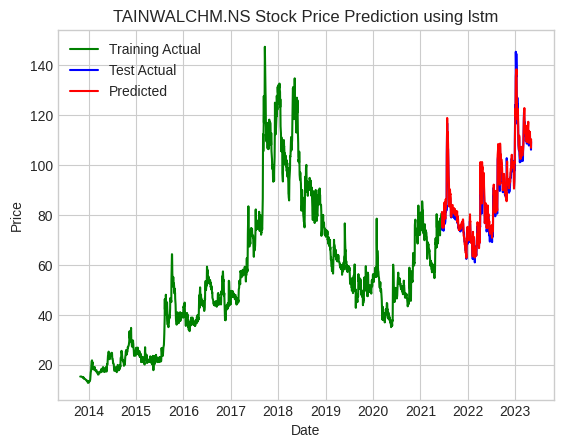

RMSE for TAINWALCHM.NS using LSTM: 2.4142906129764965
Fitting 5 folds for each of 45 candidates, totalling 225 fits
Best hyperparameters:  {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
Best score:  0.821035700813885
Mean Squared Error for XGBoost: 4.0878


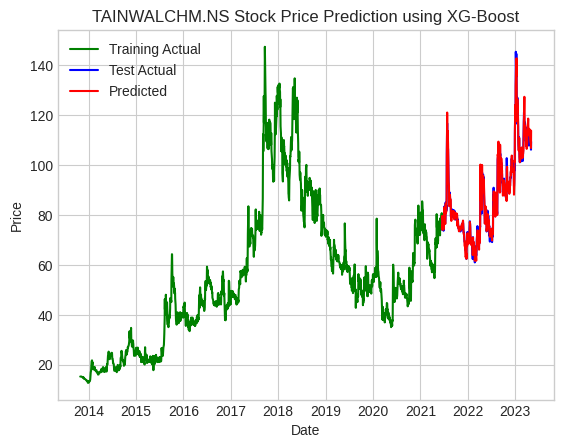

RMSE for TAINWALCHM.NS using XGBoost: 2.0218212416863164


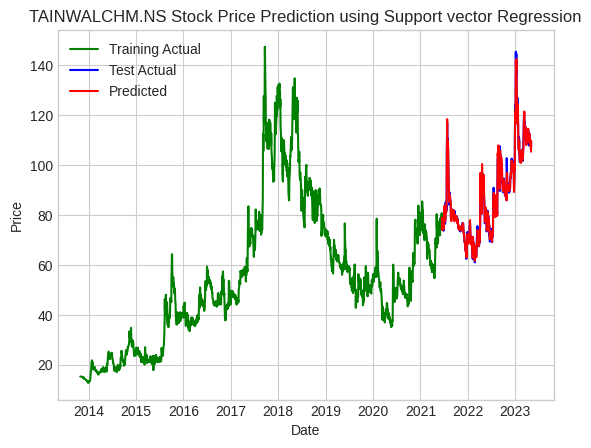

RMSE for TAINWALCHM.NS using SVR: 1.4355293637491249
RMSE for TAINWALCHM.NS using SVR: 1.4355293637491249
15/15 [==============================] - 0s 2ms/step


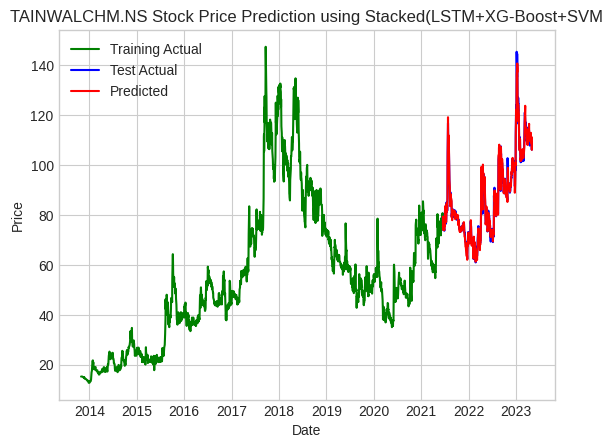

RMSE for TAINWALCHM.NS using Stacked Algorithm: 1.7461192056019341


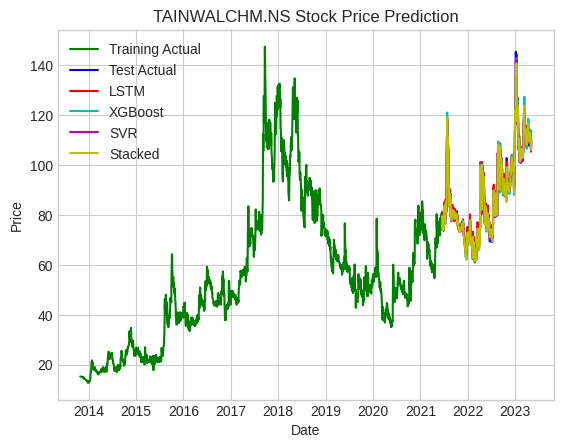

Model evaluation:
LSTM RMSE: 5.83
LSTM MAE: 1.89
LSTM R2 Score: 0.98
XGBoost RMSE: 2.02
XGBoost MAE: 1.39
XGBoost R2 Score: 0.98
SVR RMSE: 1.44
SVR MAE: 0.97
SVR R2 Score: 0.99
Stacked RMSE: 1.75
Stacked MAE: 1.20
Stacked R2 Score: 0.99


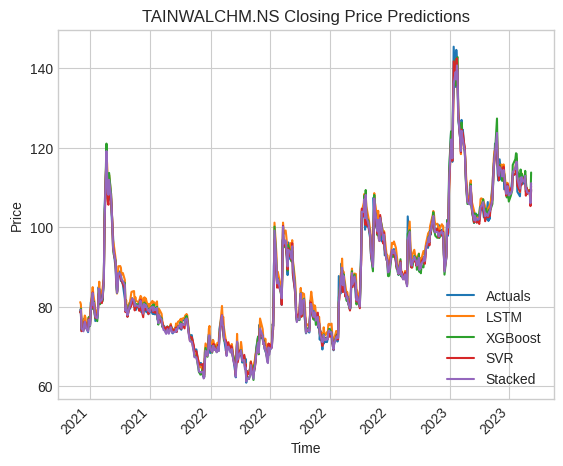

-------------------------------------------------------
Forecasting HINDCON.NS in Chemicals sector
Model: "sequential_152"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_286 (LSTM)             (None, 1, 50)             11800     
                                                                 
 dropout_48 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_287 (LSTM)             (None, 50)                20200     
                                                                 
 dropout_49 (Dropout)        (None, 50)                0         
                                                                 
 dense_286 (Dense)           (None, 25)                1275      
                                                                 
 dense_287 (Dense)           (None, 1)                 26        
                   

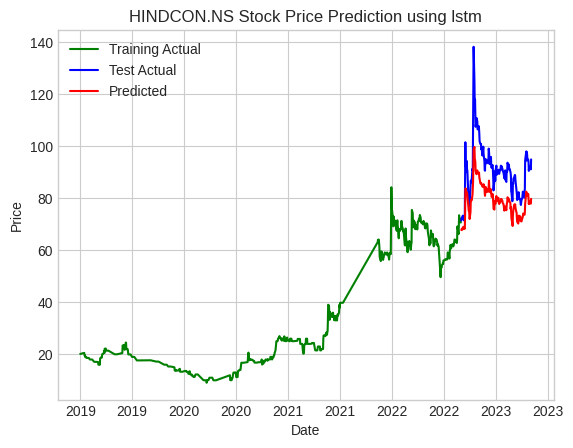

RMSE for HINDCON.NS using LSTM: 12.54151597842339
Fitting 5 folds for each of 45 candidates, totalling 225 fits
Best hyperparameters:  {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
Best score:  0.8176063050827078
Mean Squared Error for XGBoost: 371.7261


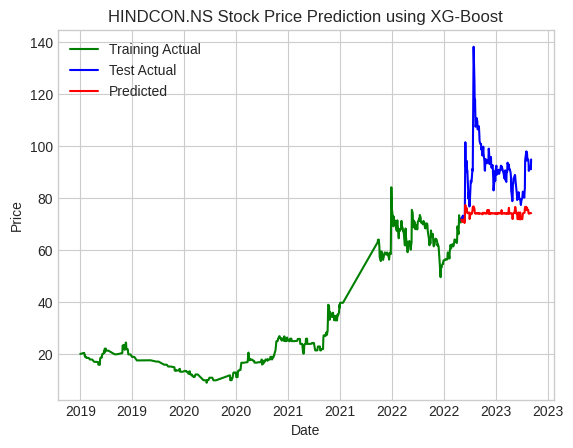

RMSE for HINDCON.NS using XGBoost: 19.280199337307938


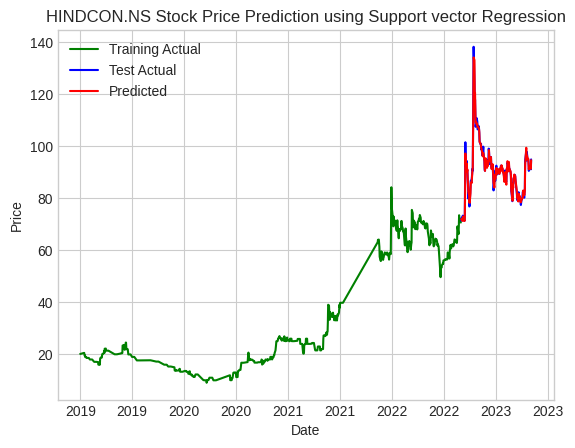

RMSE for HINDCON.NS using SVR: 1.5800998945439364
RMSE for HINDCON.NS using SVR: 1.5800998945439364
6/6 [==============================] - 0s 2ms/step


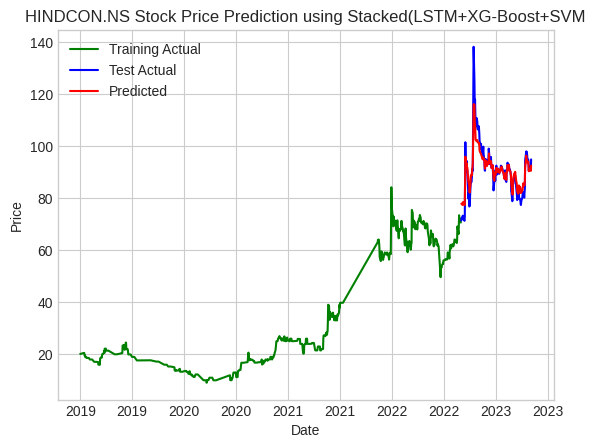

RMSE for HINDCON.NS using Stacked Algorithm: 3.817890773638727


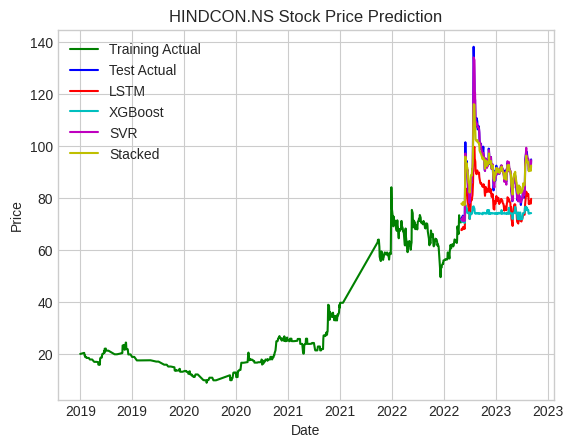

Model evaluation:
LSTM RMSE: 157.29
LSTM MAE: 11.64
LSTM R2 Score: -0.51
XGBoost RMSE: 19.28
XGBoost MAE: 16.74
XGBoost R2 Score: -2.58
SVR RMSE: 1.58
SVR MAE: 1.03
SVR R2 Score: 0.98
Stacked RMSE: 3.82
Stacked MAE: 2.56
Stacked R2 Score: 0.86


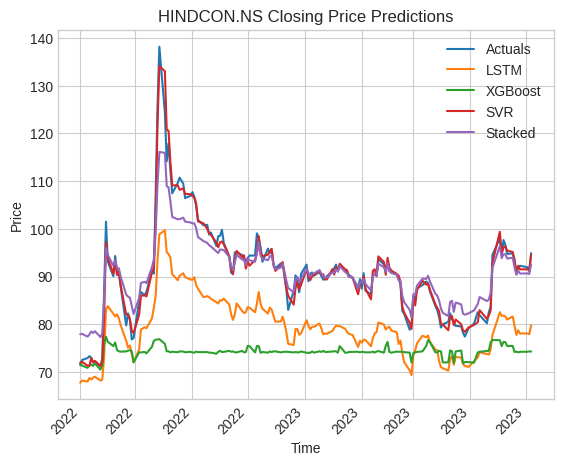

-------------------------------------------------------
Forecasting ARVEE.NS in Chemicals sector
Model: "sequential_154"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_289 (LSTM)             (None, 1, 50)             11800     
                                                                 
 dropout_50 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_290 (LSTM)             (None, 50)                20200     
                                                                 
 dropout_51 (Dropout)        (None, 50)                0         
                                                                 
 dense_289 (Dense)           (None, 25)                1275      
                                                                 
 dense_290 (Dense)           (None, 1)                 26        
                     

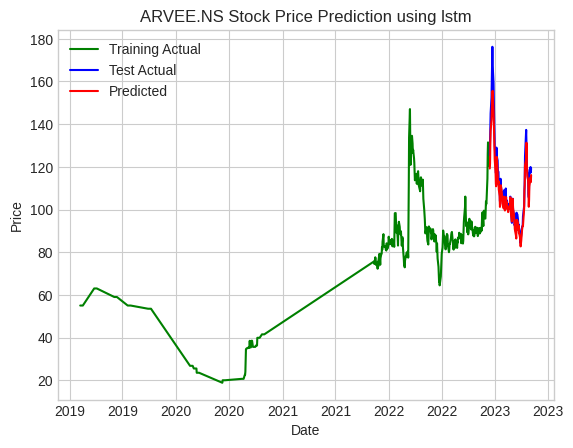

RMSE for ARVEE.NS using LSTM: 5.569162507936525
Fitting 5 folds for each of 45 candidates, totalling 225 fits
Best hyperparameters:  {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 100}
Best score:  0.855027727541564
Mean Squared Error for XGBoost: 112.4189


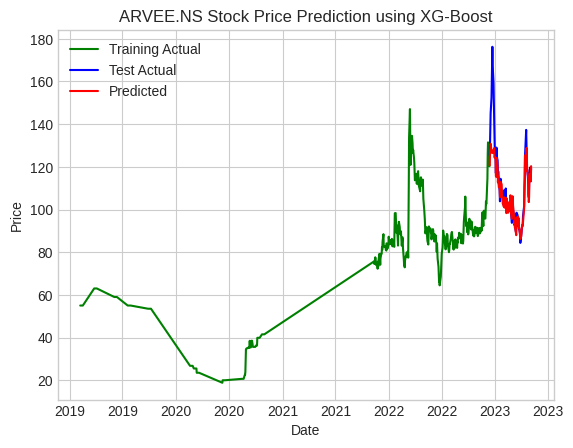

RMSE for ARVEE.NS using XGBoost: 10.602778438893878


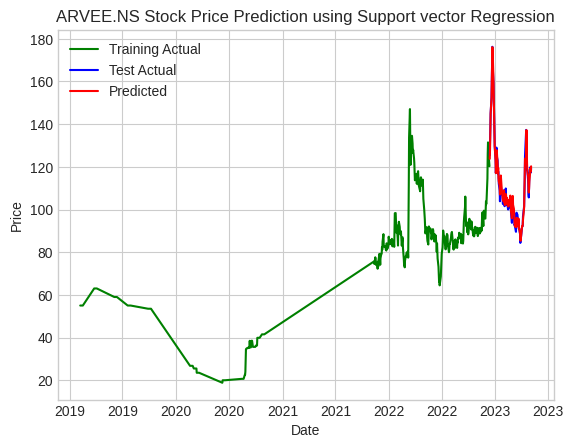

RMSE for ARVEE.NS using SVR: 2.4454341439454335
RMSE for ARVEE.NS using SVR: 2.4454341439454335
3/3 [==============================] - 0s 3ms/step


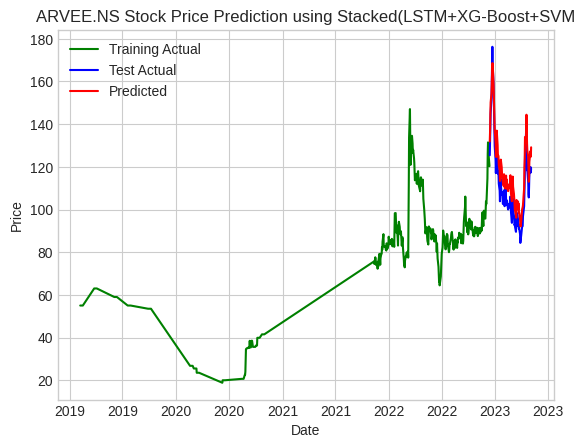

RMSE for ARVEE.NS using Stacked Algorithm: 8.2970201575988


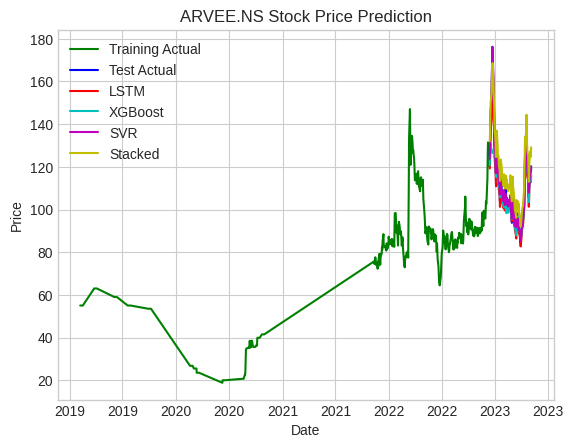

Model evaluation:
LSTM RMSE: 31.02
LSTM MAE: 3.81
LSTM R2 Score: 0.92
XGBoost RMSE: 10.60
XGBoost MAE: 5.25
XGBoost R2 Score: 0.70
SVR RMSE: 2.45
SVR MAE: 1.64
SVR R2 Score: 0.98
Stacked RMSE: 8.30
Stacked MAE: 7.78
Stacked R2 Score: 0.82


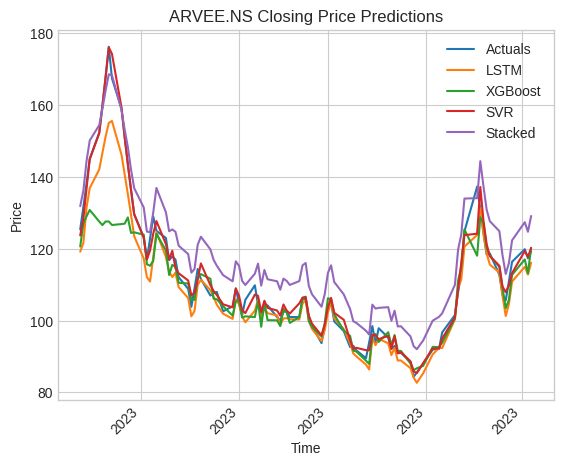

-------------------------------------------------------
Forecasting AGROPHOS.NS in Chemicals sector
Model: "sequential_156"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_292 (LSTM)             (None, 1, 50)             11800     
                                                                 
 dropout_52 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_293 (LSTM)             (None, 50)                20200     
                                                                 
 dropout_53 (Dropout)        (None, 50)                0         
                                                                 
 dense_292 (Dense)           (None, 25)                1275      
                                                                 
 dense_293 (Dense)           (None, 1)                 26        
                  

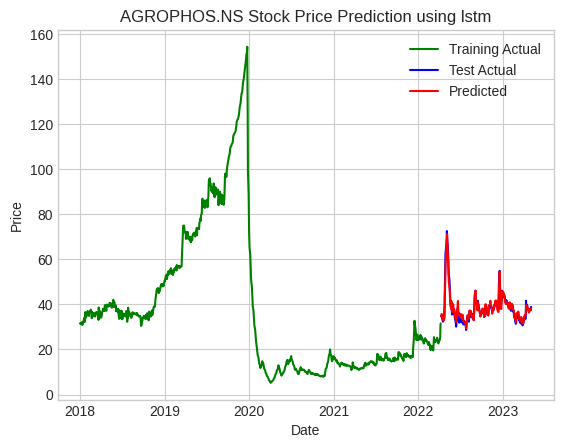

RMSE for AGROPHOS.NS using LSTM: 1.5242611400704003
Fitting 5 folds for each of 45 candidates, totalling 225 fits
Best hyperparameters:  {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000}
Best score:  0.9226963318510073
Mean Squared Error for XGBoost: 1.5057


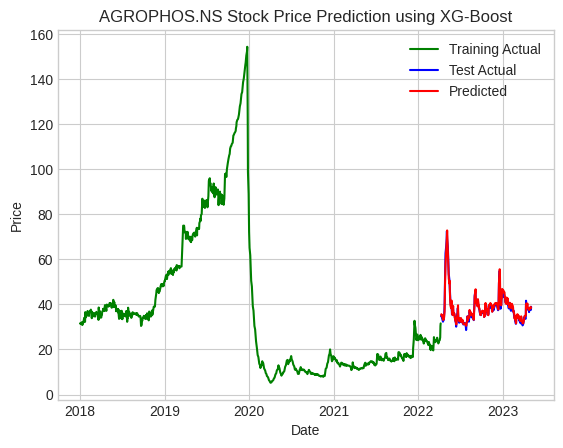

RMSE for AGROPHOS.NS using XGBoost: 1.2270713111428573


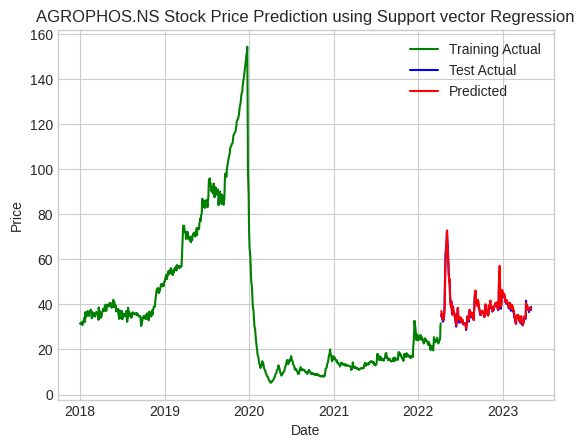

RMSE for AGROPHOS.NS using SVR: 0.9487734898045742
RMSE for AGROPHOS.NS using SVR: 0.9487734898045742
9/9 [==============================] - 0s 2ms/step


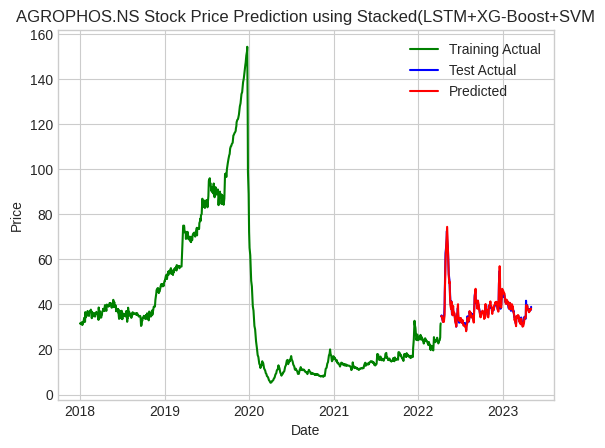

RMSE for AGROPHOS.NS using Stacked Algorithm: 1.1604936790232223


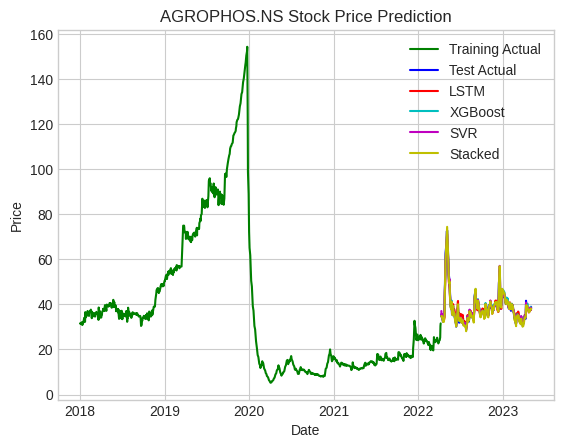

Model evaluation:
LSTM RMSE: 2.32
LSTM MAE: 1.17
LSTM R2 Score: 0.95
XGBoost RMSE: 1.23
XGBoost MAE: 0.88
XGBoost R2 Score: 0.97
SVR RMSE: 0.95
SVR MAE: 0.67
SVR R2 Score: 0.98
Stacked RMSE: 1.16
Stacked MAE: 0.82
Stacked R2 Score: 0.97


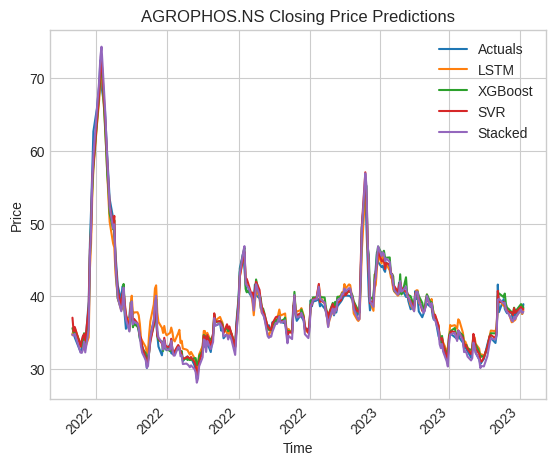

-------------------------------------------------------
Forecasting SIKKO.NS in Chemicals sector
Model: "sequential_158"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_295 (LSTM)             (None, 1, 50)             11800     
                                                                 
 dropout_54 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_296 (LSTM)             (None, 50)                20200     
                                                                 
 dropout_55 (Dropout)        (None, 50)                0         
                                                                 
 dense_295 (Dense)           (None, 25)                1275      
                                                                 
 dense_296 (Dense)           (None, 1)                 26        
                     

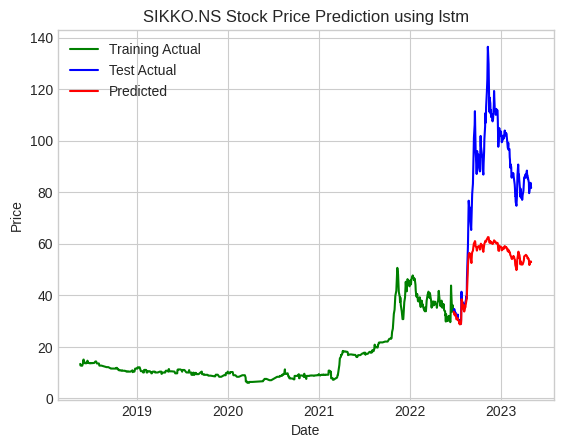

RMSE for SIKKO.NS using LSTM: 35.33538435363535
Fitting 5 folds for each of 45 candidates, totalling 225 fits
Best hyperparameters:  {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 1000}
Best score:  -0.7776195797188147
Mean Squared Error for XGBoost: 1839.2819


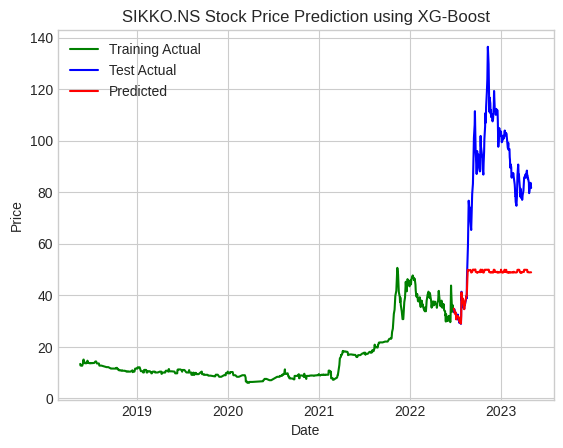

RMSE for SIKKO.NS using XGBoost: 42.88684992970953


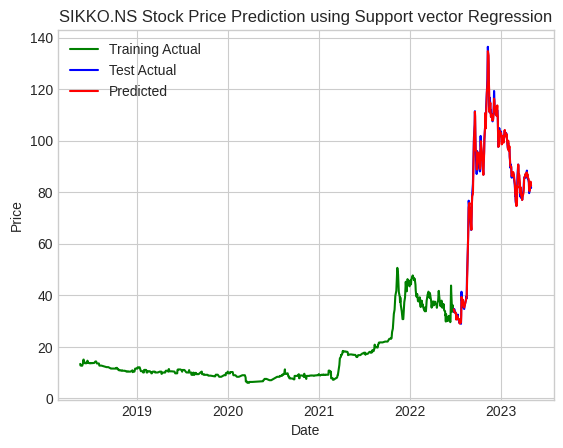

RMSE for SIKKO.NS using SVR: 1.5476445736616027
RMSE for SIKKO.NS using SVR: 1.5476445736616027
7/7 [==============================] - 0s 2ms/step


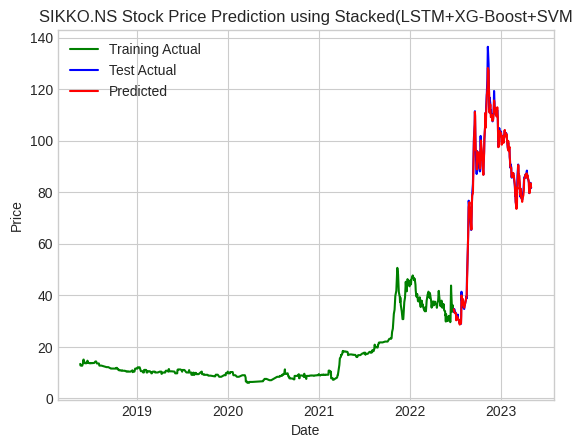

RMSE for SIKKO.NS using Stacked Algorithm: 1.7274558059714569


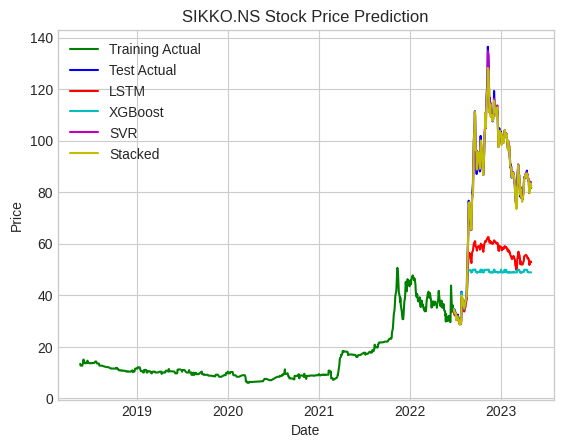

Model evaluation:
LSTM RMSE: 1248.59
LSTM MAE: 30.76
LSTM R2 Score: -0.78
XGBoost RMSE: 42.89
XGBoost MAE: 37.22
XGBoost R2 Score: -1.62
SVR RMSE: 1.55
SVR MAE: 1.07
SVR R2 Score: 1.00
Stacked RMSE: 1.73
Stacked MAE: 1.14
Stacked R2 Score: 1.00


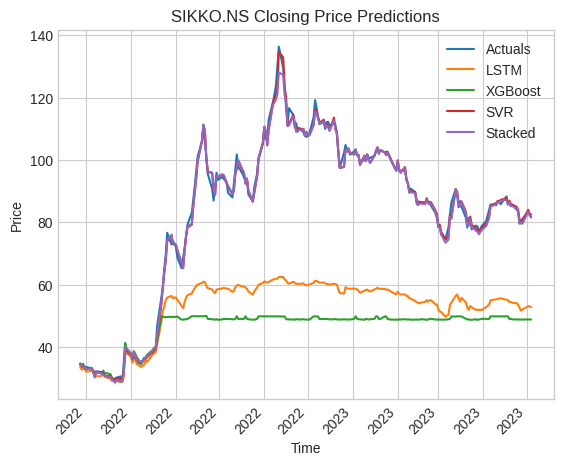

-------------------------------------------------------
Forecasting IITL.NS in Investment Banking & Investment Services sector
Model: "sequential_160"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_298 (LSTM)             (None, 1, 50)             11800     
                                                                 
 dropout_56 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_299 (LSTM)             (None, 50)                20200     
                                                                 
 dropout_57 (Dropout)        (None, 50)                0         
                                                                 
 dense_298 (Dense)           (None, 25)                1275      
                                                                 
 dense_299 (Dense)           (None, 1)                 26

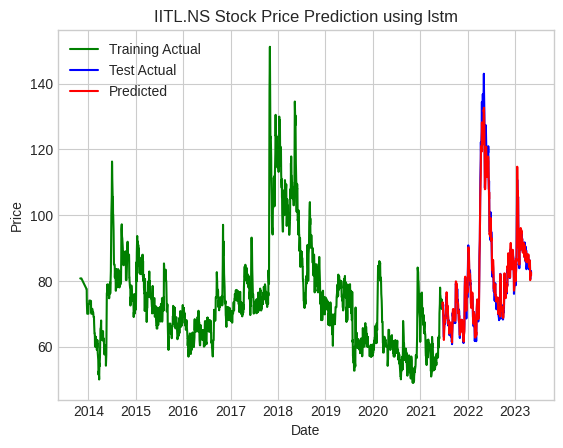

RMSE for IITL.NS using LSTM: 1.9998350182699602
Fitting 5 folds for each of 45 candidates, totalling 225 fits
Best hyperparameters:  {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
Best score:  0.9635839271836494
Mean Squared Error for XGBoost: 3.4216


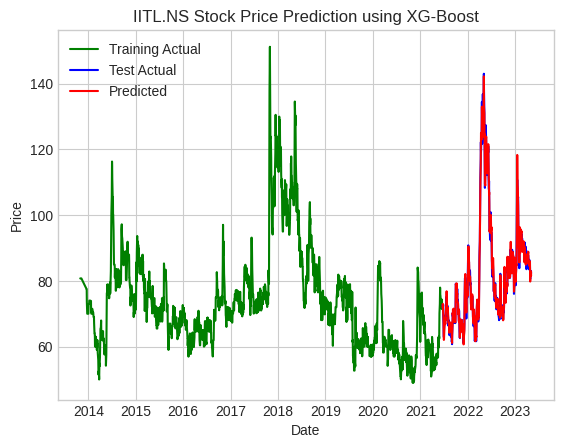

RMSE for IITL.NS using XGBoost: 1.8497543963049965


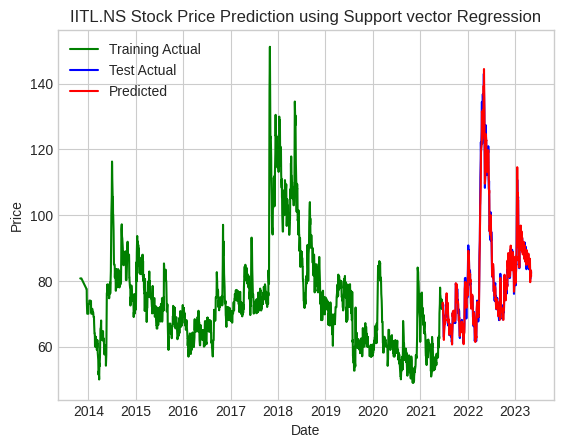

RMSE for IITL.NS using SVR: 1.731242411995205
RMSE for IITL.NS using SVR: 1.731242411995205
15/15 [==============================] - 0s 2ms/step


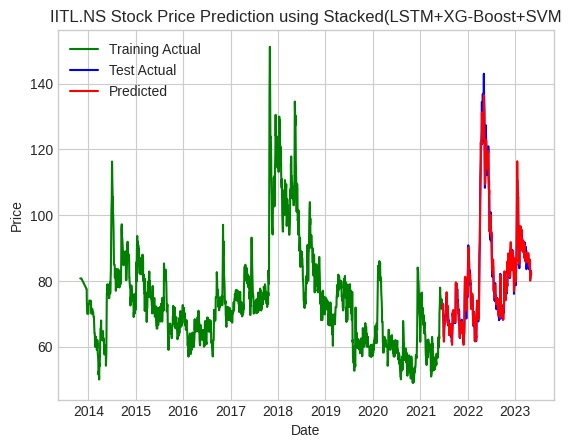

RMSE for IITL.NS using Stacked Algorithm: 1.6716033403767878


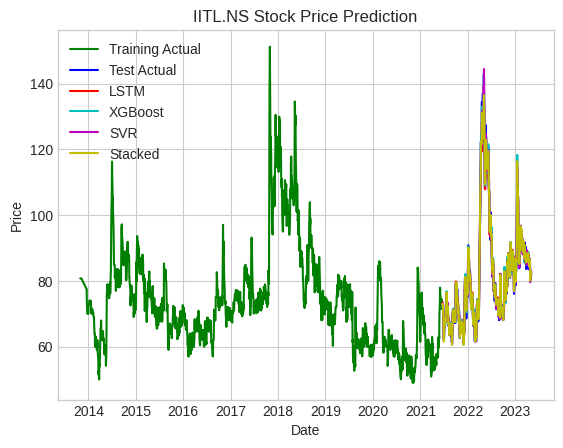

Model evaluation:
LSTM RMSE: 4.00
LSTM MAE: 1.34
LSTM R2 Score: 0.99
XGBoost RMSE: 1.85
XGBoost MAE: 1.33
XGBoost R2 Score: 0.99
SVR RMSE: 1.73
SVR MAE: 1.20
SVR R2 Score: 0.99
Stacked RMSE: 1.67
Stacked MAE: 1.23
Stacked R2 Score: 0.99


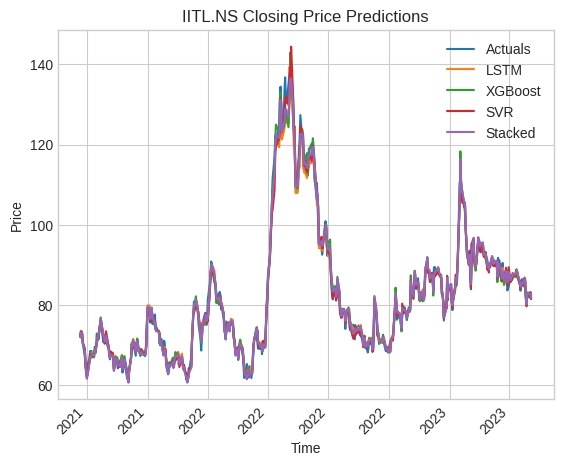

-------------------------------------------------------
Forecasting 21STCENMGM.NS in Investment Banking & Investment Services sector
Model: "sequential_162"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_301 (LSTM)             (None, 1, 50)             11800     
                                                                 
 dropout_58 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_302 (LSTM)             (None, 50)                20200     
                                                                 
 dropout_59 (Dropout)        (None, 50)                0         
                                                                 
 dense_301 (Dense)           (None, 25)                1275      
                                                                 
 dense_302 (Dense)           (None, 1)             

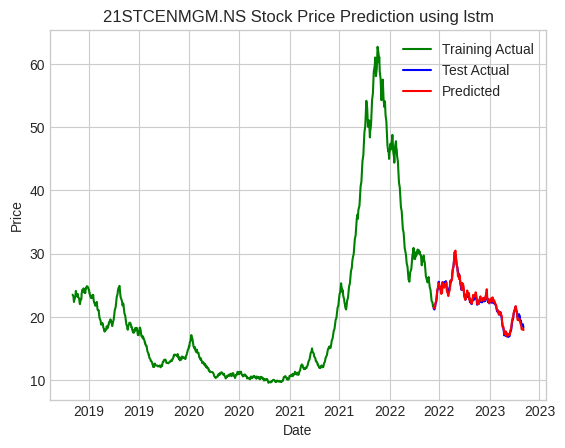

RMSE for 21STCENMGM.NS using LSTM: 0.34596117486046607
Fitting 5 folds for each of 45 candidates, totalling 225 fits
Best hyperparameters:  {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 1000}
Best score:  0.7565965068990422
Mean Squared Error for XGBoost: 0.0842


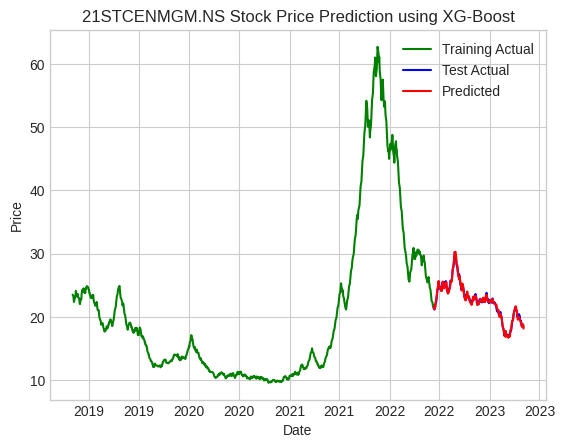

RMSE for 21STCENMGM.NS using XGBoost: 0.2902095537666712


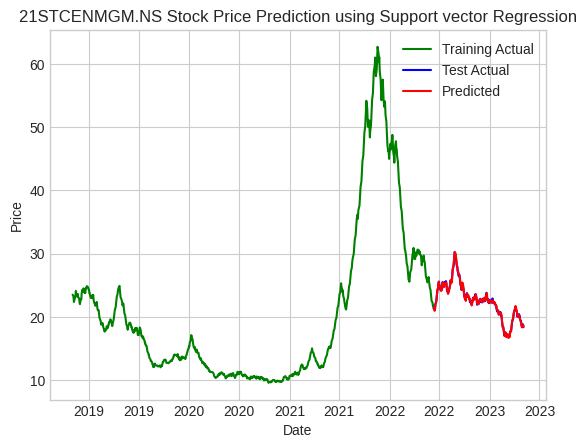

RMSE for 21STCENMGM.NS using SVR: 0.21988251254035646
RMSE for 21STCENMGM.NS using SVR: 0.21988251254035646
7/7 [==============================] - 0s 2ms/step


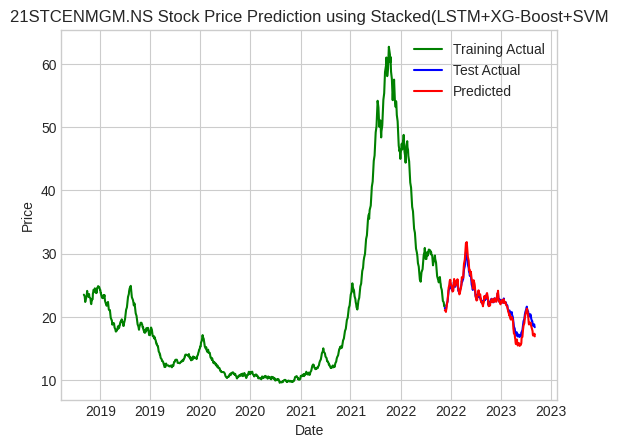

RMSE for 21STCENMGM.NS using Stacked Algorithm: 0.7128219570109141


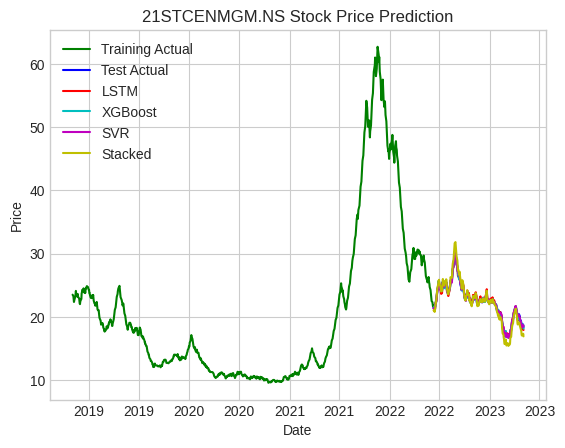

Model evaluation:
LSTM RMSE: 0.12
LSTM MAE: 0.28
LSTM R2 Score: 0.99
XGBoost RMSE: 0.29
XGBoost MAE: 0.23
XGBoost R2 Score: 0.99
SVR RMSE: 0.22
SVR MAE: 0.18
SVR R2 Score: 0.99
Stacked RMSE: 0.71
Stacked MAE: 0.55
Stacked R2 Score: 0.94


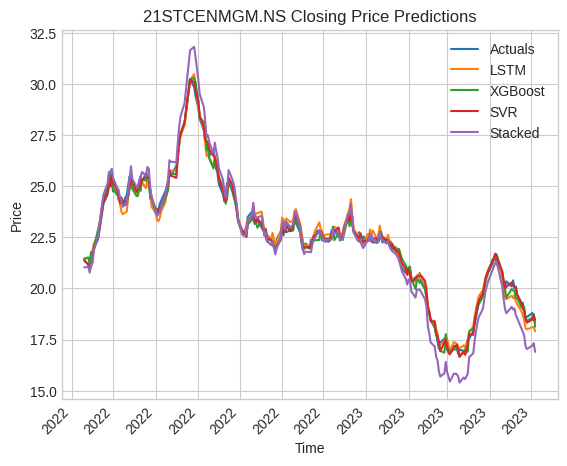

-------------------------------------------------------
Forecasting DBSTOCKBRO.NS in Investment Banking & Investment Services sector
Model: "sequential_164"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_304 (LSTM)             (None, 1, 50)             11800     
                                                                 
 dropout_60 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_305 (LSTM)             (None, 50)                20200     
                                                                 
 dropout_61 (Dropout)        (None, 50)                0         
                                                                 
 dense_304 (Dense)           (None, 25)                1275      
                                                                 
 dense_305 (Dense)           (None, 1)             

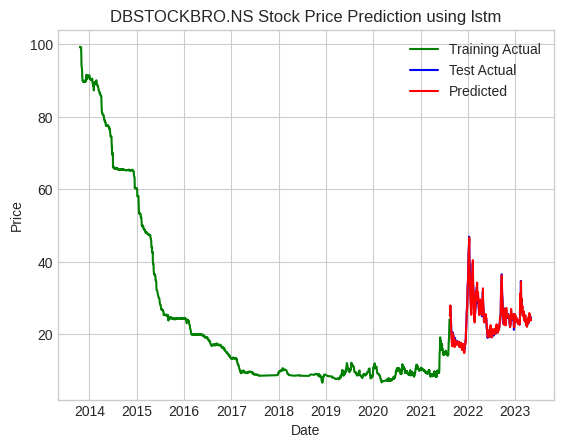

RMSE for DBSTOCKBRO.NS using LSTM: 0.7708821477256367
Fitting 5 folds for each of 45 candidates, totalling 225 fits
Best hyperparameters:  {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000}
Best score:  0.04726563745504979
Mean Squared Error for XGBoost: 0.7000


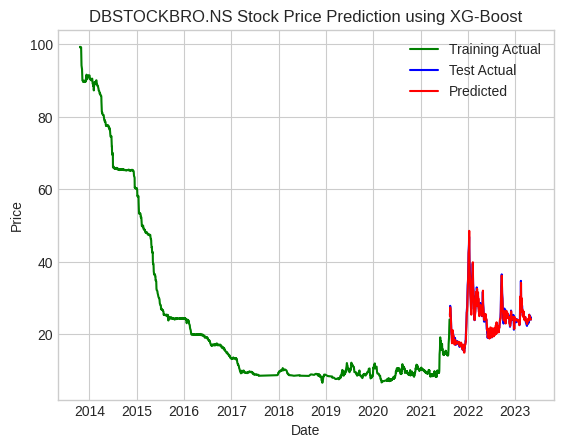

RMSE for DBSTOCKBRO.NS using XGBoost: 0.8366534409598366


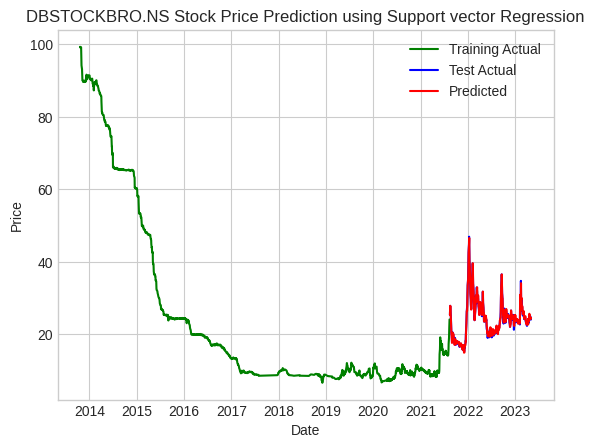

RMSE for DBSTOCKBRO.NS using SVR: 0.570501455823512
RMSE for DBSTOCKBRO.NS using SVR: 0.570501455823512
14/14 [==============================] - 0s 2ms/step


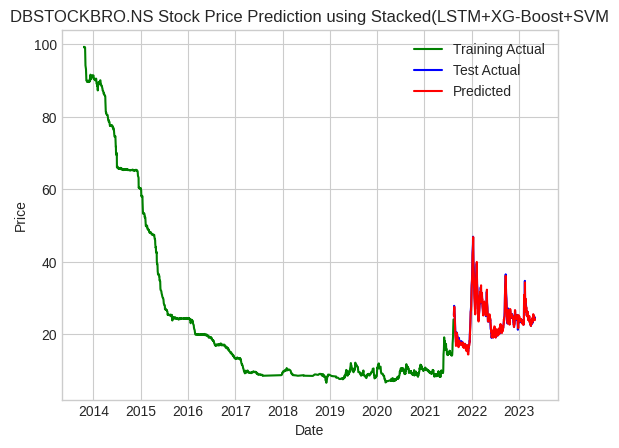

RMSE for DBSTOCKBRO.NS using Stacked Algorithm: 0.7401891060221482


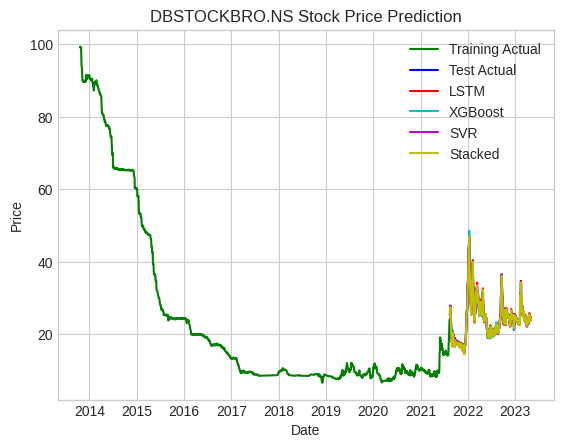

Model evaluation:
LSTM RMSE: 0.59
LSTM MAE: 0.56
LSTM R2 Score: 0.98
XGBoost RMSE: 0.84
XGBoost MAE: 0.59
XGBoost R2 Score: 0.98
SVR RMSE: 0.57
SVR MAE: 0.41
SVR R2 Score: 0.99
Stacked RMSE: 0.74
Stacked MAE: 0.55
Stacked R2 Score: 0.98


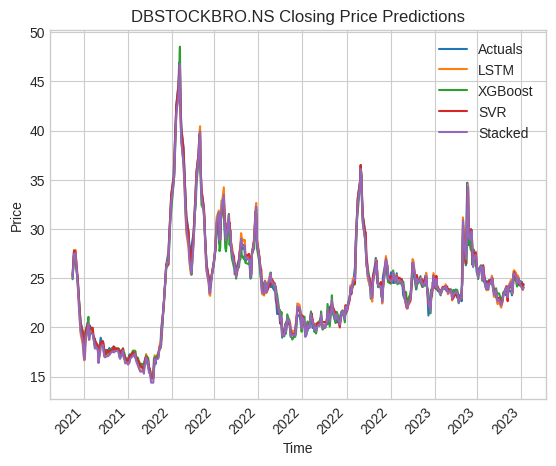

-------------------------------------------------------
Forecasting HBSL.NS in Investment Banking & Investment Services sector
Model: "sequential_166"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_307 (LSTM)             (None, 1, 50)             11800     
                                                                 
 dropout_62 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_308 (LSTM)             (None, 50)                20200     
                                                                 
 dropout_63 (Dropout)        (None, 50)                0         
                                                                 
 dense_307 (Dense)           (None, 25)                1275      
                                                                 
 dense_308 (Dense)           (None, 1)                 26

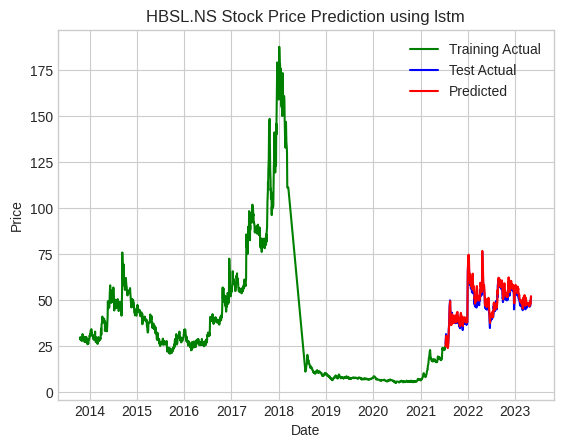

RMSE for HBSL.NS using LSTM: 2.125755636142287
Fitting 5 folds for each of 45 candidates, totalling 225 fits
Best hyperparameters:  {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1000}
Best score:  0.9437799078216113
Mean Squared Error for XGBoost: 1.3817


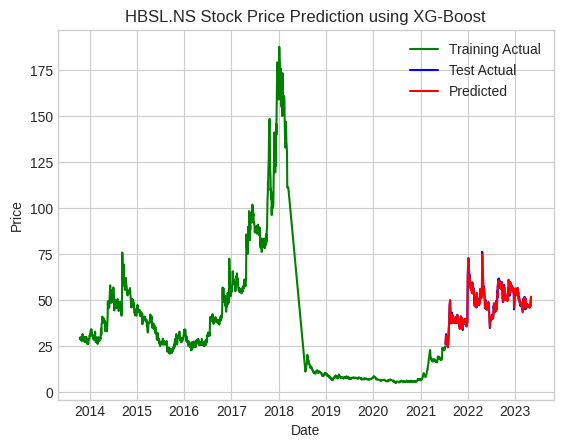

RMSE for HBSL.NS using XGBoost: 1.1754655091335333


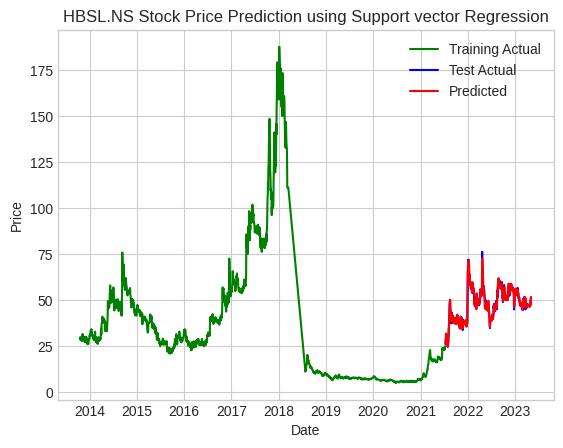

RMSE for HBSL.NS using SVR: 0.9910001545574023
RMSE for HBSL.NS using SVR: 0.9910001545574023
15/15 [==============================] - 0s 2ms/step


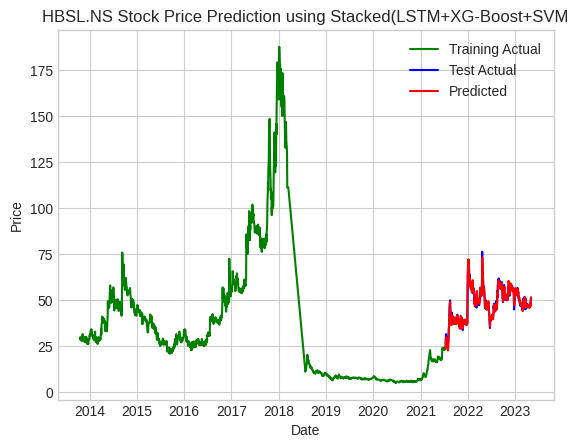

RMSE for HBSL.NS using Stacked Algorithm: 1.2750040006796868


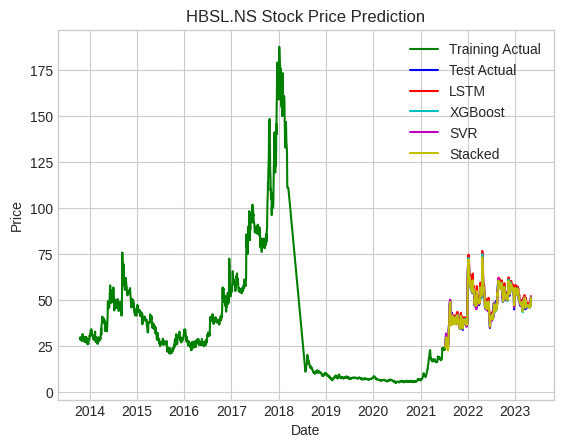

Model evaluation:
LSTM RMSE: 4.52
LSTM MAE: 1.75
LSTM R2 Score: 0.94
XGBoost RMSE: 1.18
XGBoost MAE: 0.84
XGBoost R2 Score: 0.98
SVR RMSE: 0.99
SVR MAE: 0.70
SVR R2 Score: 0.99
Stacked RMSE: 1.28
Stacked MAE: 0.93
Stacked R2 Score: 0.98


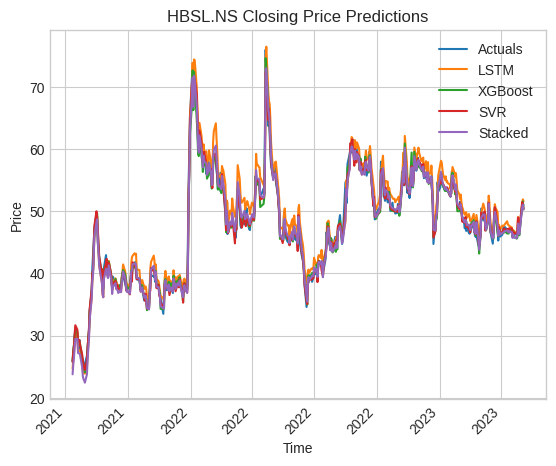

-------------------------------------------------------
Forecasting INDBANK.NS in Investment Banking & Investment Services sector
Model: "sequential_168"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_310 (LSTM)             (None, 1, 50)             11800     
                                                                 
 dropout_64 (Dropout)        (None, 1, 50)             0         
                                                                 
 lstm_311 (LSTM)             (None, 50)                20200     
                                                                 
 dropout_65 (Dropout)        (None, 50)                0         
                                                                 
 dense_310 (Dense)           (None, 25)                1275      
                                                                 
 dense_311 (Dense)           (None, 1)                

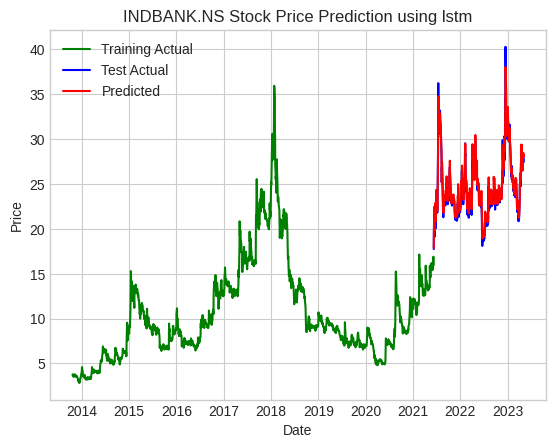

RMSE for INDBANK.NS using LSTM: 0.7202237504355207
Fitting 5 folds for each of 45 candidates, totalling 225 fits
Best hyperparameters:  {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
Best score:  0.7661533701934594
Mean Squared Error for XGBoost: 0.5158


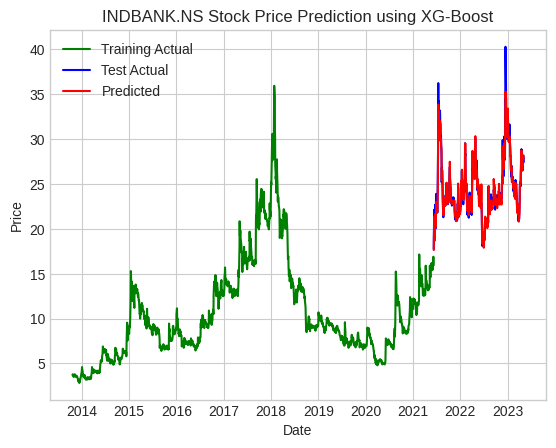

RMSE for INDBANK.NS using XGBoost: 0.7182205499157824


KeyboardInterrupt: ignored

In [ ]:
#New Test

#BEST CODE

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.ensemble import StackingRegressor
from keras.layers import Dropout
from xgboost import XGBRegressor
import matplotlib.dates as mdates
import xgboost as xgb
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.callbacks import EarlyStopping
import numpy as np
import pandas as pd



# Function to reshape data for LSTM
def reshape_data(data):
    return np.reshape(data, (data.shape[0], 1, data.shape[1]))

# Function to compute RSI
def compute_RSI(data, window=7):
    delta = data.diff()
    gain = delta.where(delta > 0, 0)
    loss = -delta.where(delta < 0, 0)
    avg_gain = gain.rolling(window=window).mean()
    avg_loss = loss.rolling(window=window).mean()
    RS = avg_gain / avg_loss
    RSI = 100.0 - (100.0 / (1.0 + RS))
    return RSI


# pre-process data and train models for each stock
for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')
        
        # get data for the stock
        stock_data = df_historical_data.loc[df_historical_data['ticker'] == stock]
        stock_data = stock_data.drop(['ticker', 'volume', 'adjclose'], axis=1)
        stock_data['MA50'] = stock_data['close'].rolling(window=50).mean()
        stock_data['MA200'] = stock_data['close'].rolling(window=200).mean()
        stock_data['RSI'] = compute_RSI(stock_data['close'])
        stock_data['Bollinger_upper'] = stock_data['MA50'] + 2 * stock_data['close'].rolling(window=50).std()
        stock_data['Bollinger_lower'] = stock_data['MA50'] - 2 * stock_data['close'].rolling(window=50).std()
        stock_data = stock_data.dropna()
        stock_data = stock_data.drop(['Sector'], axis=1) # drop sector column
        
        # split data into train and test sets
        X = stock_data.drop(['close'], axis=1)
        y = stock_data['close']
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False, random_state=42)
        
        # scale data using StandardScaler
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        y_train_scaled = scaler.fit_transform(y_train.values.reshape(-1,1))
        y_test_scaled = scaler.transform(y_test.values.reshape(-1,1))
        
        # reshape data for LSTM
        X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
        X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

        early_stop = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=10, verbose=1)

        model_lstm = Sequential()
        model_lstm.add(LSTM(50, return_sequences=True, input_shape=(1, X_train_scaled.shape[1])))
        model_lstm.add(Dropout(0.2))
        model_lstm.add(LSTM(50, return_sequences=False))
        model_lstm.add(Dropout(0.2))
        model_lstm.add(Dense(25))
        model_lstm.add(Dense(1))
        model_lstm.compile(loss='mse', optimizer='adam')
        model_lstm.summary()

        history_lstm = model_lstm.fit(X_train_reshaped, y_train_scaled, epochs=100, batch_size=32, validation_data=(X_test_reshaped, y_test_scaled), callbacks=[early_stop], verbose=1)
        
        # predict using LSTM model
        y_test_pred_lstm = scaler.inverse_transform(model_lstm.predict(X_test_reshaped))

        # plot actual and predicted prices for LSTM
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_lstm, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        plt.title(f'{stock} Stock Price Prediction using lstm')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()


        # evaluate model using RMSE
        rmse_lstm = np.sqrt(mean_squared_error(y_test, y_test_pred_lstm))
        print(f'RMSE for {stock} using LSTM: {rmse_lstm}')
      
        # define parameter grid for XGBoost model
        param_grid = {
            'max_depth': [3, 4, 5],
            'learning_rate': [0.1, 0.01, 0.001],
            'n_estimators': [50, 100,150, 500, 1000]
        }

        model_xgb = XGBRegressor()

        # Perform a grid search to find the best hyperparameters
        grid_search =GridSearchCV(model_xgb, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1)
        # fit GridSearchCV object to data
        grid_search.fit(X_train_scaled, y_train_scaled.ravel())

        # Print the best hyperparameters and the corresponding score
        print("Best hyperparameters: ", grid_search.best_params_)
        print("Best score: ", grid_search.best_score_)

        # Extract the best hyperparameters and import them into the model
        best_params = grid_search.best_params_
        best_score = grid_search.best_score_
        best_params['objective'] = 'reg:squarederror'

        model_xgb = xgb.XGBRegressor(**best_params)

        model_xgb.fit(X_train, y_train)

        # predict using XGBoost model
        y_test_pred_xgb = model_xgb.predict(X_test)

        # compute mean squared error for XGBoost
        mse_xgb = mean_squared_error(y_test, y_test_pred_xgb)
        print(f'Mean Squared Error for XGBoost: {mse_xgb:.4f}')

        # plot actual and predicted prices for XG-Boost
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_xgb, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        plt.title(f'{stock} Stock Price Prediction using XG-Boost')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
        print(f'RMSE for {stock} using XGBoost: {rmse_xgb}')

        # train SVM model
        # define parameter grid for SVR model
        param_grid = {
            'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
            'C': [0.01, 0.1, 1, 10, 100],
            'epsilon': [0.01, 0.1, 1, 10, 100]
        }

        # perform grid search to find best hyperparameters for SVR
        grid_svr = GridSearchCV(SVR(), param_grid, scoring='neg_root_mean_squared_error', cv=5, n_jobs=-1)
        grid_svr.fit(X_train_scaled, y_train_scaled.ravel())

        # fit SVR model with best hyperparameters
        best_svr = SVR(kernel=grid_svr.best_params_['kernel'], C=grid_svr.best_params_['C'], epsilon=grid_svr.best_params_['epsilon'])
        best_svr.fit(X_train_scaled, y_train_scaled.ravel())

        # predict using SVR model
        y_test_pred_svr = scaler.inverse_transform(best_svr.predict(X_test_scaled).reshape(-1,1))


        # model_svm = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
        # model_svm.fit(X_train_scaled, y_train_scaled.ravel())
        
        # # predict using SVM model
        # y_test_pred_svm = model_svm.predict(X_test_scaled)
        # y_test_pred_svm = y_test_pred_svm.reshape(-1, 1)
        # y_test_pred_svm = scaler.inverse_transform(y_test_pred_svm)

       # plot actual and predicted prices for SVM
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_svr, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        plt.title(f'{stock} Stock Price Prediction using Support vector Regression')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_svr = np.sqrt(mean_squared_error(y_test, y_test_pred_svr))
        print(f'RMSE for {stock} using SVR: {rmse_svr}')

        # evaluate model using RMSE
        rmse_svr = np.sqrt(mean_squared_error(y_test, y_test_pred_svr))
        print(f'RMSE for {stock} using SVR: {rmse_svr}')

        # stack predictions using linear regression
        stacked_predictions = np.column_stack((y_test_pred_lstm, y_test_pred_xgb, y_test_pred_svr))
        stacked_predictions_reshaped = stacked_predictions.reshape((stacked_predictions.shape[0], stacked_predictions.shape[1], 1))
        model_stacked = Sequential()
        model_stacked.add(LSTM(units=50, activation='relu', input_shape=(stacked_predictions.shape[1], 1)))
        model_stacked.add(Dense(1))
        model_stacked.compile(loss='mse', optimizer='adam')
        history_stacked = model_stacked.fit(stacked_predictions_reshaped, y_test.values, epochs=20, batch_size=32, verbose=0)
        y_test_pred_stacked = model_stacked.predict(stacked_predictions_reshaped)

        # plot actual and predicted prices for Stacked
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_stacked, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        plt.title(f'{stock} Stock Price Prediction using Stacked(LSTM+XG-Boost+SVM')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_stacked = np.sqrt(mean_squared_error(y_test, y_test_pred_stacked))
        print(f'RMSE for {stock} using Stacked Algorithm: {rmse_stacked}')

       # plot actual and predicted prices for all algorithms and stacked algorithm
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_lstm, 'r-', label='LSTM')
        ax.plot_date(X_test.index, y_test_pred_xgb, 'c-', label='XGBoost')
        ax.plot_date(X_test.index, y_test_pred_svr, 'm-', label='SVR')
        ax.plot_date(X_test.index, y_test_pred_stacked, 'y-', label='Stacked')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        plt.title(f'{stock} Stock Price Prediction')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()


        print('Model evaluation:')
    
        # LSTM
        rmse_lstm = mean_squared_error(y_test, y_test_pred_lstm)
        print(f'LSTM RMSE: {rmse_lstm:.2f}')

        mae_lstm = mean_absolute_error(y_test, y_test_pred_lstm)
        print(f'LSTM MAE: {mae_lstm:.2f}')

        r2_lstm = r2_score(y_test, y_test_pred_lstm)
        print(f'LSTM R2 Score: {r2_lstm:.2f}')
        
        # XGBoost
        rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
        print(f'XGBoost RMSE: {rmse_xgb:.2f}')

        mae_xgb = mean_absolute_error(y_test, y_test_pred_xgb)
        print(f'XGBoost MAE: {mae_xgb:.2f}')

        r2_xgb = r2_score(y_test, y_test_pred_xgb)
        print(f'XGBoost R2 Score: {r2_xgb:.2f}')
        
        # SVM
        rmse_svr = np.sqrt(mean_squared_error(y_test, y_test_pred_svr))
        print(f'SVR RMSE: {rmse_svr:.2f}')

        mae_svr = mean_absolute_error(y_test, y_test_pred_svr)
        print(f'SVR MAE: {mae_svr:.2f}')
        
        r2_svr = r2_score(y_test, y_test_pred_svr)
        print(f'SVR R2 Score: {r2_svr:.2f}')


        # Stacked
        rmse_stacked = np.sqrt(mean_squared_error(y_test, y_test_pred_stacked))
        print(f'Stacked RMSE: {rmse_stacked:.2f}')

        mae_stacked = mean_absolute_error(y_test, y_test_pred_stacked)
        print(f'Stacked MAE: {mae_stacked:.2f}')

        r2_stacked = r2_score(y_test, y_test_pred_stacked)
        print(f'Stacked R2 Score: {r2_stacked:.2f}')

        
        
        # plot predictions vs actuals
        plt.plot(X_test.index, y_test.values, label='Actuals')
        plt.plot(X_test.index, y_test_pred_lstm, label='LSTM')
        plt.plot(X_test.index, y_test_pred_xgb, label='XGBoost')
        plt.plot(X_test.index, y_test_pred_svr, label='SVR')
        plt.plot(X_test.index, y_test_pred_stacked, label='Stacked')
        plt.title(f'{stock} Closing Price Predictions')
        plt.xlabel('Time')
        plt.ylabel('Price')
        plt.xticks(rotation=45, ha='right') # rotate the x-axis labels for better readability
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y')) # set the date format to display only the year
        plt.legend()
        plt.show()
        
        print('-------------------------------------------------------')


In [ ]:
#New Test

#BEST CODE

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.ensemble import StackingRegressor
from keras.layers import Dropout
from xgboost import XGBRegressor
import matplotlib.dates as mdates
import xgboost as xgb
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.callbacks import EarlyStopping
import numpy as np
import pandas as pd
from keras import regularizers
from tensorflow.keras.optimizers import Adam



# Function to reshape data for LSTM
def reshape_data(data):
    return np.reshape(data, (data.shape[0], 1, data.shape[1]))

# Function to compute RSI
def compute_RSI(data, window=7):
    delta = data.diff()
    gain = delta.where(delta > 0, 0)
    loss = -delta.where(delta < 0, 0)
    avg_gain = gain.rolling(window=window).mean()
    avg_loss = loss.rolling(window=window).mean()
    RS = avg_gain / avg_loss
    RSI = 100.0 - (100.0 / (1.0 + RS))
    return RSI


# pre-process data and train models for each stock
for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')
        
        # get data for the stock
        stock_data = df_historical_data.loc[df_historical_data['ticker'] == stock]
        stock_data = stock_data.drop(['ticker', 'volume', 'adjclose'], axis=1)
        stock_data['MA50'] = stock_data['close'].rolling(window=50).mean()
        stock_data['MA200'] = stock_data['close'].rolling(window=200).mean()
        stock_data['RSI'] = compute_RSI(stock_data['close'])
        stock_data['Bollinger_upper'] = stock_data['MA50'] + 2 * stock_data['close'].rolling(window=50).std()
        stock_data['Bollinger_lower'] = stock_data['MA50'] - 2 * stock_data['close'].rolling(window=50).std()
        stock_data = stock_data.dropna()
        stock_data = stock_data.drop(['Sector'], axis=1) # drop sector column
        
        # split data into train and test sets
        X = stock_data.drop(['close'], axis=1)
        y = stock_data['close']
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False, random_state=42)
        
        # scale data using StandardScaler
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        y_train_scaled = scaler.fit_transform(y_train.values.reshape(-1,1))
        y_test_scaled = scaler.transform(y_test.values.reshape(-1,1))
        
        # reshape data for LSTM
        X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
        X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

        

        early_stop = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=10, verbose=1)

        model_lstm = Sequential()
        model_lstm.add(LSTM(100, return_sequences=True, input_shape=(1, X_train_scaled.shape[1]), kernel_regularizer=regularizers.l2(0.001)))
        model_lstm.add(Dropout(0.2))
        model_lstm.add(LSTM(100, return_sequences=False, kernel_regularizer=regularizers.l2(0.001)))
        model_lstm.add(Dropout(0.2))
        model_lstm.add(Dense(25))
        model_lstm.add(Dense(1))
        model_lstm.compile(loss='mse', optimizer=Adam(learning_rate=0.001))
        model_lstm.summary()

        history_lstm = model_lstm.fit(X_train_reshaped, y_train_scaled, epochs=200, batch_size=64, validation_data=(X_test_reshaped, y_test_scaled), callbacks=[early_stop], verbose=1)

        # predict using LSTM model
        y_test_pred_lstm = scaler.inverse_transform(model_lstm.predict(X_test_reshaped))

        # plot actual and predicted prices for LSTM
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_lstm, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        plt.title(f'{stock} Stock Price Prediction using lstm')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        rmse_lstm = np.sqrt(mean_squared_error(y_test, y_test_pred_lstm))
        print(f'RMSE for {stock} using LSTM: {rmse_lstm}')
      
        # define parameter grid for XGBoost model
        param_grid = {
            'max_depth': [3, 4, 5],
            'learning_rate': [0.1, 0.01, 0.001],
            'n_estimators': [50, 100,150, 500, 1000]
        }

        model_xgb = XGBRegressor()

        # Perform a grid search to find the best hyperparameters
        grid_search =GridSearchCV(model_xgb, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1)
        # fit GridSearchCV object to data
        grid_search.fit(X_train_scaled, y_train_scaled.ravel())

        # Print the best hyperparameters and the corresponding score
        print("Best hyperparameters: ", grid_search.best_params_)
        print("Best score: ", grid_search.best_score_)

        # Extract the best hyperparameters and import them into the model
        best_params = grid_search.best_params_
        best_score = grid_search.best_score_
        best_params['objective'] = 'reg:squarederror'

        model_xgb = xgb.XGBRegressor(**best_params)

        model_xgb.fit(X_train, y_train)

        # predict using XGBoost model
        y_test_pred_xgb = model_xgb.predict(X_test)

        # compute mean squared error for XGBoost
        mse_xgb = mean_squared_error(y_test, y_test_pred_xgb)
        print(f'Mean Squared Error for XGBoost: {mse_xgb:.4f}')

        # plot actual and predicted prices for XG-Boost
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_xgb, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        plt.title(f'{stock} Stock Price Prediction using XG-Boost')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
        print(f'RMSE for {stock} using XGBoost: {rmse_xgb}')

        # train SVM model
        # define parameter grid for SVR model
        param_grid = {
            'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
            'C': [0.01, 0.1, 1, 10, 100],
            'epsilon': [0.01, 0.1, 1, 10, 100]
        }

        # perform grid search to find best hyperparameters for SVR
        grid_svr = GridSearchCV(SVR(), param_grid, scoring='neg_root_mean_squared_error', cv=5, n_jobs=-1)
        grid_svr.fit(X_train_scaled, y_train_scaled.ravel())

        # fit SVR model with best hyperparameters
        best_svr = SVR(kernel=grid_svr.best_params_['kernel'], C=grid_svr.best_params_['C'], epsilon=grid_svr.best_params_['epsilon'])
        best_svr.fit(X_train_scaled, y_train_scaled.ravel())

        # predict using SVR model
        y_test_pred_svr = scaler.inverse_transform(best_svr.predict(X_test_scaled).reshape(-1,1))


        # model_svm = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
        # model_svm.fit(X_train_scaled, y_train_scaled.ravel())
        
        # # predict using SVM model
        # y_test_pred_svm = model_svm.predict(X_test_scaled)
        # y_test_pred_svm = y_test_pred_svm.reshape(-1, 1)
        # y_test_pred_svm = scaler.inverse_transform(y_test_pred_svm)

       # plot actual and predicted prices for SVM
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_svr, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        plt.title(f'{stock} Stock Price Prediction using Support vector Regression')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_svr = np.sqrt(mean_squared_error(y_test, y_test_pred_svr))
        print(f'RMSE for {stock} using SVR: {rmse_svr}')

        # evaluate model using RMSE
        rmse_svr = np.sqrt(mean_squared_error(y_test, y_test_pred_svr))
        print(f'RMSE for {stock} using SVR: {rmse_svr}')

        # stack predictions using linear regression
        stacked_predictions = np.column_stack((y_test_pred_lstm, y_test_pred_xgb, y_test_pred_svr))
        stacked_predictions_reshaped = stacked_predictions.reshape((stacked_predictions.shape[0], stacked_predictions.shape[1], 1))
        model_stacked = Sequential()
        model_stacked.add(LSTM(units=50, activation='relu', input_shape=(stacked_predictions.shape[1], 1)))
        model_stacked.add(Dense(1))
        model_stacked.compile(loss='mse', optimizer='adam')
        history_stacked = model_stacked.fit(stacked_predictions_reshaped, y_test.values, epochs=20, batch_size=32, verbose=0)
        y_test_pred_stacked = model_stacked.predict(stacked_predictions_reshaped)

        # plot actual and predicted prices for Stacked
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_stacked, 'r-', label='Predicted')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        plt.title(f'{stock} Stock Price Prediction using Stacked(LSTM+XG-Boost+SVM')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # evaluate model using RMSE
        rmse_stacked = np.sqrt(mean_squared_error(y_test, y_test_pred_stacked))
        print(f'RMSE for {stock} using Stacked Algorithm: {rmse_stacked}')

       # plot actual and predicted prices for all algorithms and stacked algorithm
        fig, ax = plt.subplots()
        ax.plot_date(X_train.index, y_train, 'g-', label='Training Actual')
        ax.plot_date(X_test.index, y_test, 'b-', label='Test Actual')
        ax.plot_date(X_test.index, y_test_pred_lstm, 'r-', label='LSTM')
        ax.plot_date(X_test.index, y_test_pred_xgb, 'c-', label='XGBoost')
        ax.plot_date(X_test.index, y_test_pred_svr, 'm-', label='SVR')
        ax.plot_date(X_test.index, y_test_pred_stacked, 'y-', label='Stacked')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        plt.title(f'{stock} Stock Price Prediction')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()


        print('Model evaluation:')
    
        # LSTM
        rmse_lstm = mean_squared_error(y_test, y_test_pred_lstm)
        print(f'LSTM RMSE: {rmse_lstm:.2f}')

        mae_lstm = mean_absolute_error(y_test, y_test_pred_lstm)
        print(f'LSTM MAE: {mae_lstm:.2f}')

        r2_lstm = r2_score(y_test, y_test_pred_lstm)
        print(f'LSTM R2 Score: {r2_lstm:.2f}')
        
        # XGBoost
        rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
        print(f'XGBoost RMSE: {rmse_xgb:.2f}')

        mae_xgb = mean_absolute_error(y_test, y_test_pred_xgb)
        print(f'XGBoost MAE: {mae_xgb:.2f}')

        r2_xgb = r2_score(y_test, y_test_pred_xgb)
        print(f'XGBoost R2 Score: {r2_xgb:.2f}')
        
        # SVM
        rmse_svr = np.sqrt(mean_squared_error(y_test, y_test_pred_svr))
        print(f'SVR RMSE: {rmse_svr:.2f}')

        mae_svr = mean_absolute_error(y_test, y_test_pred_svr)
        print(f'SVR MAE: {mae_svr:.2f}')
        
        r2_svr = r2_score(y_test, y_test_pred_svr)
        print(f'SVR R2 Score: {r2_svr:.2f}')


        # Stacked
        rmse_stacked = np.sqrt(mean_squared_error(y_test, y_test_pred_stacked))
        print(f'Stacked RMSE: {rmse_stacked:.2f}')

        mae_stacked = mean_absolute_error(y_test, y_test_pred_stacked)
        print(f'Stacked MAE: {mae_stacked:.2f}')

        r2_stacked = r2_score(y_test, y_test_pred_stacked)
        print(f'Stacked R2 Score: {r2_stacked:.2f}')

        
        
        # plot predictions vs actuals
        plt.plot(X_test.index, y_test.values, label='Actuals')
        plt.plot(X_test.index, y_test_pred_lstm, label='LSTM')
        plt.plot(X_test.index, y_test_pred_xgb, label='XGBoost')
        plt.plot(X_test.index, y_test_pred_svr, label='SVR')
        plt.plot(X_test.index, y_test_pred_stacked, label='Stacked')
        plt.title(f'{stock} Closing Price Predictions')
        plt.xlabel('Time')
        plt.ylabel('Price')
        plt.xticks(rotation=45, ha='right') # rotate the x-axis labels for better readability
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y')) # set the date format to display only the year
        plt.legend()
        plt.show()
        
        print('-------------------------------------------------------')


Regression Algorithms

- Linear Regression

- Support Vector Regression

- MLP Regression

- KNN Regressor

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler

In [ ]:
# Define the regression algorithms
regression_algorithms = {
    'Linear Regression': LinearRegression(),
    'Support Vector Regression': SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1),
    'Multi layer Perceptron Regression': MLPRegressor(hidden_layer_sizes=(100, 50), activation='relu', solver='adam', alpha=0.001, max_iter=1000),
    'KNN Regression': KNeighborsRegressor(n_neighbors=5, weights='distance')
}

In [ ]:
from sklearn.model_selection import train_test_split

# Loop through each sector and stock
for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')

        # Filter the data for the current stock
        data_stock = df_historical_data[df_historical_data['ticker'] == stock]

        # Separate the features and target variable
        X = data_stock.drop(['close', 'Sector', 'ticker'], axis=1)
        y = data_stock['close']
        
        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, shuffle=False)

        # Apply feature scaling
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # Apply regression algorithms and evaluate their performance
        for name, algorithm in regression_algorithms.items():
            algorithm.fit(X_train_scaled, y_train)
            y_pred = algorithm.predict(X_test_scaled)
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)
            r2 = r2_score(y_test, y_pred)
            print(" This is mse score : ",mse)
            print(" This is rmse score : ",rmse)
            print(" This is r2 score : ", r2)
            # print(f'{name}: RMSE={rmse:rms}, R-squared={r2:.2f}')
            
            # Plot the forecasted and actual stock prices
            sns.lineplot(x=X_test.index, y=y_test, label='Actual')
            sns.lineplot(x=X_test.index, y=y_pred, label='Forecast')
            plt.xlabel('Date')
            plt.ylabel('Closing Price')
            plt.title(f'{name} Forecast for {stock} in {sector} Sector')
            plt.legend()
            plt.show()


LSTM ( With Good RMSE SCORE)

In [ ]:
from keras.optimizers import RMSprop
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')

        # Get the historical data for the stock
        stock_data = df_historical_data[df_historical_data['ticker']==stock].copy()

        # Create a new dataframe with only the 'Close' column 
        data = stock_data.filter(['close'])
        data = pd.DataFrame(data)

        # Convert the dataframe to a numpy array
        dataset = data.values

        # Get the number of rows to train the model on
        training_data_len = int(np.ceil(len(dataset) * .80))

        # Scale the data
        from sklearn.preprocessing import MinMaxScaler

        scaler = MinMaxScaler(feature_range=(0,1))
        scaled_data = scaler.fit_transform(dataset)

        # Create the scaled training data set
        train_data = scaled_data[0:int(training_data_len), :]

        # Split the data into x_train and y_train data sets
        x_train = []
        y_train = []

        for i in range(100, len(train_data)):
            x_train.append(train_data[i-100:i, 0])
            y_train.append(train_data[i, 0])

        # Convert the x_train and y_train to numpy arrays 
        x_train, y_train = np.array(x_train), np.array(y_train)
        

        # Reshape the data
        x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

        # Build the LSTM model
        from keras.models import Sequential
        from keras.layers import Dense, LSTM, Dropout
        from keras.callbacks import EarlyStopping
        
        model = Sequential()
        model.add(LSTM(50, return_sequences=True, input_shape= (x_train.shape[1], 1)))
        model.add(LSTM(50, return_sequences=False))
        model.add(Dense(25))
        model.add(Dense(1))
        model.compile(loss="mean_squared_error", optimizer='adam')
        #model.compile(loss='mean_squared_error',optimizer='adam')
        model.summary()
        

        # Create EarlyStopping callback with a patience of 10 epochs and a minimum improvement of 0.001
        early_stop = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=10, verbose=1)

        # Train the model
        # Train the model with the EarlyStopping callback
        history = model.fit(x_train, y_train, epochs=100, batch_size=64, verbose=1, validation_split=0.1, callbacks=[early_stop])
        
         # Plot the loss and accuracy curves for training and validation
        plt.figure(figsize=(10, 5))
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'{stock} {sector} LSTM Model Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend(loc='upper right')
        plt.show()
        
        # Create a new array containing scaled values from index 1543 to 2002
        test_data = scaled_data[training_data_len - 100:, :]

        # Create the data sets x_test and y_test
        x_test = []
        y_test = dataset[training_data_len:, :]

        for i in range(100, len(test_data)):
            x_test.append(test_data[i - 100:i, 0])

        # Convert the data to a numpy array
        x_test = np.array(x_test)

        # Reshape the data
        x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

        # Get the model's predicted price values
        predictions = model.predict(x_test)
        predictions = scaler.inverse_transform(predictions)

        # Get the root mean squared error (RMSE)
        rmse = np.sqrt(mean_squared_error(y_test, predictions))
        print(f"RMSE: {rmse:.2f}")

        # Get the mean absolute error (MAE)
        mae = mean_absolute_error(y_test, predictions)
        print(f"MAE: {mae:.2f}")

        # Get the coefficient of determination (R-squared)
        r2 = r2_score(y_test, predictions)
        print(f"R-squared: {r2:.2f}")

        # Plot the data
        train = data[:training_data_len]
        valid = data[training_data_len:]
        valid['Predictions'] = predictions

        # Visualize the data
        import matplotlib.pyplot as plt
        import seaborn as sns

        plt.style.use('seaborn-whitegrid') # Set the plot style to white grid

        plt.figure(figsize=(16, 6))
        plt.title('Model')
        plt.xlabel('Date', fontsize=18)
        plt.ylabel('Closing Price', fontsize=18)

        sns.lineplot(data=train['close'])
        sns.lineplot(data=valid[['close', 'Predictions']])

        plt.legend(['Train', 'Val', 'Predictions'], loc='lower right')
        plt.show()


GRU

In [ ]:
from keras.optimizers import RMSprop

for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')

        # Get the historical data for the stock
        stock_data = df_historical_data[df_historical_data['ticker']==stock].copy()

        # Create a new dataframe with only the 'Close' column 
        data = stock_data.filter(['close'])
        data = pd.DataFrame(data)

        # Convert the dataframe to a numpy array
        dataset = data.values

        # Get the number of rows to train the model on
        training_data_len = int(np.ceil(len(dataset) * .80))

        # Scale the data
        from sklearn.preprocessing import MinMaxScaler

        scaler = MinMaxScaler(feature_range=(0,1))
        scaled_data = scaler.fit_transform(dataset)

        # Create the scaled training data set
        train_data = scaled_data[0:int(training_data_len), :]

        # Split the data into x_train and y_train data sets
        x_train = []
        y_train = []

        for i in range(100, len(train_data)):
            x_train.append(train_data[i-100:i, 0])
            y_train.append(train_data[i, 0])

        # Convert the x_train and y_train to numpy arrays 
        x_train, y_train = np.array(x_train), np.array(y_train)
        

        # Reshape the data
        x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

        # Build the GRU model
        from keras.models import Sequential
        from keras.layers import Dense, GRU, Dropout
        from keras.callbacks import EarlyStopping
        
        model = Sequential()
        model.add(GRU(50, return_sequences=True, input_shape= (x_train.shape[1], 1)))
        model.add(GRU(50, return_sequences=False))
        model.add(Dense(25))
        model.add(Dense(1))
        model.compile(loss="mean_squared_error", optimizer='adam')
        #model.compile(loss='mean_squared_error',optimizer='adam')
        model.summary()
        

        # Create EarlyStopping callback with a patience of 10 epochs and a minimum improvement of 0.001
        early_stop = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=10, verbose=1)

        # Train the model
        # Train the model with the EarlyStopping callback
        history = model.fit(x_train, y_train, epochs=100, batch_size=64, verbose=1, validation_split=0.1, callbacks=[early_stop])
        
         # Plot the loss and accuracy curves for training and validation
        plt.figure(figsize=(10, 5))
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'{stock} {sector} GRU Model Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend(loc='upper right')
        plt.show()
        
        # Create a new array containing scaled values from index 1543 to 2002
        test_data = scaled_data[training_data_len - 100:, :]

        # Create the data sets x_test and y_test
        x_test = []
        y_test = dataset[training_data_len:, :]

        for i in range(100, len(test_data)):
            x_test.append(test_data[i - 100:i, 0])
        
        # Convert the data to a numpy array
        x_test = np.array(x_test)

        # Reshape the data
        x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

        # Get the model's predicted price values
        predictions = model.predict(x_test)
        predictions = scaler.inverse_transform(predictions)

        rmse = np.sqrt(mean_squared_error(y_test, predictions))
        print(f"RMSE: {rmse:.2f}")

        # Get the mean absolute error (MAE)
        mae = mean_absolute_error(y_test, predictions)
        print(f"MAE: {mae:.2f}")

        # Get the coefficient of determination (R-squared)
        r2 = r2_score(y_test, predictions)
        print(f"R-squared: {r2:.2f}")

        # Plot the data
        train = data[:training_data_len]
        valid = data[training_data_len:]
        valid['Predictions'] = predictions

        # Visualize the data
        import matplotlib.pyplot as plt
        import seaborn as sns

        plt.style.use('seaborn-whitegrid') # Set the plot style to white grid

        plt.figure(figsize=(16, 6))
        plt.title('Model')
        plt.xlabel('Date', fontsize=18)
        plt.ylabel('Closing Price', fontsize=18)

        sns.lineplot(data=train['close'])
        sns.lineplot(data=valid[['close', 'Predictions']])

        plt.legend(['Train', 'Val', 'Predictions'], loc='lower right')
        plt.show()


# Time Series(ARIMA)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from pmdarima.arima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math
from statsmodels.tsa.stattools import adfuller
import statsmodels
import itertools
#from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima.model import ARIMA
print(statsmodels.__version__)

ModuleNotFoundError: ignored

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA

# Loop over the selected stocks
for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')
        
        # Get the stock data
        stock_data = df_historical_data.loc[df_historical_data['ticker'] == stock]
        df_close = stock_data['close']

        # Get the training data
        train_data = df_close.iloc[:-300]
        
        # Plot the time series data
        # Plot the time series data
        plt.figure(figsize=(12,6))
        plt.plot(train_data.index, train_data.values, label='Training')
        plt.plot(df_close.index, df_close.values, label='Actual')
        plt.title(f'{stock} Stock Price')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        
        # Perform the Dickey-Fuller test for stationarity
        print('Results of Dickey-Fuller Test:')
        dftest = adfuller(df_close, autolag='AIC')
        print(f'ADF Statistic: {dftest[0]}')
        print(f'p-value: {dftest[1]}')
        print(f'Critical Values: {dftest[4]}')
        if dftest[1] > 0.05:
            print('The time series data is non-stationary.')
        else:
            print('The time series data is stationary.')
        
        # Difference the time series data to achieve stationarity
        df_close_diff = df_close.diff().dropna()
        plt.figure(figsize=(12,6))
        plt.plot(df_close_diff)
        plt.title(f'{stock} First Difference Stock Price')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.show()
        
        # Perform the Dickey-Fuller test for stationarity on the differenced data
        print('Results of Dickey-Fuller Test on Differenced Data:')
        dftest = adfuller(df_close_diff, autolag='AIC')
        print(f'ADF Statistic: {dftest[0]}')
        print(f'p-value: {dftest[1]}')
        print(f'Critical Values: {dftest[4]}')
        if dftest[1] > 0.05:
            print('The differenced time series data is non-stationary.')
        else:
            print('The differenced time series data is stationary.')
        
        # Plot the autocorrelation and partial autocorrelation functions of the differenced data
        plot_acf(df_close_diff, lags=20)
        plt.title(f'{stock} First Difference ACF')
        plt.show()
        plot_pacf(df_close_diff, lags=20)
        plt.title(f'{stock} First Difference PACF')
        plt.show()
        
        # Fit an ARIMA model to the differenced data
        model = ARIMA(df_close_diff, order=(1,1,0))
        results = model.fit()
        print(results.summary())
        
        # Make predictions on the test data
        # Make predictions on the test data
        test_data = df_historical_data.loc[df_historical_data['ticker'] == stock]['close'].iloc[-30:]
        predictions = results.predict(start=len(df_close_diff), end=len(df_close_diff)+29)

        # Plot the predicted values and the actual values
        plt.figure(figsize=(12,6))
        plt.plot(train_data.index[-500:], train_data.values[-500:], label='Training')
        plt.plot(df_close.index[-500:], df_close.values[-500:], label='Actual')
        plt.title(f'{stock} Stock Price Forecast')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # Add the trend line to the original data plot
        # Add the trend line to the original data plot
        # Fit a polynomial regression line to the predicted values
        x_pred = np.arange(len(predictions))
        z_pred = np.polyfit(x_pred, predictions.values, deg=1)
        trendline_pred = z_pred[1] + z_pred[0] * x_pred

        # Fit a polynomial regression line to the actual values
        x_test = np.arange(len(test_data))
        z_test = np.polyfit(x_test, test_data.values, deg=1)
        trendline_test = z_test[1] + z_test[0] * x_test

        # Plot the predicted values, the actual values, and the trend lines for the testing data
        plt.figure(figsize=(12,6))
        plt.plot(train_data.index, train_data.values, label='Training', color='orange')
        plt.plot(test_data.index, test_data.values, label='Actual', color='blue')
        plt.plot(predictions.index, predictions.values, label='Predicted', color='purple')
        plt.plot(predictions.index, trendline_pred, '--', label='Trend line (predicted)', color='purple')
        plt.plot(test_data.index, trendline_test, '--', label='Trend line (actual)', color='blue')
        plt.title(f'{stock} Stock Price Forecast')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()


        from sklearn.metrics import mean_absolute_error, mean_squared_error

        # Calculate evaluation metrics
        mae = mean_absolute_error(test_data, predictions)
        mse = mean_squared_error(test_data, predictions)
        rmse = np.sqrt(mse)

        # Print evaluation metrics
        print(f'MAE: {mae:.2f}')
        print(f'MSE: {mse:.2f}')
        print(f'RMSE: {rmse:.2f}')


In [ ]:
# Define selected_stocks and stock_data here

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import math

# Set a higher limit for the number of rows displayed when printing Pandas dataframes
# Set a higher limit for the number of rows displayed when printing Pandas dataframes
pd.set_option('display.max_rows', 1000)

# Define a function to test for stationarity
def test_stationarity(timeseries):
    # Assuming the timeseries object has a datetime index
    timeseries = timeseries['2013':]
    
    # Determing rolling statistics
    rolmean = timeseries.rolling(12).mean()
    rolstd = timeseries.rolling(12).std()

    # Plot rolling statistics:
    plt.plot(timeseries, color='blue', label='Original')
    plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.plot(rolstd, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean and Standard Deviation')
    plt.show(block=False)

    print("Results of Dickey-Fuller Test:")
    adft = adfuller(timeseries, autolag='AIC')

    # output for adft will give us without defining what the values are.
    # hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4], index=['Test Statistics', 'p-value', 'No. of lags used', 'Number of observations used'])
    for key, value in adft[4].items():
        output[f'Critical value ({key})'] = value
    print(output)
    

# Loop over the selected stocks
for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')
        
        # Get the stock data
        stock_data = df_historical_data.loc[df_historical_data['ticker'] == stock]
        df_close = stock_data['close']

        # Distribution of the dataset
        df_close.plot(kind='kde')
        plt.show()

        # Test for stationarity
        test_stationarity(df_close)

        # To separate the trend and the seasonality from a time series,
        # we can decompose the series using the following code.
        result = seasonal_decompose(df_close, model='multiplicative', period=30)
        fig = plt.figure()
        fig = result.plot()
        fig.set_size_inches(16, 9)
        plt.show()

        # Eliminate trend
        df_log = np.log(df_close)
        moving_avg = df_log.rolling(12).mean()
        std_dev = df_log.rolling(12).std()
        plt.legend(loc='best')
        plt.title('Moving Average')
        plt.plot(std_dev, color="black", label="Standard Deviation")
        plt.plot(moving_avg, color="red", label="Mean")
        plt.legend()
        plt.show()

        # Split data into train and test set
        train_data, test_data = df_log[3:int(len(df_log)*0.9)], df_log[int(len(df_log)*0.9):]
        plt.figure(figsize=(10, 6))
        plt.grid(True)
        plt.xlabel('Dates')
        plt.ylabel('Closing Prices')
        plt.plot(df_log, 'green', label='Train data')

        plt.plot(test_data, 'blue', label='Test data')
        plt.legend()
        
        # Build Model
        model = ARIMA(train_data, order=(1,2,2))  
        fitted = model.fit()  #BFGS
        print(fitted.summary())
        
        #forecast_result = fitted.forecast(321, alpha=0.05)
        #fc = forecast_result[0]
        #se = forecast_result[1]
        #conf = forecast_result[2]


        # Forecast
        fc, se, conf = fitted.forecast(321, alpha=0.05)[:3]  
        # Make as pandas series
        fc_series = pd.Series(fc, index=test_data.index)

        if isinstance(conf, float):
            # conf is a float, set the confidence interval to a constant value
            lower_series = pd.Series([conf] * len(test_data), index=test_data.index)
            upper_series = pd.Series([conf] * len(test_data), index=test_data.index)
        else:
            # conf is an array, use the values for the confidence interval
            lower_series = pd.Series(conf[:, 0], index=test_data.index)
            upper_series = pd.Series(conf[:, 1], index=test_data.index)
        # Plot
        plt.figure(figsize=(10,5), dpi=100)
        plt.plot(train_data, label='training data')
        plt.plot(test_data, color = 'blue', label='Actual Stock Price')
        plt.plot(fc_series, color = 'orange',label='Predicted Stock Price')
        plt.fill_between(lower_series.index, lower_series, upper_series, 
                         color='k', alpha=.10)
        plt.title(f'{stock} Stock Price Prediction')
        plt.xlabel('Time')
        plt.ylabel(f'{stock} Stock Price')
        plt.legend(loc='upper left', fontsize=8)
        plt.show()

        # report performance
        mse = mean_squared_error(test_data, fc_series)
        print('MSE: '+str(mse))
        mae = mean_absolute_error(test_data, fc_series)
        print('MAE: '+str(mae))
        rmse = math.sqrt(mean_squared_error(test_data, fc_series))
        print('RMSE: '+str(rmse))
        mape = np.mean(np.abs(fc_series - test_data)/np.abs(test_data))
        print('MAPE: '+str(mape))


Ensmeble

- XG-Boost

- Random Fores

In [ ]:
import xgboost as xgb
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV

# Define the forecast horizon
forecast_horizon = 365

# Define the scaler
scaler = MinMaxScaler(feature_range=(0, 1))

for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')
        
        # Get the stock data
        stock_data = df_historical_data.loc[df_historical_data['ticker'] == stock]

        # Preprocess the data
        X = stock_data.drop(['ticker', 'Sector'], axis=1)
        X = scaler.fit_transform(X)
        y = stock_data['close'].values.reshape(-1, 1)
        y = scaler.fit_transform(y)

        # Split the data into training and testing sets
        split = int(len(X) * 0.8)
        X_train, X_test = X[:split], X[split:]
        y_train, y_test = y[:split], y[split:]
        
        # Plot the training and testing sets
        plt.figure(figsize=(10, 6))
        plt.plot(stock_data.index[:split], y_train, label='Train')
        plt.plot(stock_data.index[split:], y_test, label='Test')
        plt.title(f'Close price of {stock} stock in {sector} sector')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()
        
        # Define the hyperparameters to tune
        param_grid = {
            'max_depth': [3, 5, 7],
            'n_estimators': [50, 100, 200],
            'learning_rate': [0.01, 0.1, 1],
        }

        # Define the XGBoost model
        model = xgb.XGBRegressor(objective='reg:squarederror')

        # Perform a grid search to find the best hyperparameters
        grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=2)
        grid_result_xg = grid_search.fit(X_train, y_train)
        
        # Print the best hyperparameters and the corresponding score
        print("Best hyperparameters: ", grid_search.best_params_)
        print("Best score: ", grid_search.best_score_)
        
        # Extract the best hyperparameters and import them into the model
        best_params = grid_search.best_params_
        best_params['objective'] = 'reg:squarederror'
        model = xgb.XGBRegressor(**best_params)

        # Train the XGBoost model on the training set
        eval_set = [(X_train, y_train), (X_test, y_test)]
        model.fit(X_train, y_train, eval_set=eval_set, eval_metric='rmse', early_stopping_rounds=10, verbose=False)

        # Make the forecast using the trained model
        forecast = model.predict(X_test)
        forecast = scaler.inverse_transform(forecast.reshape(-1, 1))

        # Create a date range for the forecast period
        forecast_dates = stock_data.index[split:]
        train_dates = stock_data.index[:split]

        # Create a pandas dataframe with the forecast and the date range
       # Create a pandas dataframe with the forecast and the date range as the index
        forecast_df = pd.DataFrame({'close': forecast.reshape(-1)}, index=forecast_dates)

        # Unscale the actual prices
        actual_prices = scaler.inverse_transform(y_test)
        actual_train_prices = scaler.inverse_transform(y_train)

        # Create a pandas dataframe
        eval_set = [(X_train, y_train), (X_test, y_test)]
        model.fit(X_train, y_train, eval_set=eval_set, eval_metric='rmse', early_stopping_rounds=10, verbose=False)

        # Impute the best hyperparameters directly into the model
        params = grid_search.best_params_
        params['objective'] = 'reg:squarederror'
        model = xgb.XGBRegressor(**params)

        # Train the XGBoost model on the training set with the imputed hyperparameters
        eval_set = [(X_train, y_train), (X_test, y_test)]
        model.fit(X_train, y_train, eval_set=eval_set, eval_metric='rmse', early_stopping_rounds=10, verbose=False)

        # Make the forecast
        forecast = model.predict(X_test)
        forecast = scaler.inverse_transform(forecast.reshape(-1, 1))

        # Create a date range for the forecast period
        forecast_dates = stock_data.index[split:]
        train_dates = stock_data.index[:split]

        # Create a pandas dataframe with the forecast and the date range as the index
        forecast_df = pd.DataFrame({'close': forecast.reshape(-1)}, index=forecast_dates)

        # Unscale the actual prices
        actual_prices = scaler.inverse_transform(y_test)
        actual_train_prices = scaler.inverse_transform(y_train)

        # Create a pandas dataframe with the actual prices and the date range as the index
        actual_df = pd.DataFrame({'close': actual_prices.reshape(-1)}, index=forecast_dates)
        actual_train_df = pd.DataFrame({'close': actual_train_prices.reshape(-1)}, index=train_dates)

        # Plot the actual and forecasted prices
        plt.figure(figsize=(10, 6))
        plt.plot(actual_train_df.index, actual_train_df['close'], label='Train Actual')
        plt.plot(actual_df.index, actual_df['close'], label='Actual')
        plt.plot(forecast_df.index, forecast_df['close'], label='Forecast')
        plt.title(f'Close price of {stock} stock in {sector} sector')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # Print the model evaluation metrics
        print(f'{stock} {sector} sector model evaluation metrics:')
        print(f'R-squared score: {model.score(X_test, y_test)}')
        print(f'RMSE: {mean_squared_error(y_test, forecast)**0.5}')

NameError: ignored

In [ ]:
import xgboost as xgb
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV

# Define the forecast horizon
forecast_horizon = 365

# Define the scaler
scaler = MinMaxScaler(feature_range=(0, 1))

for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')
        
        # Get the stock data
        stock_data = df_historical_data.loc[df_historical_data['ticker'] == stock]

        # Preprocess the data
        X = stock_data.drop(['ticker', 'Sector'], axis=1)
        X = scaler.fit_transform(X)
        y = stock_data['close'].values.reshape(-1, 1)
        y = scaler.fit_transform(y)

        # Split the data into training and testing sets
        split = int(len(X) * 0.8)
        X_train, X_test = X[:split], X[split:]
        y_train, y_test = y[:split], y[split:]
        
        # Plot the training and testing sets
        plt.figure(figsize=(10, 6))
        plt.plot(stock_data.index[:split], y_train, label='Train')
        plt.plot(stock_data.index[split:], y_test, label='Test')
        plt.title(f'Close price of {stock} stock in {sector} sector')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()
        
        # Define the hyperparameters to tune
        param_grid = {
            'max_depth': [3, 5, 7],
            'n_estimators': [50, 100, 200],
            'learning_rate': [0.01, 0.1, 1],
        }

        # Define the XGBoost model
        model = xgb.XGBRegressor(objective='reg:squarederror')

        # Perform a grid search to find the best hyperparameters
        grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=2)
        grid_result_xg = grid_search.fit(X_train, y_train)
        
        # Print the best hyperparameters and the corresponding score
        print("Best hyperparameters: ", grid_search.best_params_)
        print("Best score: ", grid_search.best_score_)
        
        # Extract the best hyperparameters and import them into the model
        best_params = grid_search.best_params_
        best_params['objective'] = 'reg:squarederror'
        model = xgb.XGBRegressor(**best_params)
        model.fit(X_train, y_train)

        # # Train the XGBoost model on the training set
        # eval_set = [(X_train, y_train), (X_test, y_test)]
        # model.fit(X_train, y_train, eval_set=eval_set, eval_metric='rmse', early_stopping_rounds=10, verbose=False)

        # Make the forecast using the trained model
        forecast = model.predict(X_test)
        forecast = scaler.inverse_transform(forecast.reshape(-1, 1))

        # Create a date range for the forecast period
        forecast_dates = stock_data.index[split:]
        train_dates = stock_data.index[:split]

        # Create a pandas dataframe with the forecast and the date range
       # Create a pandas dataframe with the forecast and the date range as the index
        forecast_df = pd.DataFrame({'close': forecast.reshape(-1)}, index=forecast_dates)

        # Unscale the actual prices
        actual_prices = scaler.inverse_transform(y_test)
        actual_train_prices = scaler.inverse_transform(y_train)

        # Create a pandas dataframe
        eval_set = [(X_train, y_train), (X_test, y_test)]
        model.fit(X_train, y_train, eval_set=eval_set, eval_metric='rmse', early_stopping_rounds=10, verbose=False)

        # Impute the best hyperparameters directly into the model
        params = grid_search.best_params_
        params['objective'] = 'reg:squarederror'
        model = xgb.XGBRegressor(**params)

        # Train the XGBoost model on the training set with the imputed hyperparameters
        eval_set = [(X_train, y_train), (X_test, y_test)]
        model.fit(X_train, y_train, eval_set=eval_set, eval_metric='rmse', early_stopping_rounds=10, verbose=False)

        # Make the forecast
        forecast = model.predict(X_test)
        forecast = scaler.inverse_transform(forecast.reshape(-1, 1))

        # Create a date range for the forecast period
        forecast_dates = stock_data.index[split:]
        train_dates = stock_data.index[:split]

        # Create a pandas dataframe with the forecast and the date range as the index
        forecast_df = pd.DataFrame({'close': forecast.reshape(-1)}, index=forecast_dates)

        # Unscale the actual prices
        actual_prices = scaler.inverse_transform(y_test)
        actual_train_prices = scaler.inverse_transform(y_train)

        # Create a pandas dataframe with the actual prices and the date range as the index
        actual_df = pd.DataFrame({'close': actual_prices.reshape(-1)}, index=forecast_dates)
        actual_train_df = pd.DataFrame({'close': actual_train_prices.reshape(-1)}, index=train_dates)

        # Plot the actual and forecasted prices
        plt.figure(figsize=(10, 6))
        plt.plot(actual_train_df.index, actual_train_df['close'], label='Train Actual')
        plt.plot(actual_df.index, actual_df['close'], label='Actual')
        plt.plot(forecast_df.index, forecast_df['close'], label='Forecast')
        plt.title(f'Close price of {stock} stock in {sector} sector')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # Print the model evaluation metrics
        print(f'{stock} {sector} sector model evaluation metrics:')
        print(f'R-squared score: {model.score(X_test, y_test)}')
        print(f'RMSE: {mean_squared_error(y_test, forecast)**0.5}')

Random Forest

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler

# Define the forecast horizon
forecast_horizon = 365

# Define the scaler
scaler = MinMaxScaler(feature_range=(0, 1))

for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')
        
        # Get the stock data
        stock_data = df_historical_data.loc[df_historical_data['ticker'] == stock]

        # Preprocess the data
        X = stock_data.drop(['ticker', 'Sector'], axis=1)
        X = scaler.fit_transform(X)
        y = stock_data['close'].values.reshape(-1, 1)
        y = scaler.fit_transform(y)

        # Split the data into training and testing sets
        split = int(len(X) * 0.8)
        X_train, X_test = X[:split], X[split:]
        y_train, y_test = y[:split], y[split:]
        
        # Plot the training and testing sets
        plt.figure(figsize=(10, 6))
        plt.plot(stock_data.index[:split], y_train, label='Train')
        plt.plot(stock_data.index[split:], y_test, label='Test')
        plt.title(f'Close price of {stock} stock in {sector} sector')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()
        
        # Define the hyperparameters to tune
        param_grid = {
            'n_estimators': [50, 100, 200],
            'max_depth': [3, 5, 7],
            'max_features': ['sqrt', 'log2'],
        }

        # Define the Random Forest model
        model = RandomForestRegressor()

        # Perform a grid search to find the best hyperparameters
        grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=2)
        grid_result_rf = grid_search.fit(X_train, y_train)
        
        # Print the best hyperparameters and the corresponding score
        print("Best hyperparameters: ", grid_search.best_params_)
        print("Best score: ", grid_search.best_score_)
        
        # Extract the best hyperparameters and import them into the model
        best_params = grid_search.best_params_
        model = RandomForestRegressor(**best_params)

        # Train the Random Forest model on the training set
        model.fit(X_train, y_train)

        # Make the forecast using the trained model
        forecast = model.predict(X_test)
        forecast = scaler.inverse_transform(forecast.reshape(-1, 1))

        # Create a date range for the forecast period
        forecast_dates = stock_data.index[split:]
        train_dates = stock_data.index[:split]

        # Create a pandas dataframe with the forecast and the date range as the index
        forecast_df = pd.DataFrame({'close': forecast.reshape(-1)}, index=forecast_dates)

        # Unscale the actual prices
        actual_prices = scaler.inverse_transform(y_test)
        actual_train_prices = scaler.inverse_transform(y_train)

        # Create a pandas dataframe with the actual prices and the date range as the index
        actual_df = pd.DataFrame({'close': actual_prices.reshape(-1)}, index=forecast_dates)
        actual_train_df = pd.DataFrame({'close': actual_train_prices.reshape(-1)}, index=train_dates)

        # Plot the actual and forecasted prices
        plt.figure(figsize=(10, 6))
        plt.plot(actual_train_df.index, actual_train_df['close'], label='Train Actual')
        plt.plot(actual_df.index, actual_df['close'], label='Actual')
        plt.plot(forecast_df.index, forecast_df['close'], label='Forecast')
        plt.title(f'Close price of {stock} stock in {sector} sector')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

        # Print the model evaluation metrics
        print(f'{stock} {sector} sector model evaluation metrics:')
        print(f'R-squared score: {model.score(X_test, y_test)}')
        print(f'RMSE: {mean_squared_error(y_test, forecast)**0.5}')

EXTRAS

Forecasting TAINWALCHM.NS in Chemicals sector
KNN RMSE: 0.04387705783111314
Epoch 1/50
27/27 [==============================] - 4s 4ms/step - loss: 0.0863
Epoch 2/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0120
Epoch 3/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0057
Epoch 4/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 5/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 6/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 7/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 8/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 9/50
27/27 [==============================] - 0s 4ms/step - loss: 8.3271e-04
Epoch 10/50
27/27 [==============================] - 0s 4ms/step - loss: 6.5879e-04
Epoch 11/50
27/27 [==============================] - 0s 4ms/step - loss: 5.2914e-04
Epoch 12/50
27/27 [======================

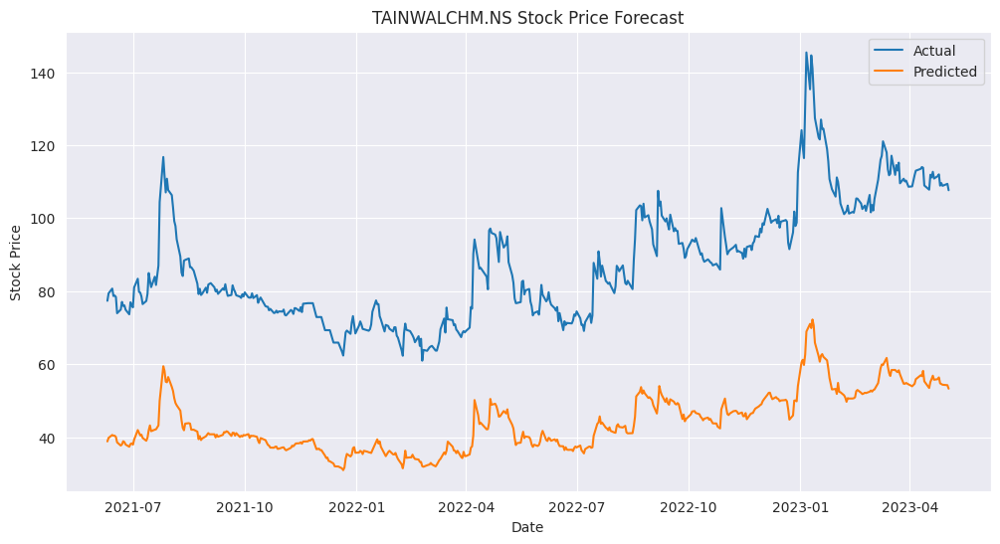

Forecasting HINDCON.NS in Chemicals sector
KNN RMSE: 0.2835068025934296
Epoch 1/50
11/11 [==============================] - 5s 4ms/step - loss: 0.1252
Epoch 2/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0666
Epoch 3/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0230
Epoch 4/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0130
Epoch 5/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0090
Epoch 6/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0054
Epoch 7/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 8/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 9/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 10/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 11/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 12/50
11/11 [==============================] - 0s 4

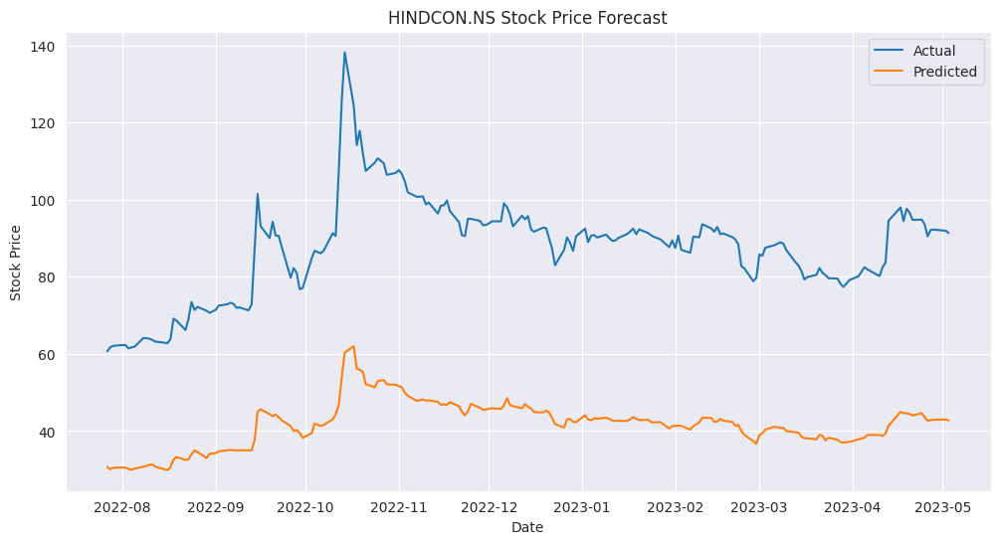

Forecasting ARVEE.NS in Chemicals sector
KNN RMSE: 0.1264587432169314
Epoch 1/50
7/7 [==============================] - 4s 4ms/step - loss: 0.1785
Epoch 2/50
7/7 [==============================] - 0s 4ms/step - loss: 0.1322
Epoch 3/50
7/7 [==============================] - 0s 4ms/step - loss: 0.0834
Epoch 4/50
7/7 [==============================] - 0s 4ms/step - loss: 0.0398
Epoch 5/50
7/7 [==============================] - 0s 4ms/step - loss: 0.0144
Epoch 6/50
7/7 [==============================] - 0s 4ms/step - loss: 0.0144
Epoch 7/50
7/7 [==============================] - 0s 4ms/step - loss: 0.0139
Epoch 8/50
7/7 [==============================] - 0s 4ms/step - loss: 0.0105
Epoch 9/50
7/7 [==============================] - 0s 4ms/step - loss: 0.0101
Epoch 10/50
7/7 [==============================] - 0s 4ms/step - loss: 0.0094
Epoch 11/50
7/7 [==============================] - 0s 4ms/step - loss: 0.0083
Epoch 12/50
7/7 [==============================] - 0s 4ms/step - loss: 0.0078
Epo

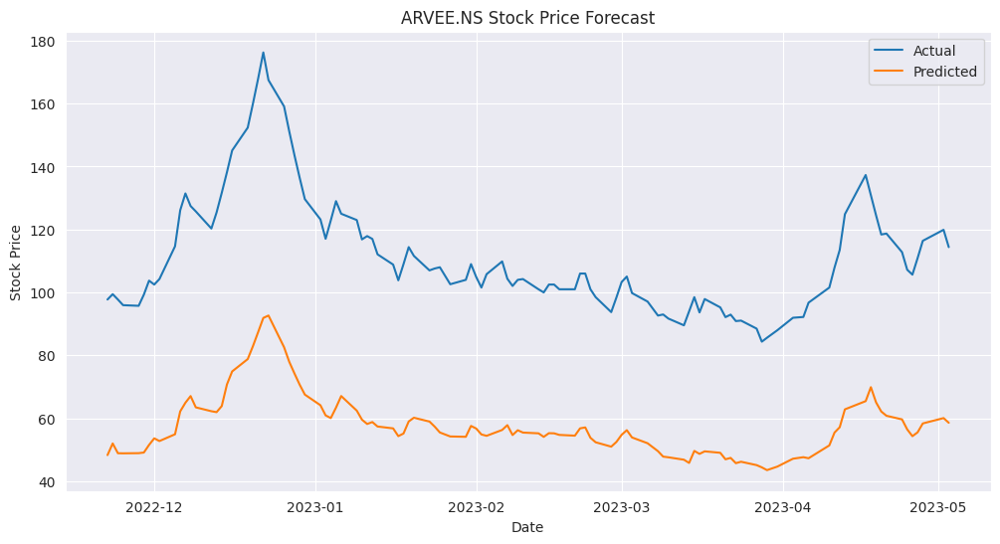

Forecasting AGROPHOS.NS in Chemicals sector
KNN RMSE: 0.031162565498429568
Epoch 1/50
15/15 [==============================] - 4s 4ms/step - loss: 0.0635
Epoch 2/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0239
Epoch 3/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0137
Epoch 4/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0072
Epoch 5/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 6/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 7/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 8/50
15/15 [==============================] - 0s 4ms/step - loss: 9.3510e-04
Epoch 9/50
15/15 [==============================] - 0s 4ms/step - loss: 6.8811e-04
Epoch 10/50
15/15 [==============================] - 0s 4ms/step - loss: 5.7764e-04
Epoch 11/50
15/15 [==============================] - 0s 4ms/step - loss: 5.1679e-04
Epoch 12/50
15/15 [===================

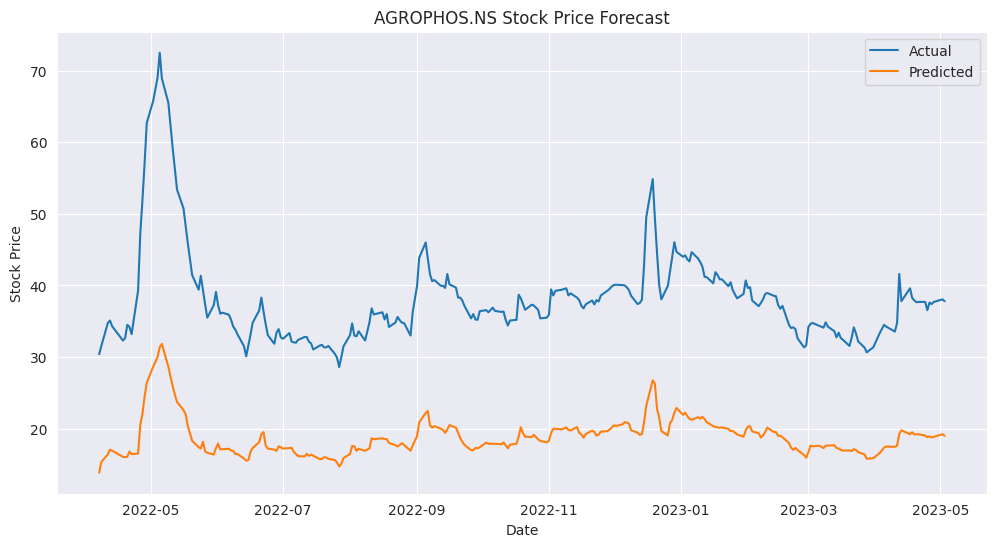

Forecasting SIKKO.NS in Chemicals sector
KNN RMSE: 0.9579636193620003
Epoch 1/50
14/14 [==============================] - 5s 4ms/step - loss: 0.0878
Epoch 2/50
14/14 [==============================] - 0s 4ms/step - loss: 0.0511
Epoch 3/50
14/14 [==============================] - 0s 4ms/step - loss: 0.0213
Epoch 4/50
14/14 [==============================] - 0s 4ms/step - loss: 0.0125
Epoch 5/50
14/14 [==============================] - 0s 4ms/step - loss: 0.0052
Epoch 6/50
14/14 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 7/50
14/14 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 8/50
14/14 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 9/50
14/14 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 10/50
14/14 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 11/50
14/14 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 12/50
14/14 [==============================] - 0s 4ms

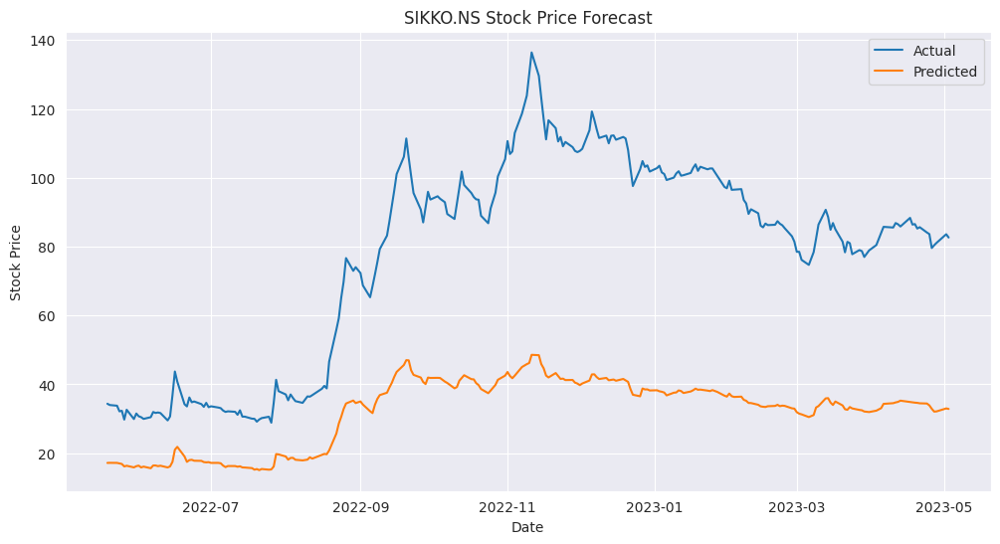

Forecasting IITL.NS in Investment Banking & Investment Services sector
KNN RMSE: 0.04506564485116067
Epoch 1/50
26/26 [==============================] - 4s 4ms/step - loss: 0.0393
Epoch 2/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0080
Epoch 3/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0048
Epoch 4/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 5/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 6/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 7/50
26/26 [==============================] - 0s 4ms/step - loss: 7.8376e-04
Epoch 8/50
26/26 [==============================] - 0s 4ms/step - loss: 6.7121e-04
Epoch 9/50
26/26 [==============================] - 0s 4ms/step - loss: 6.1272e-04
Epoch 10/50
26/26 [==============================] - 0s 4ms/step - loss: 5.6741e-04
Epoch 11/50
26/26 [==============================] - 0s 4ms/step - loss: 5.2557e-04
Epoch 12

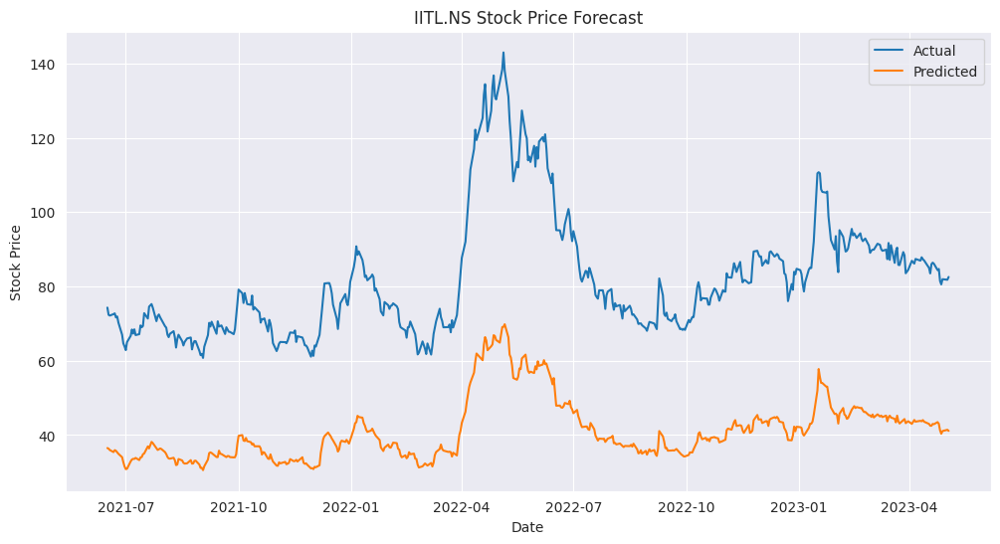

Forecasting 21STCENMGM.NS in Investment Banking & Investment Services sector
KNN RMSE: 0.03165442112728401
Epoch 1/50
13/13 [==============================] - 4s 5ms/step - loss: 0.0803
Epoch 2/50
13/13 [==============================] - 0s 5ms/step - loss: 0.0453
Epoch 3/50
13/13 [==============================] - 0s 5ms/step - loss: 0.0218
Epoch 4/50
13/13 [==============================] - 0s 5ms/step - loss: 0.0133
Epoch 5/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0066
Epoch 6/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 7/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 8/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 9/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 10/50
13/13 [==============================] - 0s 4ms/step - loss: 7.7661e-04
Epoch 11/50
13/13 [==============================] - 0s 4ms/step - loss: 6.7184e-04
Epoch 12/50
13

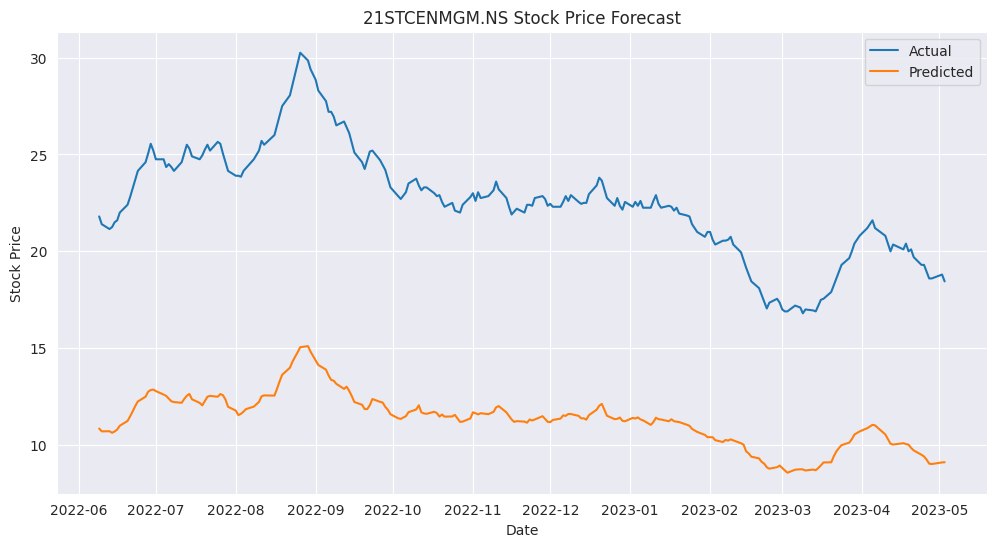

Forecasting DBSTOCKBRO.NS in Investment Banking & Investment Services sector
KNN RMSE: 0.056455279830604575
Epoch 1/50
25/25 [==============================] - 5s 4ms/step - loss: 0.0805
Epoch 2/50
25/25 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 3/50
25/25 [==============================] - 0s 4ms/step - loss: 0.0022
Epoch 4/50
25/25 [==============================] - 0s 4ms/step - loss: 3.0359e-04
Epoch 5/50
25/25 [==============================] - 0s 4ms/step - loss: 2.3289e-04
Epoch 6/50
25/25 [==============================] - 0s 4ms/step - loss: 2.0500e-04
Epoch 7/50
25/25 [==============================] - 0s 4ms/step - loss: 1.9114e-04
Epoch 8/50
25/25 [==============================] - 0s 4ms/step - loss: 1.7590e-04
Epoch 9/50
25/25 [==============================] - 0s 4ms/step - loss: 1.6132e-04
Epoch 10/50
25/25 [==============================] - 0s 4ms/step - loss: 1.5017e-04
Epoch 11/50
25/25 [==============================] - 0s 4ms/step - loss: 

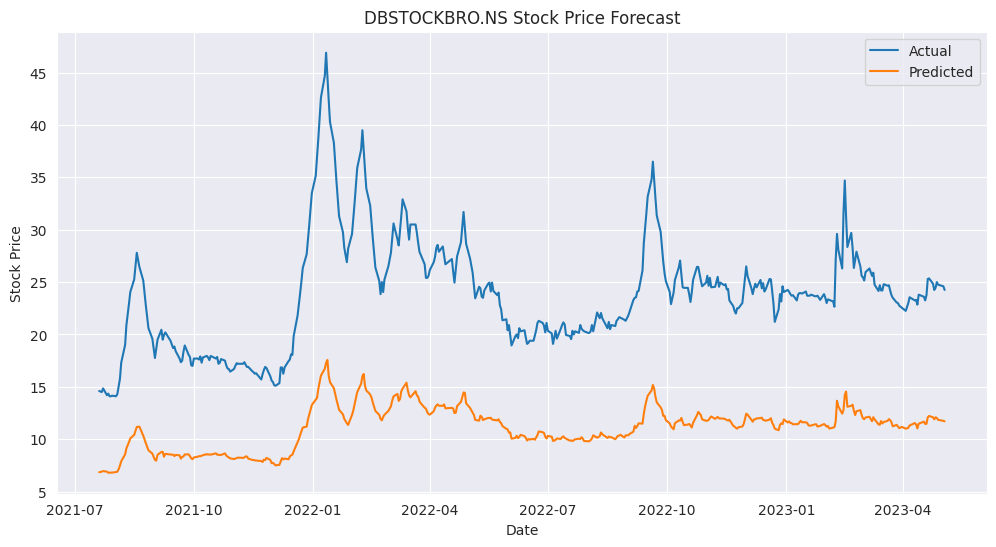

Forecasting HBSL.NS in Investment Banking & Investment Services sector
KNN RMSE: 0.017242438977835048
Epoch 1/50
26/26 [==============================] - 4s 4ms/step - loss: 0.0437
Epoch 2/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0152
Epoch 3/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 4/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 5/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 6/50
26/26 [==============================] - 0s 4ms/step - loss: 8.6616e-04
Epoch 7/50
26/26 [==============================] - 0s 4ms/step - loss: 5.3883e-04
Epoch 8/50
26/26 [==============================] - 0s 4ms/step - loss: 3.3461e-04
Epoch 9/50
26/26 [==============================] - 0s 4ms/step - loss: 2.3302e-04
Epoch 10/50
26/26 [==============================] - 0s 4ms/step - loss: 1.6920e-04
Epoch 11/50
26/26 [==============================] - 0s 4ms/step - loss: 1.3692e-04
Epo

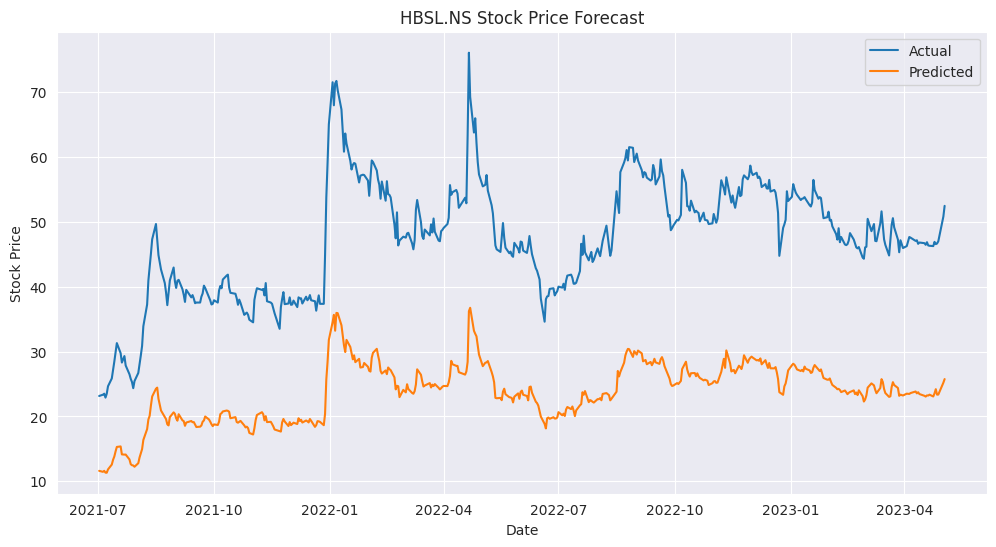

Forecasting INDBANK.NS in Investment Banking & Investment Services sector
KNN RMSE: 0.06272520979093278
Epoch 1/50
27/27 [==============================] - 4s 4ms/step - loss: 0.0487
Epoch 2/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0086
Epoch 3/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 4/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 5/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 6/50
27/27 [==============================] - 0s 4ms/step - loss: 7.8958e-04
Epoch 7/50
27/27 [==============================] - 0s 4ms/step - loss: 5.0901e-04
Epoch 8/50
27/27 [==============================] - 0s 4ms/step - loss: 3.7228e-04
Epoch 9/50
27/27 [==============================] - 0s 4ms/step - loss: 3.0634e-04
Epoch 10/50
27/27 [==============================] - 0s 4ms/step - loss: 2.5629e-04
Epoch 11/50
27/27 [==============================] - 0s 4ms/step - loss: 2.1875e-04
E

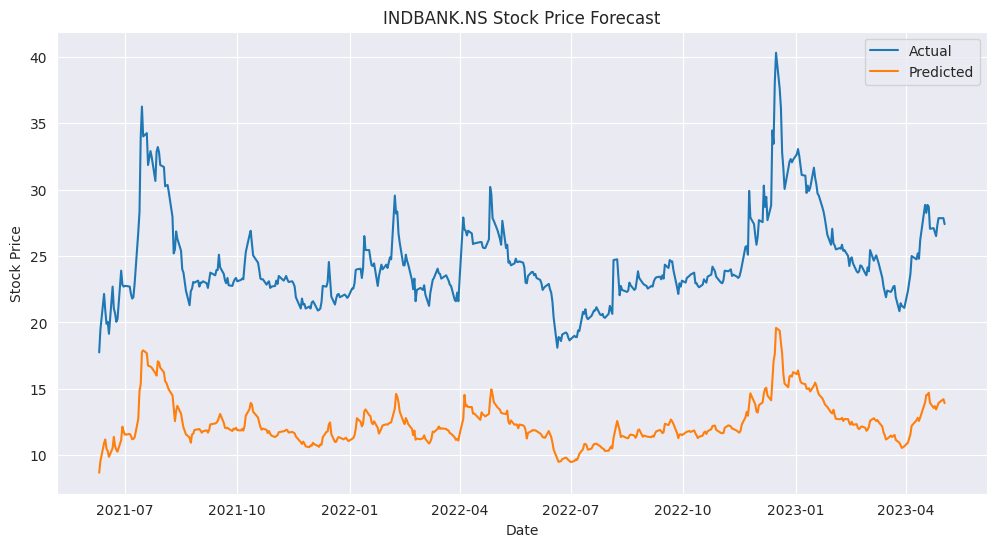

Forecasting AMJLAND.NS in Real Estate Operations sector
KNN RMSE: 0.04528427345631973
Epoch 1/50
27/27 [==============================] - 4s 5ms/step - loss: 0.0504
Epoch 2/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0078
Epoch 3/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0042
Epoch 4/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 5/50
27/27 [==============================] - 0s 4ms/step - loss: 9.3826e-04
Epoch 6/50
27/27 [==============================] - 0s 4ms/step - loss: 6.6873e-04
Epoch 7/50
27/27 [==============================] - 0s 4ms/step - loss: 5.3407e-04
Epoch 8/50
27/27 [==============================] - 0s 4ms/step - loss: 4.4397e-04
Epoch 9/50
27/27 [==============================] - 0s 4ms/step - loss: 3.7361e-04
Epoch 10/50
27/27 [==============================] - 0s 4ms/step - loss: 3.2598e-04
Epoch 11/50
27/27 [==============================] - 0s 4ms/step - loss: 2.8190e-04
Epoch 12/50
27/

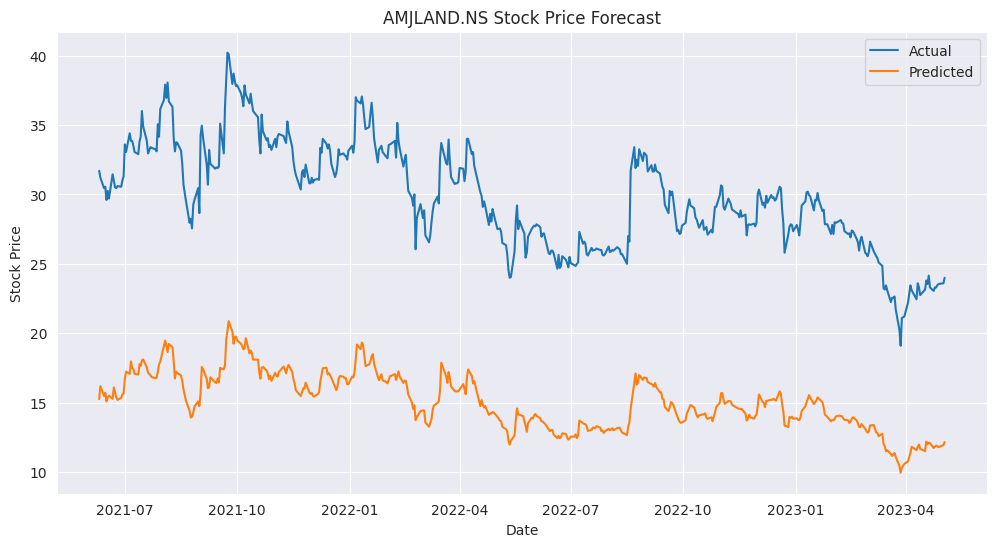

Forecasting PANSARI.NS in Real Estate Operations sector
KNN RMSE: 0.06070587361170988
Epoch 1/50
9/9 [==============================] - 3s 4ms/step - loss: 0.0774
Epoch 2/50
9/9 [==============================] - 0s 4ms/step - loss: 0.0553
Epoch 3/50
9/9 [==============================] - 0s 4ms/step - loss: 0.0338
Epoch 4/50
9/9 [==============================] - 0s 4ms/step - loss: 0.0192
Epoch 5/50
9/9 [==============================] - 0s 4ms/step - loss: 0.0150
Epoch 6/50
9/9 [==============================] - 0s 4ms/step - loss: 0.0098
Epoch 7/50
9/9 [==============================] - 0s 4ms/step - loss: 0.0058
Epoch 8/50
9/9 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 9/50
9/9 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 10/50
9/9 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 11/50
9/9 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 12/50
9/9 [==============================] - 0s 4ms/step - 

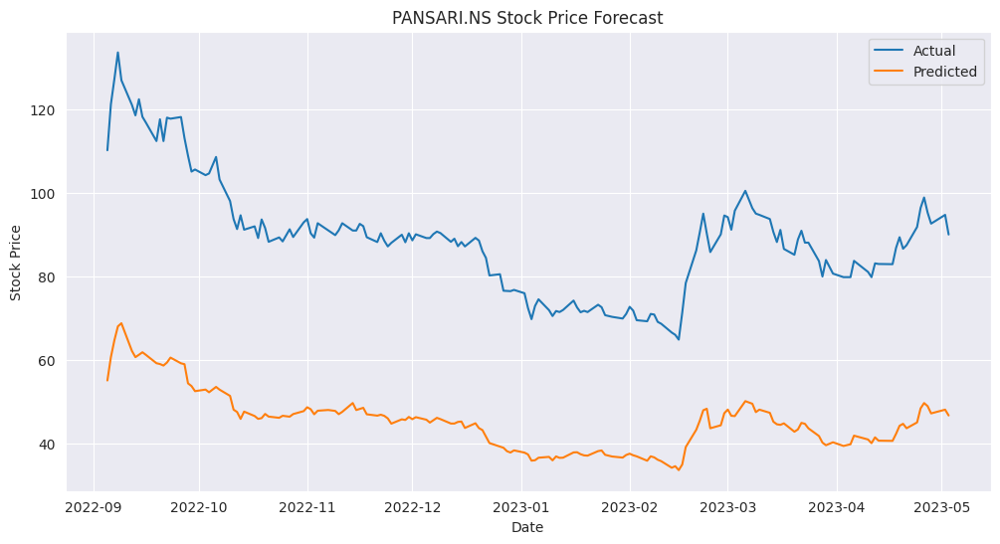

Forecasting GEECEE.NS in Real Estate Operations sector
KNN RMSE: 0.029901295673900232
Epoch 1/50
27/27 [==============================] - 4s 4ms/step - loss: 0.1262
Epoch 2/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0123
Epoch 3/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0056
Epoch 4/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0035
Epoch 5/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 6/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 7/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0016
Epoch 8/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 9/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 10/50
27/27 [==============================] - 0s 4ms/step - loss: 9.6628e-04
Epoch 11/50
27/27 [==============================] - 0s 4ms/step - loss: 8.4578e-04
Epoch 12/50
27/27 [================

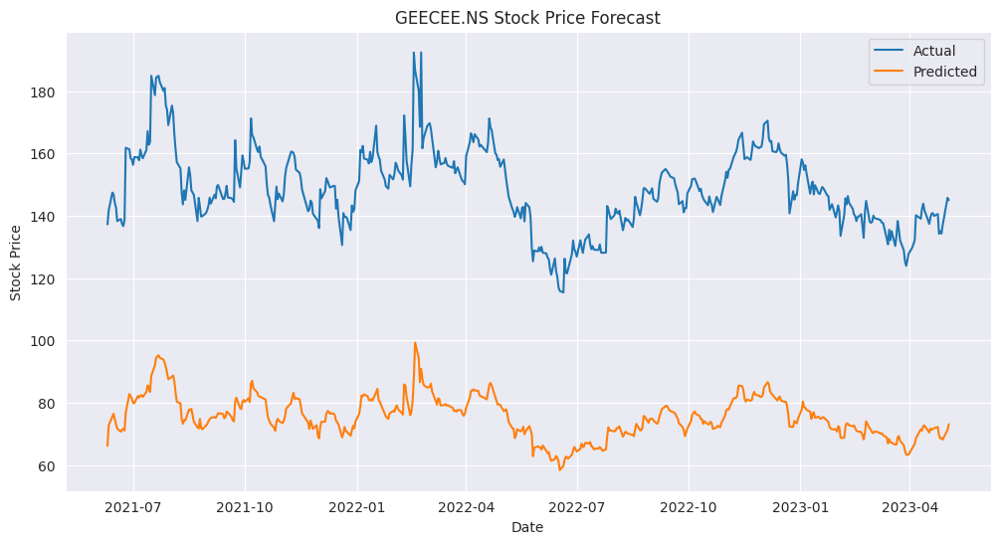

Forecasting SUMIT.NS in Real Estate Operations sector
KNN RMSE: 0.47729458088961607
Epoch 1/50
11/11 [==============================] - 4s 5ms/step - loss: 0.1274
Epoch 2/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0725
Epoch 3/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0264
Epoch 4/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0135
Epoch 5/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0119
Epoch 6/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0084
Epoch 7/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0067
Epoch 8/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0054
Epoch 9/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 10/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 11/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 12/50
11/11 [==========================

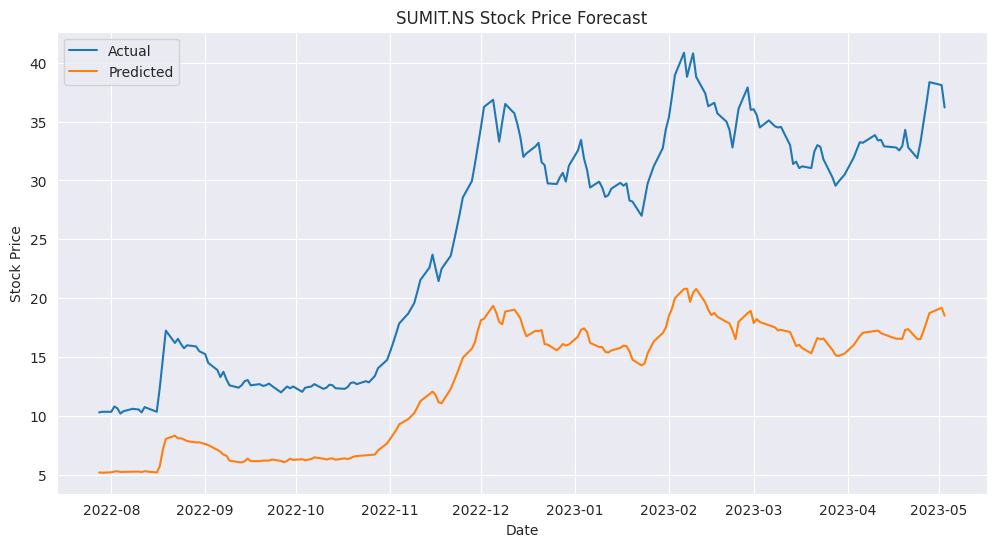

Forecasting SHRADHA.NS in Real Estate Operations sector
KNN RMSE: 0.34856861386031057
Epoch 1/50
12/12 [==============================] - 5s 5ms/step - loss: 0.2485
Epoch 2/50
12/12 [==============================] - 0s 4ms/step - loss: 0.1533
Epoch 3/50
12/12 [==============================] - 0s 4ms/step - loss: 0.0550
Epoch 4/50
12/12 [==============================] - 0s 4ms/step - loss: 0.0169
Epoch 5/50
12/12 [==============================] - 0s 4ms/step - loss: 0.0152
Epoch 6/50
12/12 [==============================] - 0s 4ms/step - loss: 0.0126
Epoch 7/50
12/12 [==============================] - 0s 4ms/step - loss: 0.0109
Epoch 8/50
12/12 [==============================] - 0s 4ms/step - loss: 0.0097
Epoch 9/50
12/12 [==============================] - 0s 4ms/step - loss: 0.0086
Epoch 10/50
12/12 [==============================] - 0s 4ms/step - loss: 0.0075
Epoch 11/50
12/12 [==============================] - 0s 4ms/step - loss: 0.0065
Epoch 12/50
12/12 [========================

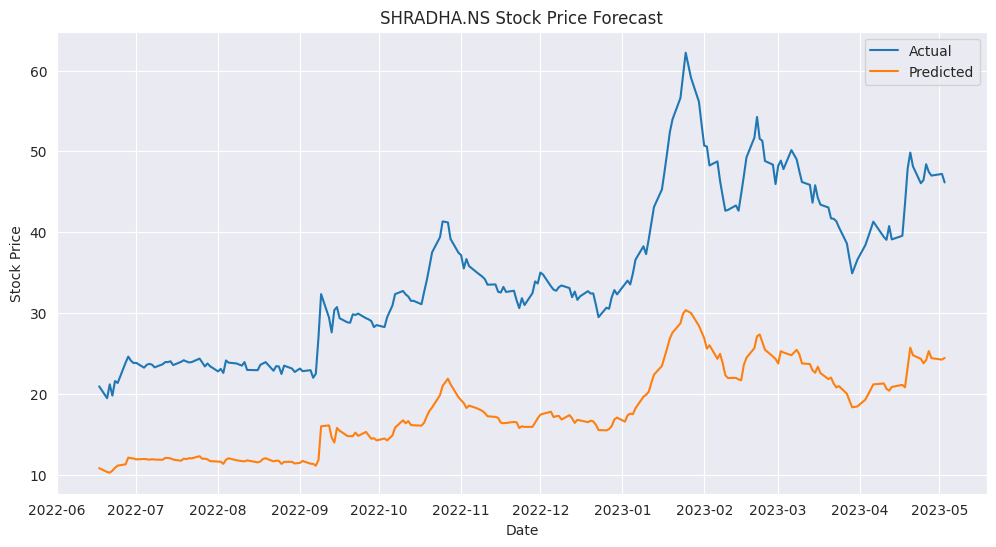

Forecasting SILLYMONKS.NS in Media & Publishing sector
KNN RMSE: 0.0505693061995025
Epoch 1/50
13/13 [==============================] - 4s 5ms/step - loss: 0.1311
Epoch 2/50
13/13 [==============================] - 0s 5ms/step - loss: 0.0662
Epoch 3/50
13/13 [==============================] - 0s 5ms/step - loss: 0.0158
Epoch 4/50
13/13 [==============================] - 0s 5ms/step - loss: 0.0105
Epoch 5/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0072
Epoch 6/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0059
Epoch 7/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0048
Epoch 8/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 9/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 10/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 11/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0021
Epoch 12/50
13/13 [==========================

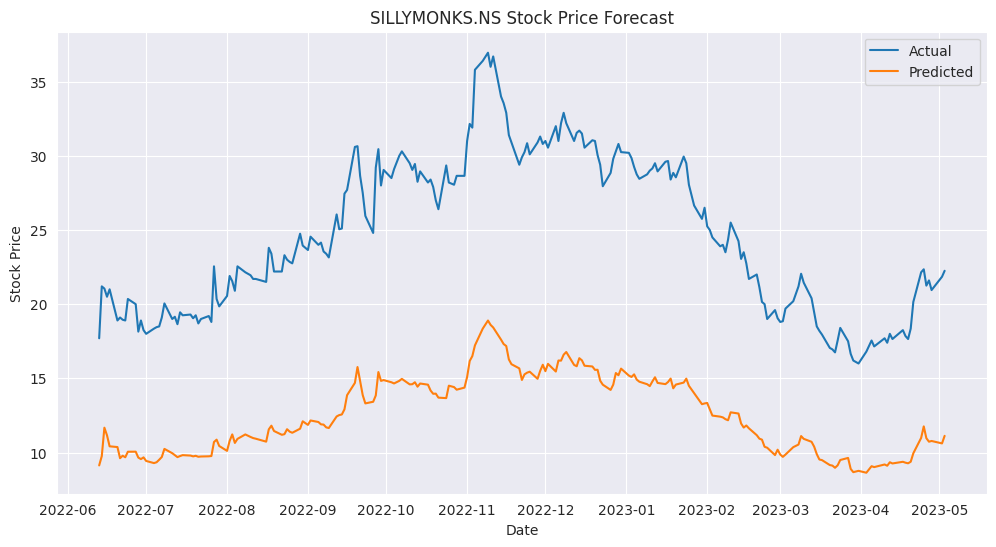

Forecasting PNC.NS in Media & Publishing sector
KNN RMSE: 0.13135587596963197
Epoch 1/50
27/27 [==============================] - 4s 4ms/step - loss: 0.0241
Epoch 2/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0064
Epoch 3/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0027
Epoch 4/50
27/27 [==============================] - 0s 4ms/step - loss: 7.9995e-04
Epoch 5/50
27/27 [==============================] - 0s 4ms/step - loss: 4.9738e-04
Epoch 6/50
27/27 [==============================] - 0s 4ms/step - loss: 4.0637e-04
Epoch 7/50
27/27 [==============================] - 0s 4ms/step - loss: 3.5904e-04
Epoch 8/50
27/27 [==============================] - 0s 4ms/step - loss: 3.2971e-04
Epoch 9/50
27/27 [==============================] - 0s 4ms/step - loss: 2.9622e-04
Epoch 10/50
27/27 [==============================] - 0s 4ms/step - loss: 2.6972e-04
Epoch 11/50
27/27 [==============================] - 0s 4ms/step - loss: 2.4599e-04
Epoch 12/50
27/27 [

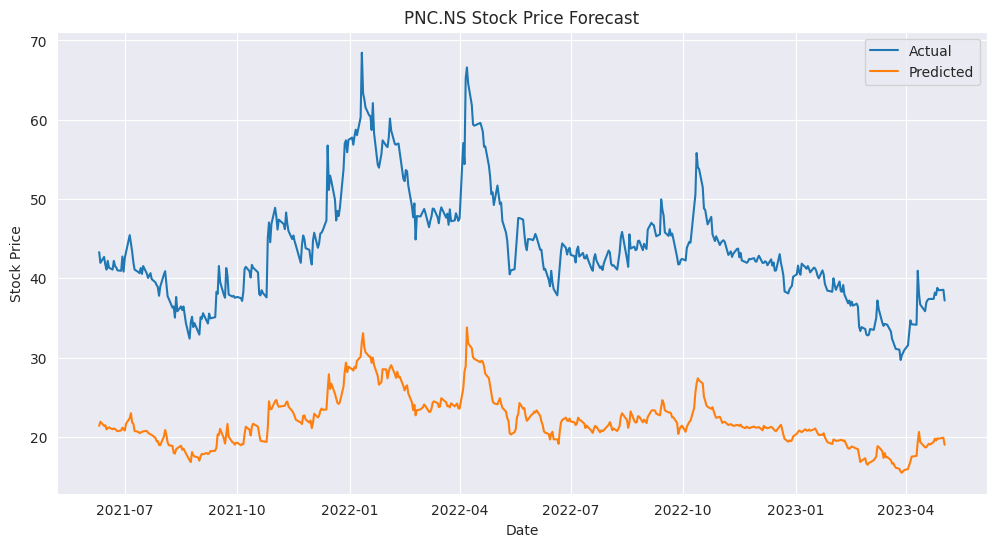

Forecasting PRESSMN.NS in Media & Publishing sector
KNN RMSE: 0.030110103110624786
Epoch 1/50
26/26 [==============================] - 5s 4ms/step - loss: 0.1007
Epoch 2/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0135
Epoch 3/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0052
Epoch 4/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 5/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 6/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 7/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 8/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 9/50
26/26 [==============================] - 0s 4ms/step - loss: 8.6909e-04
Epoch 10/50
26/26 [==============================] - 0s 4ms/step - loss: 7.1193e-04
Epoch 11/50
26/26 [==============================] - 0s 4ms/step - loss: 5.9958e-04
Epoch 12/50
26/26 [===============

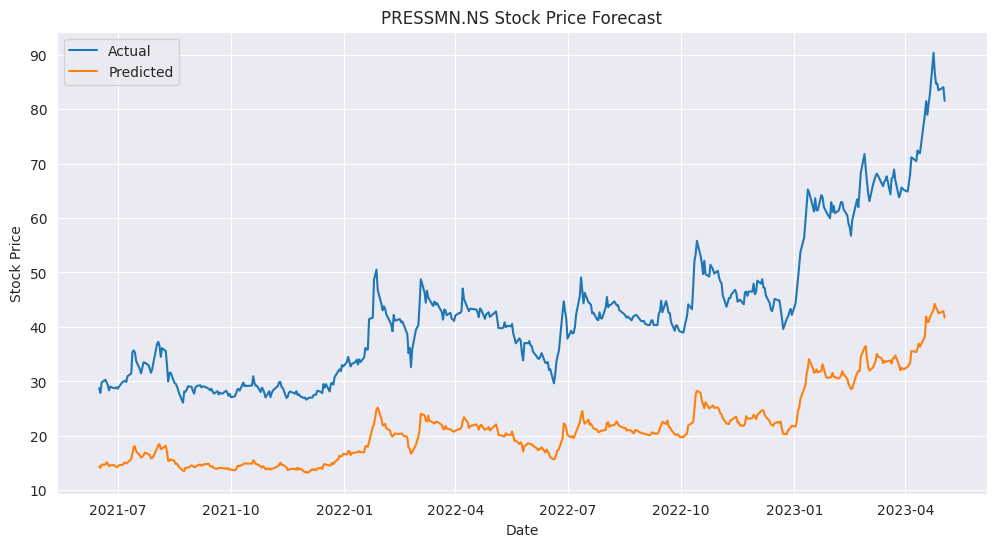

Forecasting DEN.NS in Media & Publishing sector
KNN RMSE: 0.020629984982768707
Epoch 1/50
27/27 [==============================] - 4s 5ms/step - loss: 0.0804
Epoch 2/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0078
Epoch 3/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 4/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 5/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 6/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 7/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 8/50
27/27 [==============================] - 0s 4ms/step - loss: 9.0638e-04
Epoch 9/50
27/27 [==============================] - 0s 4ms/step - loss: 8.0886e-04
Epoch 10/50
27/27 [==============================] - 0s 4ms/step - loss: 7.1103e-04
Epoch 11/50
27/27 [==============================] - 0s 4ms/step - loss: 6.2628e-04
Epoch 12/50
27/27 [===============

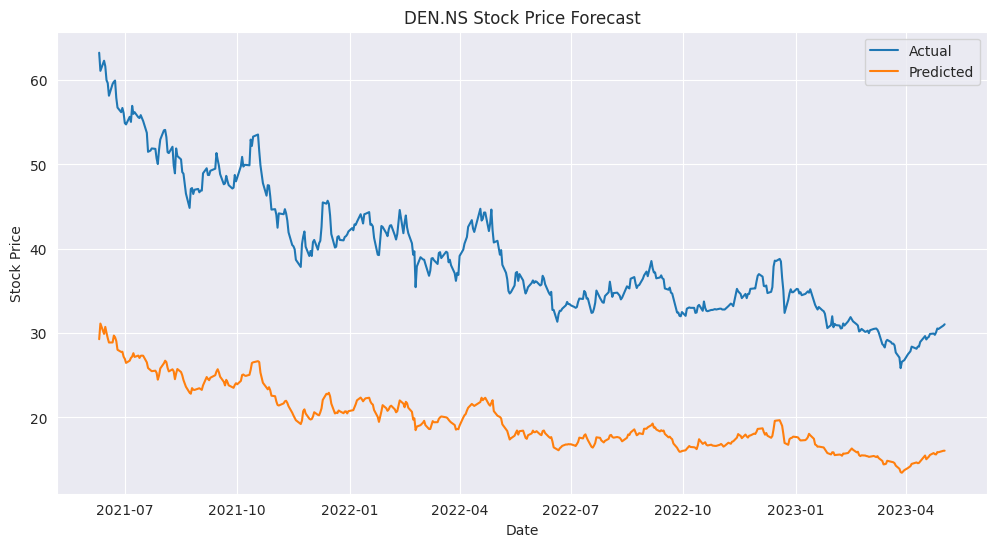

Forecasting VERTOZ.NS in Media & Publishing sector
KNN RMSE: 0.06149360088887733
Epoch 1/50
13/13 [==============================] - 4s 5ms/step - loss: 0.1040
Epoch 2/50
13/13 [==============================] - 0s 5ms/step - loss: 0.0511
Epoch 3/50
13/13 [==============================] - 0s 5ms/step - loss: 0.0153
Epoch 4/50
13/13 [==============================] - 0s 5ms/step - loss: 0.0107
Epoch 5/50
13/13 [==============================] - 0s 5ms/step - loss: 0.0065
Epoch 6/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 7/50
13/13 [==============================] - 0s 5ms/step - loss: 0.0031
Epoch 8/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 9/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 10/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 11/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 12/50
13/13 [=============================

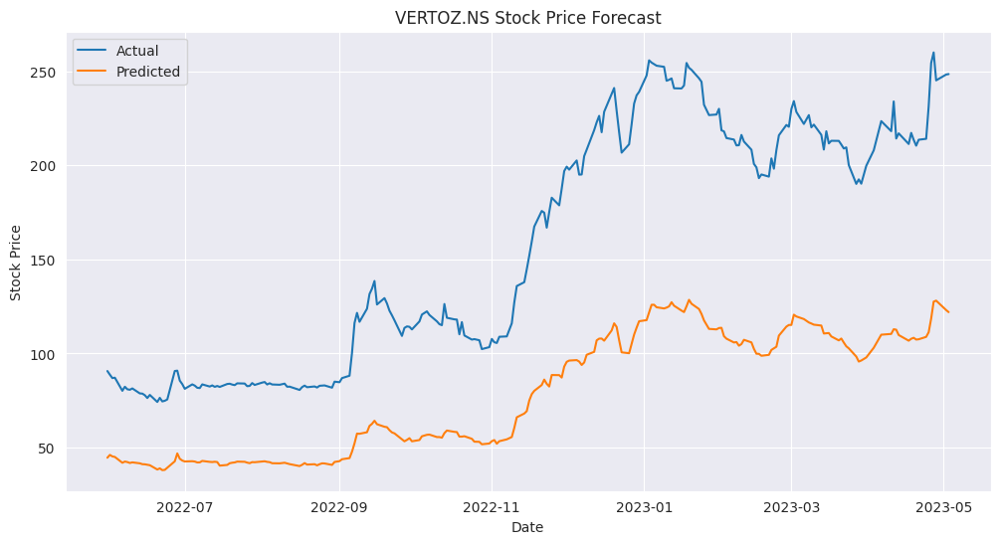

Forecasting COUNCODOS.NS in Construction & Engineering sector
KNN RMSE: 0.0388991052230609
Epoch 1/50
27/27 [==============================] - 5s 4ms/step - loss: 0.0431
Epoch 2/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0077
Epoch 3/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 4/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 5/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 6/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0010
Epoch 7/50
27/27 [==============================] - 0s 4ms/step - loss: 7.3993e-04
Epoch 8/50
27/27 [==============================] - 0s 4ms/step - loss: 6.2689e-04
Epoch 9/50
27/27 [==============================] - 0s 4ms/step - loss: 5.7730e-04
Epoch 10/50
27/27 [==============================] - 0s 4ms/step - loss: 5.0322e-04
Epoch 11/50
27/27 [==============================] - 0s 4ms/step - loss: 4.5314e-04
Epoch 12/50
27/27 

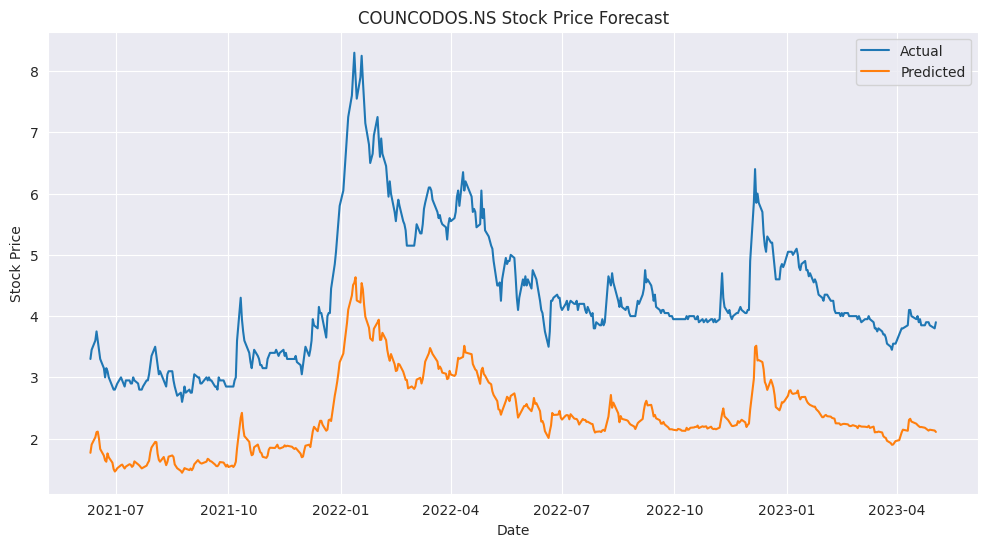

Forecasting SETUINFRA.NS in Construction & Engineering sector
KNN RMSE: 0.012856042054034513
Epoch 1/50
27/27 [==============================] - 4s 5ms/step - loss: 0.0316
Epoch 2/50
27/27 [==============================] - 0s 5ms/step - loss: 0.0123
Epoch 3/50
27/27 [==============================] - 0s 5ms/step - loss: 0.0046
Epoch 4/50
27/27 [==============================] - 0s 5ms/step - loss: 0.0015
Epoch 5/50
27/27 [==============================] - 0s 5ms/step - loss: 8.8899e-04
Epoch 6/50
27/27 [==============================] - 0s 4ms/step - loss: 5.5182e-04
Epoch 7/50
27/27 [==============================] - 0s 4ms/step - loss: 4.0645e-04
Epoch 8/50
27/27 [==============================] - 0s 4ms/step - loss: 3.1683e-04
Epoch 9/50
27/27 [==============================] - 0s 4ms/step - loss: 2.5662e-04
Epoch 10/50
27/27 [==============================] - 0s 4ms/step - loss: 2.0309e-04
Epoch 11/50
27/27 [==============================] - 0s 4ms/step - loss: 1.6704e-04
Epoch 12

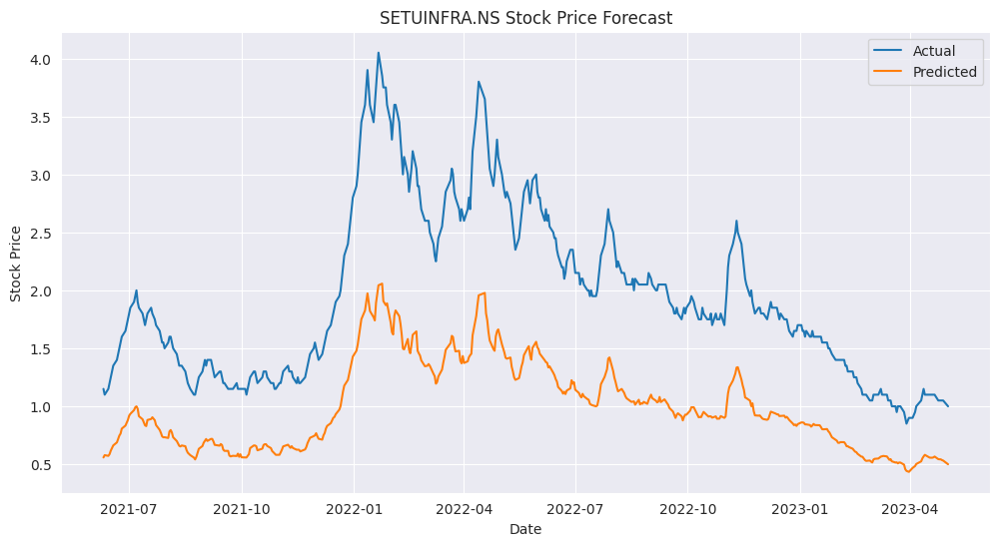

Forecasting HECPROJECT.NS in Construction & Engineering sector
KNN RMSE: 0.048386883646416
Epoch 1/50
8/8 [==============================] - 4s 5ms/step - loss: 0.2678
Epoch 2/50
8/8 [==============================] - 0s 5ms/step - loss: 0.2096
Epoch 3/50
8/8 [==============================] - 0s 5ms/step - loss: 0.1424
Epoch 4/50
8/8 [==============================] - 0s 4ms/step - loss: 0.0741
Epoch 5/50
8/8 [==============================] - 0s 5ms/step - loss: 0.0251
Epoch 6/50
8/8 [==============================] - 0s 5ms/step - loss: 0.0215
Epoch 7/50
8/8 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 8/50
8/8 [==============================] - 0s 4ms/step - loss: 0.0143
Epoch 9/50
8/8 [==============================] - 0s 5ms/step - loss: 0.0133
Epoch 10/50
8/8 [==============================] - 0s 4ms/step - loss: 0.0111
Epoch 11/50
8/8 [==============================] - 0s 5ms/step - loss: 0.0096
Epoch 12/50
8/8 [==============================] - 0s 5ms/st

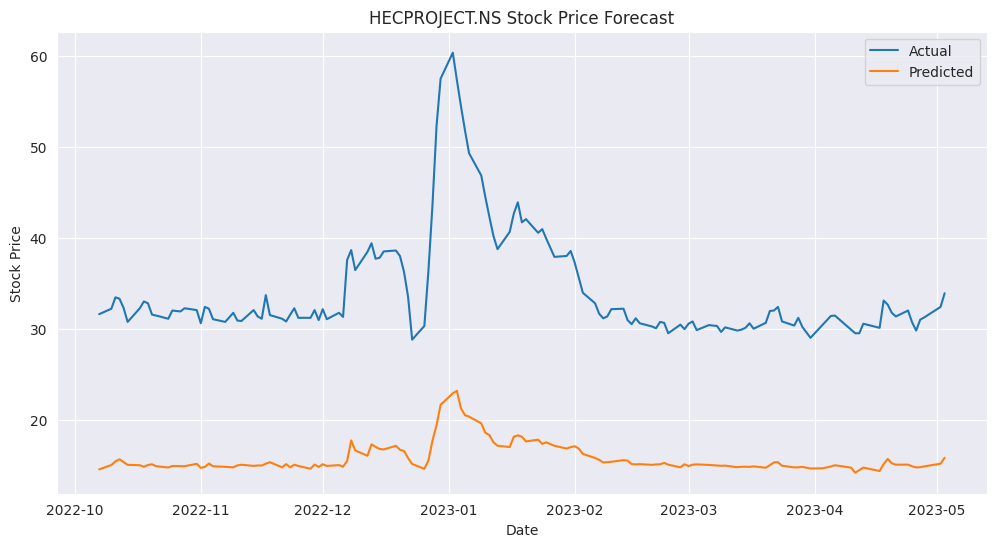

Forecasting CORALFINAC.NS in Construction & Engineering sector
KNN RMSE: 0.07662700021258471
Epoch 1/50
15/15 [==============================] - 4s 4ms/step - loss: 0.1389
Epoch 2/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0569
Epoch 3/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0161
Epoch 4/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0115
Epoch 5/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0073
Epoch 6/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0048
Epoch 7/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 8/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 9/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0019
Epoch 10/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 11/50
15/15 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 12/50
15/15 [=================

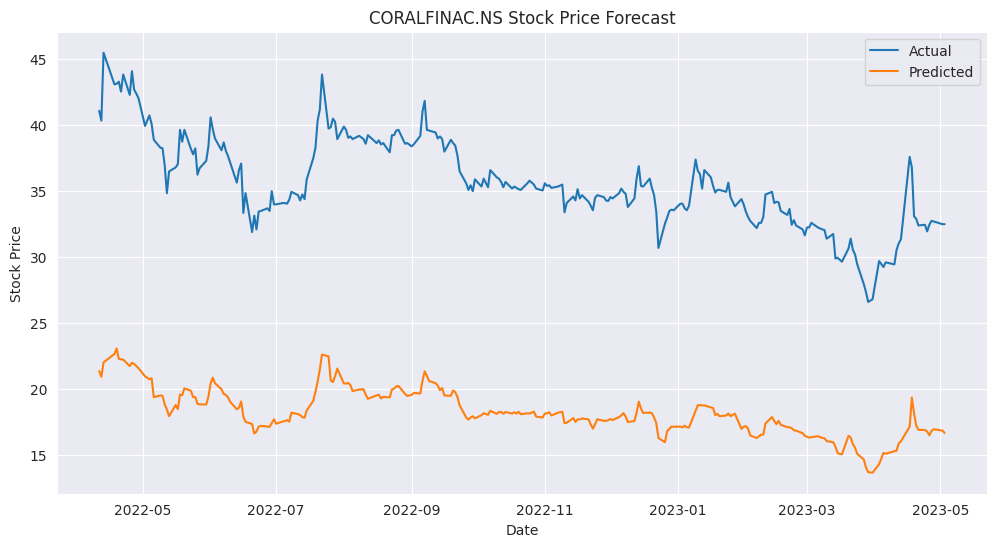

Forecasting UNIVASTU.NS in Construction & Engineering sector
KNN RMSE: 0.09046870548695375
Epoch 1/50
11/11 [==============================] - 4s 5ms/step - loss: 0.1009
Epoch 2/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0558
Epoch 3/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0202
Epoch 4/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0111
Epoch 5/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0081
Epoch 6/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0053
Epoch 7/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 8/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 9/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 10/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 11/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 12/50
11/11 [===================

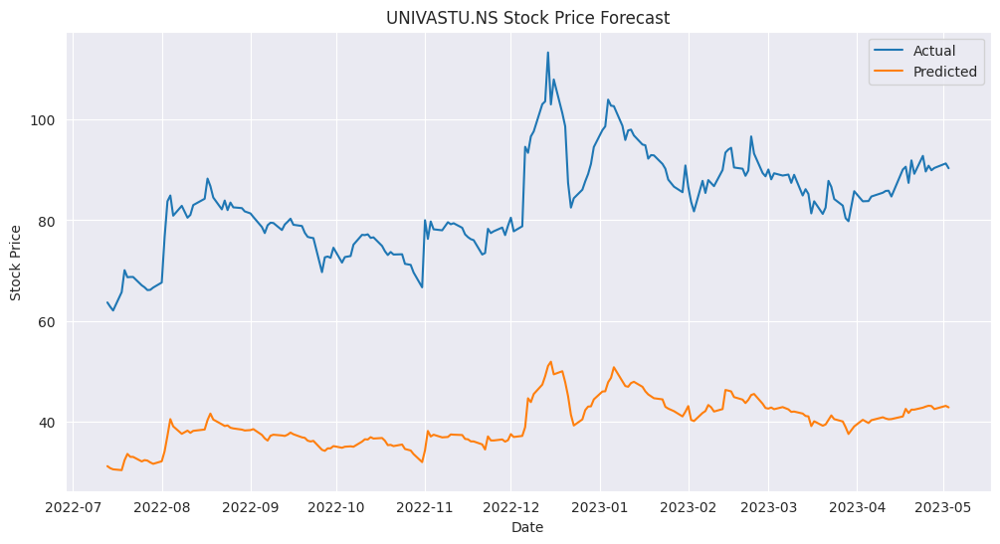

Forecasting AAKASH.NS in Oil & Gas Related Equipment and Services sector
KNN RMSE: 0.09582339619923975
Epoch 1/50
11/11 [==============================] - 4s 5ms/step - loss: 0.1594
Epoch 2/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0966
Epoch 3/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0357
Epoch 4/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0160
Epoch 5/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0121
Epoch 6/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0076
Epoch 7/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0051
Epoch 8/50
11/11 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 9/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 10/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 11/50
11/11 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 12/50
11/11 [=======

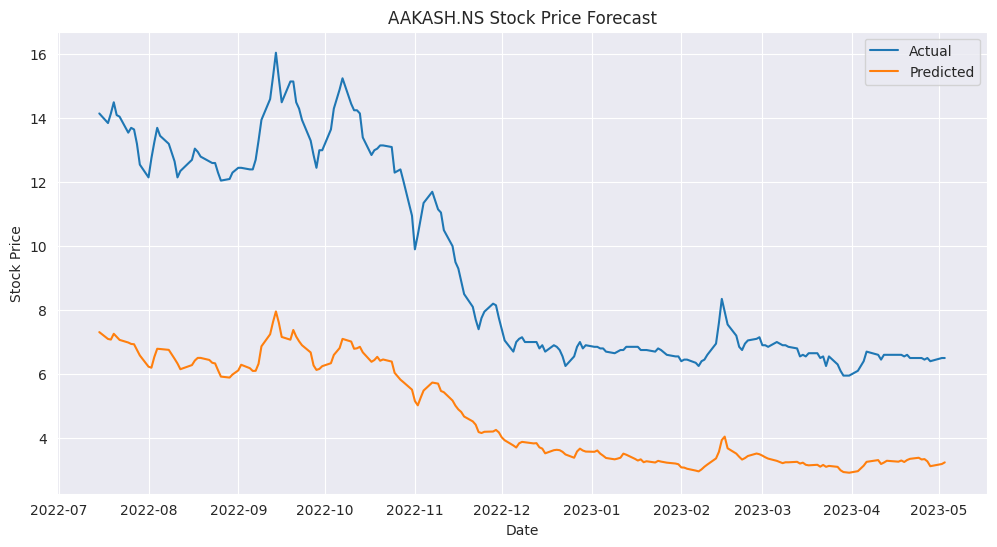

Forecasting GLOBALVECT.NS in Oil & Gas Related Equipment and Services sector
KNN RMSE: 0.013197523288809713
Epoch 1/50
26/26 [==============================] - 3s 4ms/step - loss: 0.0965
Epoch 2/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0099
Epoch 3/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 4/50
26/26 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 5/50
26/26 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 6/50
26/26 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 7/50
26/26 [==============================] - 0s 3ms/step - loss: 0.0012
Epoch 8/50
26/26 [==============================] - 0s 3ms/step - loss: 9.6133e-04
Epoch 9/50
26/26 [==============================] - 0s 3ms/step - loss: 7.4244e-04
Epoch 10/50
26/26 [==============================] - 0s 3ms/step - loss: 6.1199e-04
Epoch 11/50
26/26 [==============================] - 0s 3ms/step - loss: 5.0193e-04
Epoch

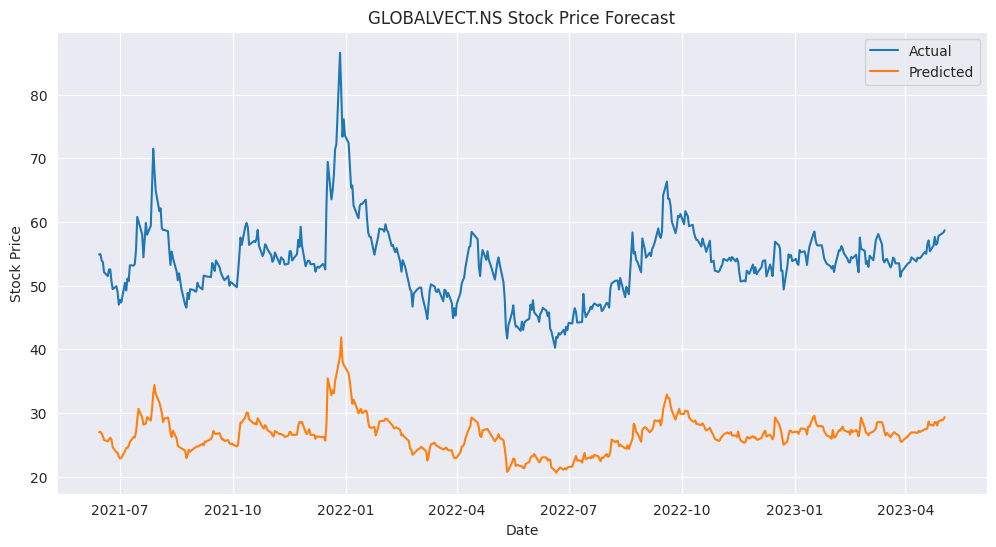

Forecasting JINDRILL.NS in Oil & Gas Related Equipment and Services sector
KNN RMSE: 0.08188112781014958
Epoch 1/50
27/27 [==============================] - 5s 4ms/step - loss: 0.1159
Epoch 2/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0095
Epoch 3/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0045
Epoch 4/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 5/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0023
Epoch 6/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0018
Epoch 7/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 8/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0013
Epoch 9/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0011
Epoch 10/50
27/27 [==============================] - 0s 4ms/step - loss: 9.6099e-04
Epoch 11/50
27/27 [==============================] - 0s 4ms/step - loss: 8.2996e-04
Epoch 12/50
27/2

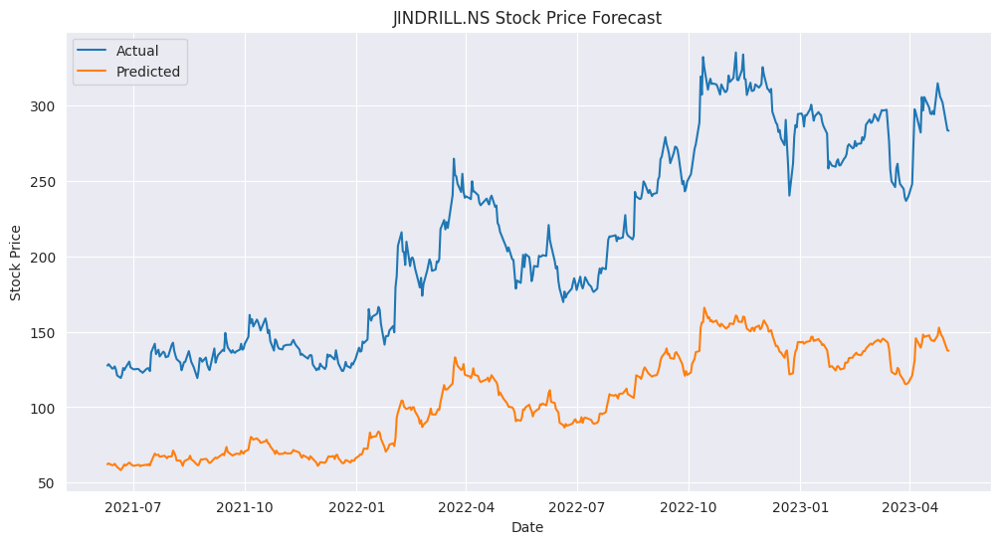

Forecasting MANINDS.NS in Oil & Gas Related Equipment and Services sector
KNN RMSE: 0.03972944387266943
Epoch 1/50
27/27 [==============================] - 4s 4ms/step - loss: 0.0764
Epoch 2/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0090
Epoch 3/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0043
Epoch 4/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0024
Epoch 5/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 6/50
27/27 [==============================] - 0s 4ms/step - loss: 0.0012
Epoch 7/50
27/27 [==============================] - 0s 4ms/step - loss: 8.8895e-04
Epoch 8/50
27/27 [==============================] - 0s 4ms/step - loss: 6.9760e-04
Epoch 9/50
27/27 [==============================] - 0s 4ms/step - loss: 6.0870e-04
Epoch 10/50
27/27 [==============================] - 0s 4ms/step - loss: 5.3750e-04
Epoch 11/50
27/27 [==============================] - 0s 4ms/step - loss: 4.8000e-04
Epoch

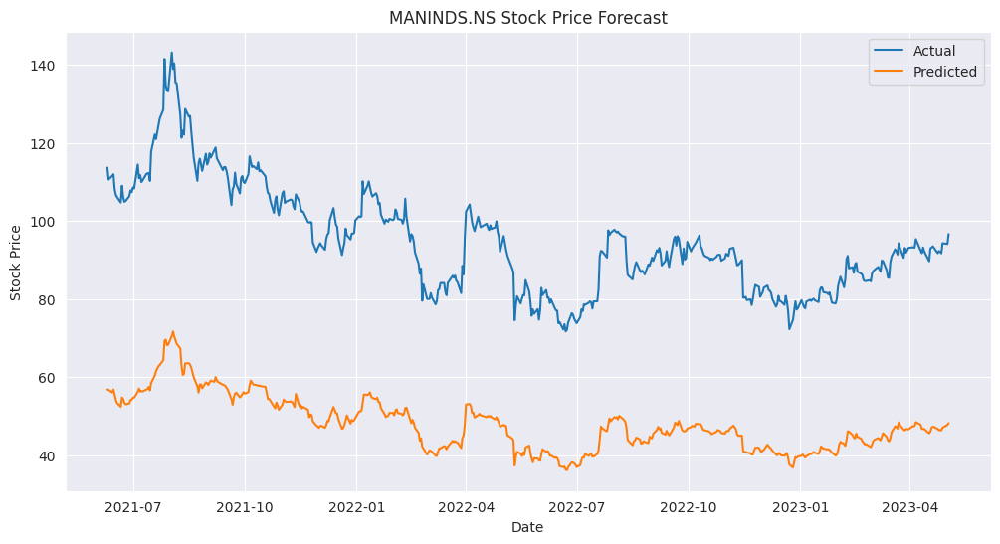

Forecasting SEAMECLTD.NS in Oil & Gas Related Equipment and Services sector
KNN RMSE: 1.07846823940239
Epoch 1/50


KeyboardInterrupt: ignored

In [ ]:
#KNN + LSTM

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.ensemble import StackingRegressor
from keras.layers import Dropout
from sklearn.neighbors import KNeighborsRegressor
import matplotlib.dates as mdates
import xgboost as xgb
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import Callback
import matplotlib.pyplot as plt

# Function to reshape data for LSTM
def reshape_data(data):
    return np.reshape(data, (data.shape[0], 1, data.shape[1]))

# Function to compute RSI
def compute_RSI(data, window=14):
    delta = data.diff()
    gain = delta.where(delta > 0, 0)
    loss = -delta.where(delta < 0, 0)
    avg_gain = gain.rolling(window=window).mean()
    avg_loss = loss.rolling(window=window).mean()
    RS = avg_gain / avg_loss
    RSI = 100.0 - (100.0 / (1.0 + RS))
    return RSI

for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')
        
        # get data for the stock
        stock_data = df_historical_data.loc[df_historical_data['ticker'] == stock]
        stock_data = stock_data.drop(['ticker', 'volume', 'adjclose'], axis=1)
        stock_data['MA50'] = stock_data['close'].rolling(window=50).mean()
        stock_data['MA200'] = stock_data['close'].rolling(window=200).mean()
        stock_data['RSI'] = compute_RSI(stock_data['close'])
        stock_data['Bollinger_upper'] = stock_data['MA50'] + 2 * stock_data['close'].rolling(window=50).std()
        stock_data['Bollinger_lower'] = stock_data['MA50'] - 2 * stock_data['close'].rolling(window=50).std()
        stock_data = stock_data.dropna()
        stock_data = stock_data.drop(['Sector'], axis=1) # drop sector column
        
        # split data into train and test sets
        X = stock_data.drop(['close'], axis=1)
        y = stock_data['close']
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
        
        # scale data using MinMaxScaler
        scaler = MinMaxScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        y_train_scaled = scaler.fit_transform(y_train.values.reshape(-1,1))
        y_test_scaled = scaler.transform(y_test.values.reshape(-1,1))


        # train KNN model
        knn = KNeighborsRegressor(n_neighbors=5)
        knn.fit(X_train_scaled, y_train_scaled)
        y_pred_knn = knn.predict(X_test_scaled)
        mse_knn = mean_squared_error(y_test_scaled, y_pred_knn)
        rmse_knn = np.sqrt(mse_knn)
        print(f'KNN RMSE: {rmse_knn}')
                
        # train LSTM model
        X_train_lstm = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
        X_test_lstm = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

        lstm = Sequential()
        lstm.add(LSTM(units=50, return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])))
        lstm.add(LSTM(units=50))
        lstm.add(Dense(units=1))
        lstm.compile(loss='mean_squared_error', optimizer='adam')
        lstm.fit(X_train_lstm, y_train_scaled, epochs=50, batch_size=72, verbose=1)
        y_pred_lstm = lstm.predict(X_test_lstm)
        y_pred_lstm = scaler.inverse_transform(y_pred_lstm)
        y_test = scaler.inverse_transform(y_test_scaled)
        mse_lstm = mean_squared_error(y_test, y_pred_lstm)
        rmse_lstm = np.sqrt(mse_lstm)
        print(f'LSTM RMSE: {rmse_lstm}')
        
        y_pred_ensemble = (0.5 * y_pred_knn) + (0.5 * y_pred_lstm)
        mse_ensemble = mean_squared_error(y_test_scaled, y_pred_ensemble)
        rmse_ensemble = np.sqrt(mse_ensemble)
        print(f'Ensemble RMSE: {rmse_ensemble}')


        # plot actual and predicted prices
        plt.figure(figsize=(12,6))
        plt.plot(X_test.index, y_test, label='Actual')
        plt.plot(X_test.index, y_pred_ensemble, label='Predicted')
        plt.legend()
        plt.title(f'{stock} Stock Price Forecast')
        plt.xlabel('Date')
        plt.ylabel('Stock Price')
        plt.show()


In [ ]:
# Random Forest+ XG-Boost +LSTM

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from keras.models import Sequential
from keras.layers import Dense, LSTM
import tensorflow as tf

# Define a function to preprocess the data
def preprocess_stock_data(stock):
    # get data for the stock
    stock_data = df_historical_data.loc[df_historical_data['ticker'] == stock]
    stock_data = stock_data.drop(['ticker', 'volume', 'adjclose'], axis=1)
    stock_data['MA50'] = stock_data['close'].rolling(window=50).mean()
    stock_data['MA200'] = stock_data['close'].rolling(window=200).mean()
    stock_data['RSI'] = compute_RSI(stock_data['close'])
    stock_data['Bollinger_upper'] = stock_data['MA50'] + 2 * stock_data['close'].rolling(window=50).std()
    stock_data['Bollinger_lower'] = stock_data['MA50'] - 2 * stock_data['close'].rolling(window=50).std()
    stock_data = stock_data.dropna()
    stock_data = stock_data.drop(['Sector'], axis=1) # drop sector column
        
    # split data into train and test sets
    X = stock_data.drop(['close'], axis=1)
    y = stock_data['close']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    return X_train, X_test, y_train, y_test

# Define a list of models to use for ensemble learning
models = [RandomForestRegressor(n_estimators=100, random_state=0),
          GradientBoostingRegressor(n_estimators=100, random_state=0),
          Sequential([LSTM(128, input_shape=(X_train.shape[1], 1)), Dense(1)])]

# Loop through all selected stocks and preprocess the data for each stock
for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')
        
        X_train, X_test, y_train, y_test = preprocess_stock_data(stock)
        
        # Loop through all models, train them, and make predictions
        predictions = []
        for model in models:
            if isinstance(model, Sequential):
                X_train = np.reshape(X_train.values, (X_train.shape[0], X_train.shape[1], 1))
                X_test = np.reshape(X_test.values, (X_test.shape[0], X_test.shape[1], 1))
                model.compile(loss='mse', optimizer='adam')
                model.fit(X_train, y_train, epochs=50, verbose=0)
                prediction = model.predict(X_test)
                prediction = np.reshape(prediction, (prediction.shape[0],))
                predictions.append(prediction)
            else:
                model.fit(X_train, y_train)
                prediction = model.predict(X_test)
                prediction = np.reshape(prediction, (prediction.shape[0],))
                predictions.append(prediction)

        
        # Use weighted average of predictions to create final prediction
        weights = [0.4, 0.4, 0.2]
        final_prediction = np.average(predictions, axis=0, weights=weights)
        
        # Calculate RMSE score for final prediction
        rmse = tf.keras.metrics.RootMeanSquaredError()
        rmse.update_state(y_test, final_prediction)
        print(f"RMSE score for {stock} in {sector} sector: {rmse.result().numpy()}")
        
        # Calculate RMSE score for each individual model
        for i, model in enumerate(models):
            prediction = predictions[i]
            rmse = tf.keras.metrics.RootMeanSquaredError()
            rmse.update_state(y_test, prediction)
            # print(f"RMSE score for {stock} in {sector} sector using {type(model).name}: {rmse.result().numpy()}")
        
        # Plot the testing data and the forecasted values
        plt.figure(figsize=(16, 6))
        plt.plot(y_test.index, y_test.values, label='Actual')
        plt.plot(y_test.index, final_prediction, label='Forecast')
        plt.legend()
        plt.title(f"{stock} in {sector} sector")
        plt.show()


In [ ]:
# GRU + Random Forest + SVM

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from keras.models import Sequential
from keras.layers import Dense, GRU
import tensorflow as tf

# Define a function to preprocess the data
def preprocess_stock_data(stock):
    # get data for the stock
    stock_data = df_historical_data.loc[df_historical_data['ticker'] == stock]
    stock_data = stock_data.drop(['ticker', 'volume', 'adjclose'], axis=1)
    stock_data['MA50'] = stock_data['close'].rolling(window=50).mean()
    stock_data['MA200'] = stock_data['close'].rolling(window=200).mean()
    stock_data['RSI'] = compute_RSI(stock_data['close'])
    stock_data['Bollinger_upper'] = stock_data['MA50'] + 2 * stock_data['close'].rolling(window=50).std()
    stock_data['Bollinger_lower'] = stock_data['MA50'] - 2 * stock_data['close'].rolling(window=50).std()
    stock_data = stock_data.dropna()
    stock_data = stock_data.drop(['Sector'], axis=1) # drop sector column
        
    # split data into train and test sets
    X = stock_data.drop(['close'], axis=1)
    y = stock_data['close']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    return X_train, X_test, y_train, y_test

# Define a list of models to use for ensemble learning
models = [RandomForestRegressor(n_estimators=100, random_state=0),
          SVR(kernel='rbf', C=100, gamma=0.1),
          Sequential([GRU(128, input_shape=(X_train.shape[1], 1)), Dense(1)])]

# Loop through all selected stocks and preprocess the data for each stock
for sector, stocks in selected_stocks.items():
    for stock in stocks:
        print(f'Forecasting {stock} in {sector} sector')
        
        X_train, X_test, y_train, y_test = preprocess_stock_data(stock)
        
        # Loop through all models, train them, and make predictions
        predictions = []
        for model in models:
            if isinstance(model, Sequential):
                X_train = np.reshape(X_train.values, (X_train.shape[0], X_train.shape[1], 1))
                X_test = np.reshape(X_test.values, (X_test.shape[0], X_test.shape[1], 1))
                model.compile(loss='mse', optimizer='adam')
                model.fit(X_train, y_train, epochs=50, verbose=0)
                prediction = model.predict(X_test)
                prediction = np.reshape(prediction, (prediction.shape[0],))
                predictions.append(prediction)
            else:
                model.fit(X_train, y_train)
                prediction = model.predict(X_test)
                prediction = np.reshape(prediction, (prediction.shape[0],))
                predictions.append(prediction)

        # Use weighted average of predictions to create final prediction
        weights = [0.4, 0.4, 0.2]
        final_prediction = np.average(predictions, axis=0, weights=weights)
        
        # Calculate RMSE score for final prediction
        rmse = tf.keras.metrics.RootMeanSquaredError()
        rmse.update_state(y_test, final_prediction)
        print(f"RMSE score for {stock} in {sector} sector: {rmse.result().numpy()}")
        
        # Calculate RMSE score for each individual model
        for i, model in enumerate(models):
            prediction = predictions[i]
            rmse = tf.keras.metrics.RootMeanSquaredError()
            rmse.update_state(y_test, prediction)
            # print(f"RMSE score for {stock} in {sector} sector using {type(model).name}: {rmse.result().numpy()}")
        
        # Plot the testing data and the forecasted values
        plt.figure(figsize=(16, 6))
        plt.plot(y_test.index, y_test.values, label='Actual')
        plt.plot(y_test.index, final_prediction, label='Forecast')
        plt.legend()
        plt.title(f"{stock} in {sector} sector")
        plt.show()

